<a href="https://colab.research.google.com/github/climatechange-ai-tutorials/optimal-power-flow/blob/main/AI_for_Optimal_Power_Flow_2026.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


# AI for Optimal Power Flow

This tutorial introduces **AI for AC Optimal Power Flow (AC-OPF)** using a small 5-bus power network and PyTorch-based neural networks. The goal is to learn the full workflow: formulate a basic AC-OPF problem, generate or load solver labels, train ML approximators, evaluate them with OPF-aware metrics, and understand the limits of using ML for grid operation.


**Version released in 2023**

* Jorge Montalvo, CCAI, jorge@climatechange.ai
* Utkarsha Agwan, uagwan@berkeley.edu
* Panos Moutis, panay1ot1s@climatechange.ai

**Version revised and released in 2024**

* Enming Liang, enming.cityu@gmail.com
* Advising comments from Priya L. Donti (MIT) and Minghua Chen (CityU, HK)

**Version revised and released in 2026**

* Enming Liang, enming.cityu@gmail.com
* Advising comments from the CCAI Virtual Summer School Organizing Committee and Minghua Chen (CUHK-SZ)




**Note:** Saving the notebook does not necessarily save your Python runtime state. For example, if you trained a GNN for 2 hours and only saved the .ipynb, reopening it tomorrow won't necessarily give you the trained model in memory.

Suggested approach if you are unable to complete the notebook in one sitting:

- Colab notebook → Google Drive → checkpoints + results + plots.

<a name="part-1-orientation"></a>
## **Part 1. Orientation**


<a name="overview"></a>
### Overview

This tutorial builds a complete learning loop for **AI for AC Optimal Power Flow (AC-OPF)**.

**Core question.** When can a neural network approximate an AC-OPF solver, and why are prediction error, physical feasibility, runtime, emissions, and deployment scope all needed to judge whether the approximation is useful?

**What you will build.** You will solve a 5-bus AC-OPF case, load solver-generated OPF data, train neural surrogate models, evaluate them with OPF-aware metrics, track training energy/emissions, compare modern ML extensions, and document the models with compact model cards.

**Audience.** This tutorial is written for power-systems and ML learners.

**Prerequisites.** The tutorial assumes introductory Python, basic optimization, complex numbers, and basic voltage/current/active/reactive-power vocabulary. PyTorch experience is helpful but not required.

**How the tutorial flows.**

| Part | What happens | Highlight |
|---|---|---|
| [1. Orientation](#part-1-orientation) | Set up the goal, route, prerequisites, and software | Know how to run the notebook |
| [2. Grid and AC-OPF](#part-2-grid-acopf) | Connect climate motivation to grid objects, AC-OPF equations, and the PJM 5-bus case | First solver-based OPF solution |
| [3. Machine Learning for AC-OPF](#part-3-ml-surrogate) | Load OPFLearn data, inspect the dataset, document it, and train a baseline MLP | First neural OPF surrogate |
| [4. Evaluation and Improvement](#part-4-evaluation-improvement) | Move beyond MSE with OPF-aware metrics, CodeCarbon tracking, and model-improvement exercises | Accuracy, feasibility, runtime, and emissions in one view |
| [5. Modern ML Extensions](#part-5-modern-ml) | Try GNNs, Transformers, physical completion, and augmented Lagrangian training on the same task | Topology-, attention-, physics-, and constraint-aware ML |
| [6. Beyond the 5-Bus Case](#part-6-beyond-5bus) | Discuss toy-to-real gaps, carbon-aware OPF, and modern formulations | Understand what changes for real grids and richer OPF formulations |


✨ **2026 version highlights.**

* Clearer bridge from the 5-bus toy case to real-grid complexity and limitations.
* Modern ML-for-OPF extensions: GNNs, Transformers, physics-guided completion, and augmented Lagrangian training.
* OPF-aware evaluation with equality residuals, inequality violations, cost gap, runtime, model size, and compute footprint.
* CodeCarbon instrumentation, dataset card, model cards, and responsible-use scope statements.
* Carbon-aware OPF example, modern OPF formulations, and final-summary discussion of open challenges.

🧭 **Recommended first pass:** Run Parts 1-4 first to understand the basic AC-OPF, dataset, baseline MLP, and OPF-aware evaluation. Then return to Part 5 for modern ML extensions and Part 6 for carbon-aware and real-grid extensions.


<a name="software-preparation"></a>
<a name="software-requirements"></a>
### Software Preparation

This notebook is intended to be opened and run directly in Google Colab. The full tutorial can run on CPU, but Colab users are encouraged to connect to a GPU runtime for faster PyTorch training. Colab already includes common scientific Python packages such as NumPy, pandas, Matplotlib, PyTorch, and tqdm. We still import them below, but we do not reinstall them. The extra packages needed for this tutorial are:

* `pypower`: AC-OPF case format and solver utilities;
* `codecarbon`: energy/emissions tracking for training runs.

For non-Colab reproduction, the full package list is summarized in `requirements.txt`.


In [1]:
!python --version


Python 3.12.8


In [2]:
!pip install --quiet pypower codecarbon



[notice] A new release of pip is available: 26.1.2 -> 26.2.1
[notice] To update, run: pip install --upgrade pip


In [3]:
# Data visualization
import matplotlib.pyplot as plt

# Data manipulation
import pandas as pd
import numpy as np

# Deep learning framework
import torch
from torch import nn
from torch.utils.data import DataLoader, Dataset

# For reproducibility
SEED = 2026
torch.manual_seed(SEED)


<a name="part-2-grid-acopf"></a>
## **Part 2. Grid and AC-OPF**

With the software environment ready, we now build the power-system side of the tutorial. This part moves from climate motivation to grid objects, then to the AC-OPF formulation and a concrete 5-bus solve.


<a name="climate-impact"></a>
### Climate and Renewables

Electric power systems are central to economy-wide decarbonization. Net-zero pathways require two linked changes: more energy use shifts to electricity, and electricity is increasingly produced from low-carbon resources such as wind, solar, hydro, nuclear, storage, and flexible demand. Figure 1 shows why this creates an operational problem rather than only a generation-planning problem.

**Climate goals and electrification.** Transport, heating, buildings, and industry are increasingly electrified to reduce direct fossil-fuel use. This raises the importance of reliable electricity supply: the grid must serve more demand while also becoming cleaner.

**Renewable grid operation.** Wind and solar generation are weather-dependent, spatially uneven, and sometimes far from major load centers. Their output can change quickly, and clean generation may be available when local demand or transmission capacity is limited.

**Operational challenges.** These changes create congestion, renewable curtailment, voltage-limit concerns, losses, and reliability constraints. Operators must decide how much each generator should produce, how power should flow through the network, and whether the resulting voltages and line flows remain within engineering limits.



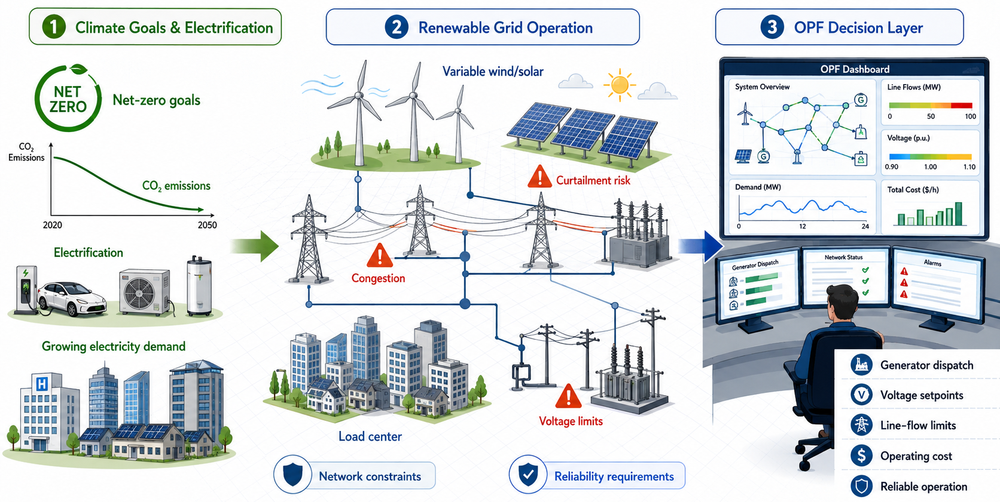



**Figure 1: Why renewable grids need OPF.** Net-zero goals increase electrification and renewable generation. Because renewable output is variable and grid capacity is limited, operators need OPF to choose dispatch and voltage setpoints while respecting network constraints. (*Image note*: AI-assisted illustration created for tutorial use)


**Why OPF is needed.** Optimal Power Flow (OPF) turns a grid model, demand levels, generator limits, network constraints, and an objective into an operating point. In the first technical part of this tutorial, we study the basic AC-OPF setting: minimize generation cost while satisfying AC power-flow equations and engineering limits. This gives us a clear formulation for the technical sections that follow.

In climate-relevant grid operation, better OPF decisions can help reduce renewable curtailment, avoid inefficient dispatch, manage congestion, and maintain reliable service as the generation mix becomes more variable. The rest of the tutorial uses a 5-bus example to make these ideas concrete.

**Transition to the technical tutorial.** We next introduce the power-grid language needed for OPF: buses, branches, generators, loads, active and reactive power, voltage magnitudes, and voltage angles.


> 🧭 **Section guide: Fundamentals of Power Grids**
>
> **Goal:** Learn the grid objects and electrical quantities that appear in AC-OPF.
>
> **Procedure:** Read the grid as a network of buses, branches, generators, and loads; then connect those objects to active/reactive power, voltage magnitude, voltage angle, power balance, and operating limits.
>
> **Output:** A compact vocabulary for reading the AC-OPF formulation, case tables, and solver outputs.
>
> **Visual cue:** Read the next three figures as a scale transition: real transmission grid -> two-bus abstraction -> PJM 5-bus benchmark.


A power grid can be viewed as a network that moves electrical energy from generation resources to electricity demand. Real systems include many layers, but the AC-OPF model in this tutorial focuses on a few core objects:



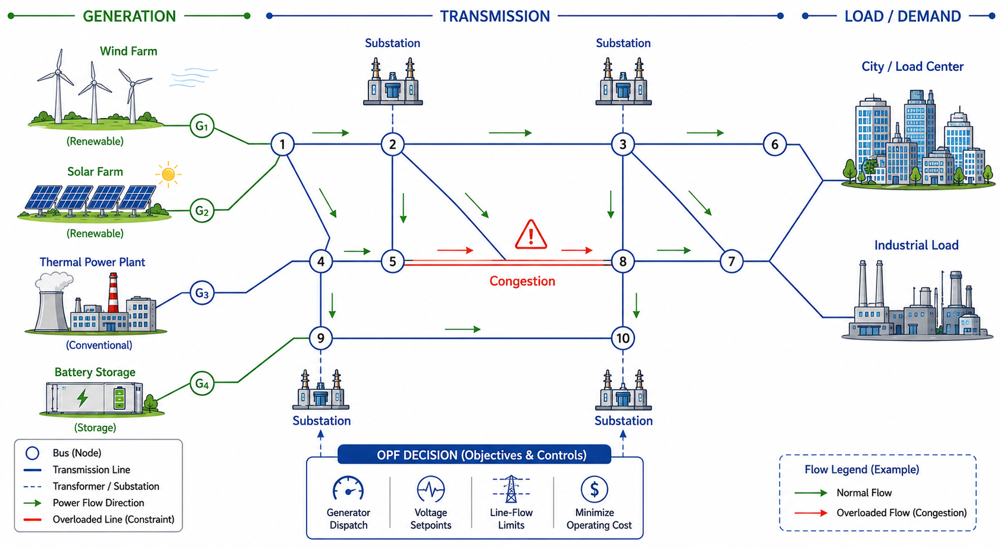



**Figure 2: Large-grid context for OPF.** Generation resources, substations, transmission lines, load centers, power-flow directions, and line limits are the physical objects that motivate the OPF abstraction. (*Image note*: AI-assisted illustration created for tutorial use)

* **Buses:** connection points where generators, loads, and branches meet. Each bus has a voltage magnitude and voltage angle.
* **Generators:** controllable sources that inject active and reactive power into the grid.
* **Loads:** electricity demand that withdraws active and reactive power from the grid.
* **Branches or transmission lines:** network connections that carry power between buses and impose flow limits.
* **Transformers and substations:** equipment that changes voltage levels and connects different parts of the grid. In simple OPF cases, their effects are represented through network parameters.

Real grids contain many more devices and operating layers than we can model in a first tutorial. To make OPF learnable, we abstract the grid into the same core objects used by power-system software: buses, branches, generators, loads, voltages, and limits.

In the 5-bus tutorial case, these objects are deliberately small enough to inspect by hand. The same vocabulary, however, is also used in much larger power-system models.


### Power Grid Fundamentals

Most transmission grids operate with alternating current (AC). In AC systems, voltage and current are represented by both a magnitude and a phase angle. This is why AC-OPF works with complex-valued quantities rather than only scalar power values.

Two quantities appear throughout the tutorial:

* **Complex power:** $S = P + {\rm j}Q$.
  * $P$ is **active power**, the part that performs useful work such as lighting, heating, or motor operation.
  * $Q$ is **reactive power**, which supports voltage levels and electromagnetic fields but does not directly perform useful work.
* **Complex voltage:** $V = V_m e^{{\rm j}\theta}$.
  * $V_m$ is the **voltage magnitude**.
  * $\theta$ is the **voltage angle** relative to a reference bus.

For OPF, these quantities matter because dispatch decisions cannot be evaluated independently at each generator. A change in generation, load, voltage magnitude, or voltage angle affects power flows across the connected network.



#### Power Grid as a Network

AC-OPF models the grid as nodes connected by branches. The diagram below shows the simplest useful network abstraction: buses are the places where injections and withdrawals occur, while branches determine how power can move between those buses.


**Terminology note.** Power-system software and graph-learning papers do not always use the same words. In this tutorial, **bus** and **node/vertex** refer to the same network object; **branch**, **line**, and **edge** all refer to a connection between buses. We usually use power-system terms when discussing OPF (`bus`, `branch`, `generator`, `load`) and graph terms when discussing GNNs (`node`, `edge`, `message passing`).

A few names appear repeatedly in the notebook and in PYPOWER/MATPOWER-style case files:

| Concept in this tutorial | Common graph/ML term | PYPOWER/MATPOWER field | Meaning |
|---|---|---|---|
| bus | node / vertex | `bus_i` | Network connection point where generators, loads, or branches attach |
| branch / transmission line | edge | `fbus`, `tbus`, `r`, `x`, `rateA` | Electrical connection between two buses, with impedance and flow limits |
| load / demand | node feature / input | `Pd`, `Qd` | Active and reactive demand at a bus |
| generator | controllable injection | `Pg`, `Qg`, `Pmax`, `Pmin` | Active/reactive power source with operating limits |
| slack / reference bus | reference node | bus `type = 3` | Bus whose angle is fixed so all voltage angles have a reference |
| per unit (p.u.) | normalized feature scale | `baseMVA` | Normalized electrical units used internally by OPF calculations |



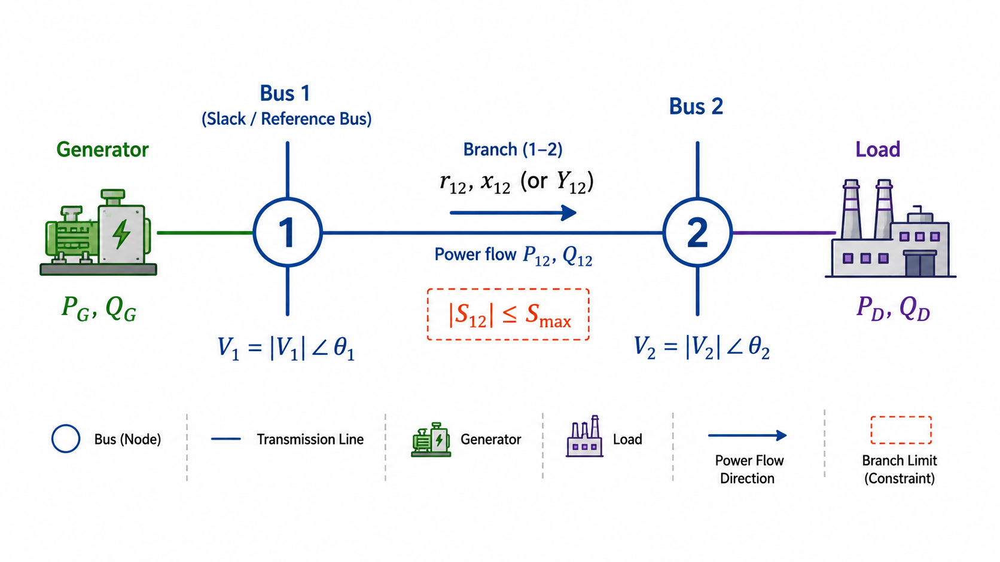



**Figure 3: Two-bus network abstraction.** The same OPF objects from the large-grid context are reduced to two buses, one branch, one generator, one load, voltage variables, branch parameters introduced below, power-flow direction, and a branch-flow limit. (*Image note*: AI-assisted illustration created for tutorial use)

This abstraction is the bridge between the real grid figure above and the PJM 5-bus case below. The 5-bus benchmark is a slightly richer instance of the same bus-branch idea, with enough generators, loads, limits, and costs to run a meaningful AC-OPF solve.


A **bus** is a connection point in the network. It can have a generator, a load, both, or neither. A generator injects power into the bus; a load withdraws power from the bus. The net injection is the difference between generation and demand.

For a bus $i$, the net complex power injection is

$$
S_i = (P_{G,i} - P_{D,i}) + {\rm j}(Q_{G,i} - Q_{D,i}).
$$

Positive net injection means the bus supplies power to the network. Negative net injection means the bus consumes power from the network.



Each bus is described by electrical variables and limits:

* **Active generation $P_G$** and **reactive generation $Q_G$** from connected generators.
* **Active demand $P_D$** and **reactive demand $Q_D$** from connected loads.
* **Voltage magnitude $V_m$**, usually constrained between lower and upper limits.
* **Voltage angle $\theta$**, measured relative to a reference bus.


💡 **Reference/slack bus.** Voltage angles are only meaningful as differences between buses, so OPF fixes one bus as the **reference bus** and sets its angle to zero. In MATPOWER/PYPOWER cases, this bus is marked as the **REF** bus. It is also commonly called the **slack bus** because it absorbs the remaining active-power balance after network losses are determined by the AC power-flow equations. Later, when we use terms like non-reference angles or non-slack generation, they refer to all buses or generators except this special reference/slack bus.

These bus-level quantities are the same quantities that appear in the solver output: demand values define the operating condition, while generator dispatch and voltage variables describe the operating point returned by AC-OPF.



A **branch** or **transmission line** connects two buses and carries power between them. In power-system case files, a line is often specified by resistance $r$ and reactance $x$. AC power-flow calculations convert those line parameters into admittance, commonly written as

$$
Y = g + {\rm j}b.
$$

The relationship is:

$$
z = r + {\rm j}x, \qquad Y = \frac{1}{z} = g + {\rm j}b.
$$

Here $r$ is resistance and $x$ is reactance in the branch impedance. After inversion, $g$ is conductance and $b$ is susceptance in the branch admittance. Intuitively, these parameters determine how strongly two connected buses interact. In most transmission lines, $x$ is much larger than $r$, so reactance and susceptance strongly influence power-flow behavior. Some case files also include line charging or shunt susceptance; that is an additional network parameter, not the same thing as the series-admittance $b$ above.

The power flow on a branch depends on the voltages at both endpoint buses, not only on the amount of generation at one side. This is one reason OPF is a network optimization problem: a local dispatch change can affect flows and constraints elsewhere in the grid.

Branches also have engineering limits. If too much apparent power or current flows through a branch, equipment can overheat or protection systems may be triggered. OPF therefore checks not only generation cost, but also whether line-flow limits are respected.


#### Power Balance

The most important physical requirement in OPF is **power balance**. At every bus, the net power injected by generators and loads must match the power implied by the network voltages and line admittances.

Let $N$ be the set of buses. Write the complex voltage at bus $i$ as

$$
V_i = V_{m,i} e^{\mathrm{j}\theta_i},
$$

where $V_{m,i}$ is voltage magnitude and $\theta_i$ is voltage angle. Let the bus admittance matrix be

$$
Y = G + \mathrm{j}B,
$$

where $G_{ij}$ and $B_{ij}$ are conductance and susceptance entries. The complex net power injection implied by the voltage state is

$$
S_i(V_m,\theta) = P_i(V_m,\theta) + \mathrm{j}Q_i(V_m,\theta)
= V_i \overline{\sum_{j\in N} Y_{ij}V_j}.
$$

Equivalently, with $\theta_{ij}=\theta_i-\theta_j$,

$$
P_i(V_m,\theta)
= V_{m,i}\sum_{j\in N} V_{m,j}\left(G_{ij}\cos\theta_{ij}+B_{ij}\sin\theta_{ij}\right),
$$

$$
Q_i(V_m,\theta)
= V_{m,i}\sum_{j\in N} V_{m,j}\left(G_{ij}\sin\theta_{ij}-B_{ij}\cos\theta_{ij}\right).
$$

The AC power-balance condition at bus $i$ is therefore

$$
P_{G,i}-P_{D,i}=P_i(V_m,\theta),
\qquad
Q_{G,i}-Q_{D,i}=Q_i(V_m,\theta).
$$

Here $P_{G,i}$ and $Q_{G,i}$ are the total active/reactive generation connected to bus $i$, while $P_{D,i}$ and $Q_{D,i}$ are the active/reactive demand at that bus. This is the same notation used later in the AC-OPF formulation and OPF-aware residual metrics.


#### Operating the Power Grid

Grid operation is the task of choosing a feasible and economical operating point. In the basic AC-OPF setting used next, the operator chooses generator outputs and voltage-related variables while respecting network physics and equipment limits.

The main operating considerations are:

* **Generation cost:** producing electricity has operating costs, so dispatch should avoid unnecessarily expensive generation.
* **Power balance:** supply, demand, and network flows must be consistent at every bus.
* **Generator limits:** generators have minimum and maximum active/reactive power capabilities.
* **Voltage limits:** bus voltage magnitudes must remain within acceptable ranges.
* **Branch-flow limits:** transmission lines and transformers cannot safely carry unlimited power.

AC Optimal Power Flow combines these ingredients into one mathematical optimization problem. The next section introduces that formulation and then solves it on the 5-bus case used throughout the tutorial.



<a name="ac-opf"></a>
### AC Optimal Power Flow

The previous section described a power grid as a physical network with buses, branches, generators, loads, voltages, and flow limits. **AC Optimal Power Flow (AC-OPF)** turns those ingredients into an optimization problem: choose an operating point that is economical while satisfying AC power-flow physics and engineering limits.

In this tutorial, we start with the basic single-period, least-cost AC-OPF problem. This restricted formulation is intentional. It gives us a clear solver-generated reference solution and a concrete operating point to inspect.



> 🧭 **Section guide: Basic AC-OPF**
>
> **Goal:** Understand the basic least-cost AC-OPF problem used for the rest of the tutorial.
>
> **Procedure:** Identify the decision variables, objective, equality constraints, inequality constraints, and solver outputs.
>
> **Output:** A solver-generated reference solution for the 5-bus case.
>
> **Visual cue:** Read this section as a pipeline: grid data and load scenario go into the AC-OPF solver; dispatch, voltages, flows, and objective cost come out.



#### AC-OPF Formulation

A compact single-period, least-cost AC-OPF formulation for this tutorial is:

$$
\begin{aligned}
\min_{P_G,Q_G,V_m,\theta} \quad
& \sum_{g \in G} C_g(P_{G,g}) \\
\text{s.t.} \quad
& P_{G,i} - P_{D,i} = P_i(V_m,\theta), && \forall i \in N, \\
& Q_{G,i} - Q_{D,i} = Q_i(V_m,\theta), && \forall i \in N, \\
& P_G^{\min} \le P_G \le P_G^{\max}, \\
& Q_G^{\min} \le Q_G \le Q_G^{\max}, \\
& V_m^{\min} \le V_m \le V_m^{\max}, \\
& |S_{ij}(V_m,\theta)| \le S_{ij}^{\max}, && \forall (i,j) \in E, \\
& \Delta\theta_{ij}^{\min} \le \theta_i - \theta_j \le \Delta\theta_{ij}^{\max}, && \forall (i,j) \in E, \\
& \theta_{\mathrm{ref}} = 0.
\end{aligned}
$$

Read the formulation as follows:

**Set notation:** $N$ denotes the set of buses/nodes, $G$ denotes the set of generators, and $E$ denotes the set of branches/edges. Let $G_i \subseteq G$ denote the generators connected to bus $i$. We use plain letters instead of calligraphic symbols so the notation renders reliably in Colab. If multiple generators are connected to bus $i$, then $P_{G,i}=\sum_{g\in G_i}P_{G,g}$ and $Q_{G,i}=\sum_{g\in G_i}Q_{G,g}$ denote the total bus-level generation.

* **Decision variables:** generator active power $P_G$, generator reactive power $Q_G$, bus voltage magnitude $V_m$, and bus voltage angle $\theta$.
* **Objective:** minimize total generation cost $\sum_g C_g(P_{G,g})$.
* **Power-balance equations:** at each bus, total generation minus demand must equal the nonlinear AC injection functions $P_i(V_m,\theta)$ and $Q_i(V_m,\theta)$ defined in the power-balance section above.
* **Operating bounds:** generator outputs and voltage magnitudes must remain within engineering limits.
* **Branch-flow limits:** apparent power flow $S_{ij}(V_m,\theta)$ on each branch must remain below its thermal rating $S_{ij}^{\max}$.
* **Branch angle-difference limits:** some case files also constrain $\theta_i-\theta_j$ across a branch. These limits are included in the PYPOWER/PGLib branch table through `angmin` and `angmax`.
* **Reference angle:** one bus angle is fixed, usually $\theta_{\mathrm{ref}}=0$, so all other voltage angles have a reference point.

The key point is that AC-OPF is not only a prediction task. It is a constrained nonlinear optimization problem. The nonlinear part comes from AC power-flow equations, where power flows depend on voltage magnitudes and angle differences across the network. Because the feasible region is nonconvex, solving AC-OPF can be computationally expensive, especially as the grid grows.


#### Solver-Based Reference Solutions

Classical OPF solvers provide reference operating points for a specified grid model and load scenario. For a given case, the solver returns generator dispatch, bus voltages, branch flows, and objective cost.

Common solver approaches include:

* **DC approximation:** a simplified linear model (aka. DC-OPF) that focuses on active power and voltage angles. It is fast, but it ignores voltage-magnitude and reactive-power effects.
* **Convex relaxation:** a reformulation that can provide useful bounds or exact solutions in some cases, but may not always recover a feasible AC solution.
* **Nonlinear interior-point methods:** iterative methods that solve the full nonlinear AC-OPF problem directly and are widely used in practical tools.

In this notebook, we use `pypower.runopf` to solve the basic AC-OPF problem on a small 5-bus network. The resulting solver output is our first concrete example of an OPF solution.

#### Case Study: PJM 5-Bus Network



The [PJM 5-bus system](https://github.com/power-grid-lib/pglib-opf/blob/master/pglib_opf_case5_pjm.m) is a small benchmark network with buses, branches, generator costs, generator limits, and loads. It was originally released by PJM for training and has since been adapted in OPF benchmark libraries.

We use this case because it is small enough to inspect by hand but still contains the main ingredients of AC-OPF: multiple generators, loads, transmission limits, voltage limits, and generation costs. Larger benchmark systems are available through [Power Grid Lib](https://power-grid-lib.github.io/), but the 5-bus case is the right scale for a first hands-on AC-OPF tutorial.

Read Figure 4 as the concrete version of the abstraction introduced above: each bus becomes a labeled node, each branch becomes a line with electrical parameters and limits, and each generator/load becomes an injection or withdrawal that enters the OPF equations. The case data tables below use the numerical bus indices used by PYPOWER/MATPOWER. To keep the Colab notebook self-contained, the converted PYPOWER case is defined inline in the next code cell, with the original PGLib source linked above.


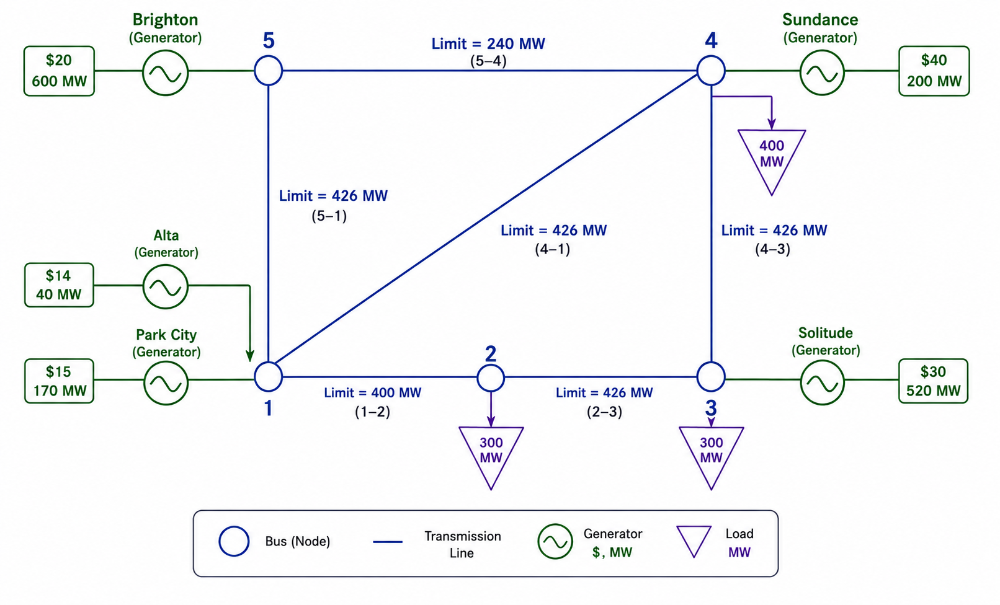



**Figure 4: PJM 5-bus benchmark.** This diagram uses the same bus, branch, generator, load, and line-limit visual language as the two-bus abstraction, but expands it to the five-bus network used by the solver workflow. (*Image note*: AI-assisted illustration created for tutorial use)


The system is a 5-bus grid with generators, loads, and six transmission branches. The case file stores a single grid snapshot: bus parameters, generator limits, line parameters, and generation cost coefficients. We will inspect these tables first, then call an AC-OPF solver on the same network.



In [4]:
# Inline PYPOWER-compatible PJM 5-bus case.
# Source: converted from PGLib-OPF case5_pjm.m.
def case5_pjm():
    return {
        'baseMVA': 100.0,
        'areas': np.array([[1, 4]]),
        'bus': np.array([
            [1, 2, 0.0, 0.0, 0.0, 0.0, 1, 1.00000, 0.00000, 230.0, 1, 1.10000, 0.90000],
            [2, 1, 300.0, 98.61, 0.0, 0.0, 1, 1.00000, 0.00000, 230.0, 1, 1.10000, 0.90000],
            [3, 2, 300.0, 98.61, 0.0, 0.0, 1, 1.00000, 0.00000, 230.0, 1, 1.10000, 0.90000],
            [4, 3, 400.0, 131.47, 0.0, 0.0, 1, 1.00000, 0.00000, 230.0, 1, 1.10000, 0.90000],
            [5, 2, 0.0, 0.0, 0.0, 0.0, 1, 1.00000, 0.00000, 230.0, 1, 1.10000, 0.90000],
        ]),
        'gen': np.array([
            [1, 20.0, 0.0, 30.0, -30.0, 1.0, 100.0, 1, 40.0, 0.0],
            [1, 85.0, 0.0, 127.5, -127.5, 1.0, 100.0, 1, 170.0, 0.0],
            [3, 260.0, 0.0, 390.0, -390.0, 1.0, 100.0, 1, 520.0, 0.0],
            [4, 100.0, 0.0, 150.0, -150.0, 1.0, 100.0, 1, 200.0, 0.0],
            [5, 300.0, 0.0, 450.0, -450.0, 1.0, 100.0, 1, 600.0, 0.0],
        ]),
        'gencost': np.array([
            [2, 0.0, 0.0, 3, 0.000000, 14.000000, 0.000000],
            [2, 0.0, 0.0, 3, 0.000000, 15.000000, 0.000000],
            [2, 0.0, 0.0, 3, 0.000000, 30.000000, 0.000000],
            [2, 0.0, 0.0, 3, 0.000000, 40.000000, 0.000000],
            [2, 0.0, 0.0, 3, 0.000000, 10.000000, 0.000000],
        ]),
        'branch': np.array([
            [1, 2, 0.00281, 0.0281, 0.00712, 400.0, 400.0, 400.0, 0.0, 0.0, 1, -30.0, 30.0],
            [1, 4, 0.00304, 0.0304, 0.00658, 426.0, 426.0, 426.0, 0.0, 0.0, 1, -30.0, 30.0],
            [1, 5, 0.00064, 0.0064, 0.03126, 426.0, 426.0, 426.0, 0.0, 0.0, 1, -30.0, 30.0],
            [2, 3, 0.00108, 0.0108, 0.01852, 426.0, 426.0, 426.0, 0.0, 0.0, 1, -30.0, 30.0],
            [3, 4, 0.00297, 0.0297, 0.00674, 426.0, 426.0, 426.0, 0.0, 0.0, 1, -30.0, 30.0],
            [4, 5, 0.00297, 0.0297, 0.00674, 240.0, 240.0, 240.0, 0.0, 0.0, 1, -30.0, 30.0],
        ]),
    }


import copy
from pypower import idx_bus
from pypower.api import ext2int


def build_opf_context(net, case_name='PGLib-compatible case'):
    """Build the small schema object used by data, models, and OPF-aware metrics.

    The tutorial still uses PJM Case 5, but this helper keeps the downstream
    code tied to a PYPOWER/PGLib-style case object rather than to fixed column
    positions or a hard-coded number of buses.
    """
    case_int = ext2int(copy.deepcopy(net))
    bus = case_int['bus']
    gen = case_int['gen']
    branch = case_int['branch']

    nbus = len(bus)
    ngen = len(gen)
    nbranch = len(branch)
    load_bus = np.where((bus[:, idx_bus.PD] != 0) | (bus[:, idx_bus.QD] != 0))[0].astype(int)
    ref_candidates = np.where(bus[:, idx_bus.BUS_TYPE] == idx_bus.REF)[0]
    ref_bus = int(ref_candidates[0]) if len(ref_candidates) else 0

    load_p = [f'pd_bus_{i}' for i in load_bus]
    load_q = [f'qd_bus_{i}' for i in load_bus]
    gen_p = [f'pg_gen_{g}' for g in range(ngen)]
    gen_q = [f'qg_gen_{g}' for g in range(ngen)]
    bus_vm = [f'vm_bus_{i}' for i in range(nbus)]
    bus_va = [f'va_bus_{i}' for i in range(nbus)]

    output_slices = {
        'pg': slice(0, ngen),
        'qg': slice(ngen, 2 * ngen),
        'vm': slice(2 * ngen, 2 * ngen + nbus),
        'va': slice(2 * ngen + nbus, 2 * ngen + 2 * nbus),
    }

    return {
        'case_name': case_name,
        'net': net,
        'case_int': case_int,
        'nbus': nbus,
        'ngen': ngen,
        'nbranch': nbranch,
        'load_bus': load_bus,
        'ref_bus': ref_bus,
        'load_p': load_p,
        'load_q': load_q,
        'gen_p': gen_p,
        'gen_q': gen_q,
        'bus_vm': bus_vm,
        'bus_va': bus_va,
        'inputs': load_p + load_q,
        'outputs': gen_p + gen_q + bus_vm + bus_va,
        'output_slices': output_slices,
    }


net = case5_pjm()
context = build_opf_context(net, case_name='PGLib/PJM Case 5')
print('Loaded inline PJM 5-bus PYPOWER case')
print('bus/gen/branch shapes:', net['bus'].shape, net['gen'].shape, net['branch'].shape)
print('canonical input/output sizes:', len(context['inputs']), len(context['outputs']))


Loaded inline PJM 5-bus PYPOWER case
bus/gen/branch shapes: (5, 13) (5, 10) (6, 13)
canonical input/output sizes: 6 20


In [5]:
bus = pd.DataFrame(net['bus'], columns=['bus_i', 'type',	'Pd',	'Qd',	'Gs',	'Bs',
                            'area',	'Vm',	'Va',	'baseKV',	'zone',	'Vmax',	'Vmin'])
nbus = len(bus)
bus


,bus_i,type,Pd,Qd,Gs,Bs,area,Vm,Va,baseKV,zone,Vmax,Vmin
0,1.0,2.0,0.0,0.00,0.0,0.0,1.0,1.0,0.0,230.0,1.0,1.1,0.9
1,2.0,1.0,300.0,98.61,0.0,0.0,1.0,1.0,0.0,230.0,1.0,1.1,0.9
2,3.0,2.0,300.0,98.61,0.0,0.0,1.0,1.0,0.0,230.0,1.0,1.1,0.9
3,4.0,3.0,400.0,131.47,0.0,0.0,1.0,1.0,0.0,230.0,1.0,1.1,0.9
4,5.0,2.0,0.0,0.00,0.0,0.0,1.0,1.0,0.0,230.0,1.0,1.1,0.9


The bus table describes the network nodes. The fields we will use most are:

* `type`: MATPOWER/PYPOWER bus-type code. `1` is a **PQ/load bus**, `2` is a **PV/generator-voltage bus**, `3` is the **REF/slack bus**, and `4` is an isolated bus.
* `Pd`, `Qd`: active and reactive demand. These define the load condition that OPF must serve.
* `Vm`, `Va`: initial voltage magnitude and angle in the PYPOWER/MATPOWER case table. This case-format `Va` column is in degrees; the later ML label columns `va_bus_*` are converted to radians.
* `Vmax`, `Vmin`: voltage-magnitude limits used as AC-OPF constraints.

In the PJM 5-bus case, bus 4 is the reference/slack bus and also has load. Buses 1, 3, and 5 are generator-voltage buses; bus 2 is a PQ/load bus; bus 3 also has load but is encoded as type 2 because it has generator voltage control. The remaining columns (`Gs`, `Bs`, `area`, `baseKV`, and `zone`) provide shunt, voltage-base, and grouping information; they are part of the case format but are not central to the later solver and data workflow.


In [6]:
gen = pd.DataFrame(net['gen'], columns = ['bus',	'Pg',	'Qg',
                              'Qmax',	'Qmin',	'Vg',
                              'mBase',	'status',	'Pmax',	'Pmin'])
gen


,bus,Pg,Qg,Qmax,Qmin,Vg,mBase,status,Pmax,Pmin
0,1.0,20.0,0.0,30.0,-30.0,1.0,100.0,1.0,40.0,0.0
1,1.0,85.0,0.0,127.5,-127.5,1.0,100.0,1.0,170.0,0.0
2,3.0,260.0,0.0,390.0,-390.0,1.0,100.0,1.0,520.0,0.0
3,4.0,100.0,0.0,150.0,-150.0,1.0,100.0,1.0,200.0,0.0
4,5.0,300.0,0.0,450.0,-450.0,1.0,100.0,1.0,600.0,0.0


The generator table describes controllable sources. The fields we will use most are:

* `bus`: bus where the generator is connected.
* `Pg`, `Qg`: initial active and reactive generation values. OPF solves for updated generator outputs.
* `Pmax`, `Pmin`: active-power generation limits used as OPF constraints.
* `Qmax`, `Qmin`: reactive-power generation limits used as OPF constraints.

The remaining fields give the voltage setpoint (`Vg`), generator MVA base (`mBase`), and online/offline status (`status`). In this tutorial case, all generators are online, and the solver adjusts their outputs within the active/reactive limits to serve demand at minimum cost.


In [7]:
line = pd.DataFrame(net['branch'], columns = ['fbus',	'tbus',	'r',	'x',	'b',
                               'rateA',	'rateB',	'rateC',	'ratio',
                               'angle',	'status',	'angmin',	'angmax'] )
line


,fbus,tbus,r,x,b,rateA,rateB,rateC,ratio,angle,status,angmin,angmax
0,1.0,2.0,0.00281,0.0281,0.00712,400.0,400.0,400.0,0.0,0.0,1.0,-30.0,30.0
1,1.0,4.0,0.00304,0.0304,0.00658,426.0,426.0,426.0,0.0,0.0,1.0,-30.0,30.0
2,1.0,5.0,0.00064,0.0064,0.03126,426.0,426.0,426.0,0.0,0.0,1.0,-30.0,30.0
3,2.0,3.0,0.00108,0.0108,0.01852,426.0,426.0,426.0,0.0,0.0,1.0,-30.0,30.0
4,3.0,4.0,0.00297,0.0297,0.00674,426.0,426.0,426.0,0.0,0.0,1.0,-30.0,30.0
5,4.0,5.0,0.00297,0.0297,0.00674,240.0,240.0,240.0,0.0,0.0,1.0,-30.0,30.0


The branch table describes the six transmission connections. The fields we will use most are:

* `fbus`, `tbus`: from-bus and to-bus endpoints of the branch.
* `r`, `x`, `b`: branch electrical parameters used in AC power-flow calculations.
* `rateA`: the main thermal branch-flow limit used in this tutorial.
* `angmin`, `angmax`: allowed voltage-angle difference across the branch.

The remaining fields give secondary ratings (`rateB`, `rateC`), transformer tap/phase-shift parameters (`ratio`, `angle`), and branch status. In this case the transformer fields are zero and all branches are in service, so the rows behave like ordinary transmission lines.


In [8]:
gen_cost = pd.DataFrame(net['gencost'],
                        columns = ['order_poly', 'startup', 'shutdown', 'num_coefficient', 'c2', 'c1', 'c0'])
gen_cost


,order_poly,startup,shutdown,num_coefficient,c2,c1,c0
0,2.0,0.0,0.0,3.0,0.0,14.0,0.0
1,2.0,0.0,0.0,3.0,0.0,15.0,0.0
2,2.0,0.0,0.0,3.0,0.0,30.0,0.0
3,2.0,0.0,0.0,3.0,0.0,40.0,0.0
4,2.0,0.0,0.0,3.0,0.0,10.0,0.0


The generation-cost table defines the OPF objective. The fields we will use most are:

* `c2`, `c1`, `c0`: quadratic, linear, and constant coefficients in the generator cost function.
* `num_coefficient`: number of polynomial coefficients in the cost curve.

For this case, `c2 = 0`, so the objective is linear in active generation: $C_g(P_{G,g}) = c_{1,g} P_{G,g} + c_{0,g}$. Lower `c1` means cheaper generation, but the solver cannot simply use the cheapest generator only because generator limits, voltage constraints, and branch-flow limits must also hold. The remaining fields specify the MATPOWER/PYPOWER cost model type (`order_poly`) and startup/shutdown costs, which are zero in this static single-period example.

**Solve AC-OPF**

At this point we have translated the 5-bus case file into the ingredients of AC-OPF:

* **decision variables:** generator outputs and bus voltages;
* **objective:** generation cost from the `gencost` table;
* **equality constraints:** AC power balance at each bus;
* **inequality constraints:** generator limits, voltage limits, branch-flow limits, and branch-angle limits.

The next step is to actually solve this AC-OPF problem. We call [PYPOWER](https://rwl.github.io/PYPOWER/api/) to compute the least-cost feasible operating point for this single grid snapshot, then inspect the dispatch, voltages, line flows, and objective value returned by the solver.


In [9]:
# import the solver and solver options from pypower
from pypower.api import runopf, ppoption

# Run AC-OPF to get the least-cost feasible operating point.
option = ppoption(OUT_ALL=1) # set the output details
result = runopf(net, option) # run the AC-OPF
if not result['success']:
    raise RuntimeError('AC-OPF did not converge for the PJM 5-bus reference case.')


PYPOWER Version 5.1.21, 01-Aug-2026 -- AC Optimal Power Flow
Python Interior Point Solver - PIPS, Version 1.0, 07-Feb-2011


Converged!

Converged in 0.17 seconds
Objective Function Value = 17551.89 $/hr
|     System Summary                                                           |

How many?                How much?              P (MW)            Q (MVAr)
---------------------    -------------------  -------------  -----------------
Buses              5     Total Gen Capacity    1530.0       -1147.5 to 1147.5
Generators         5     On-line Capacity      1530.0       -1147.5 to 1147.5
Committed Gens     5     Generation (actual)   1005.2             371.7
Loads              3     Load                  1000.0             328.7
  Fixed            3       Fixed               1000.0             328.7
  Dispatchable     0       Dispatchable           0.0 of 0.0        0.0
Shunts             0     Shunt (inj)              0.0               0.0
Branches           6     Losses (I^2 * Z)         5.19             51.92
Transformers       0     Branch Charging (inj)     -                9.0
Inter-ties         0    

The solver returns an optimal operating point for this 5-bus snapshot, including active/reactive generator outputs, bus voltage magnitudes and angles, branch power flows, and total generation cost.

For one snapshot, calling the solver directly is exactly what we want. The motivation for machine learning appears when the same type of solve must be repeated many times: for many load scenarios, forecast samples, planning studies, or sensitivity analyses. The next part uses this repeated-solve viewpoint to build a supervised-learning dataset, where each load scenario is paired with the AC-OPF solution produced by the solver.



<a name="part-3-ml-surrogate"></a>
## **Part 3. Machine Learning for AC-OPF**

After solving one AC-OPF snapshot, we now turn repeated solver calls into a learning problem. This part explains why ML is useful for repeated OPF studies, builds the supervised dataset, and trains the first baseline surrogate.


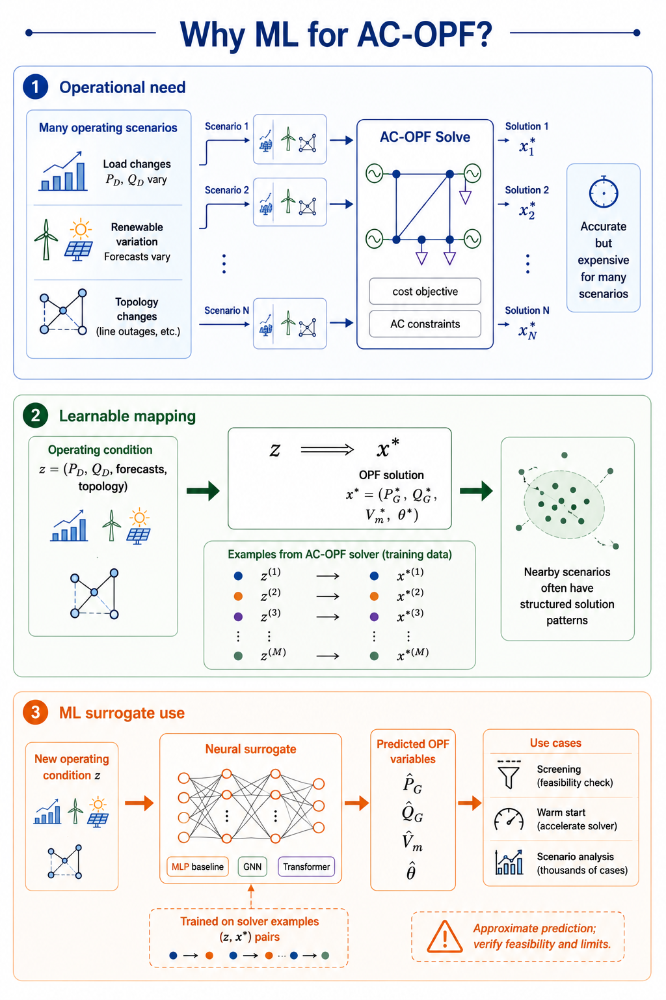


**Figure 5: Motivation for ML-assisted AC-OPF.** The figure connects three ideas: repeated AC-OPF solves create computational pressure; solved examples define a mapping from operating conditions to OPF solutions; neural surrogates can approximate that mapping for fast screening, warm starts, or scenario analysis, while final operating decisions still require feasibility checks and operator/solver validation. (*Image note*: AI-assisted illustration created for tutorial use)


> 🧭 **Section guide: Machine Learning for AC-OPF**
>
> **Goal:** Turn repeated AC-OPF solves into a supervised-learning problem.
>
> **Procedure:** Define the input scenario, define the solver label, train a baseline MLP, and first evaluate it with MSE.
>
> **Output:** A baseline neural surrogate that predicts OPF solution variables from load demand.
>
> **Important:** ML predictions are approximate solver outputs, not feasibility certificates.


Why introduce ML after solving one AC-OPF case?

For a single grid snapshot, the solver is the right tool: it directly enforces the objective, AC power-flow equations, and operating limits. The ML motivation appears when similar OPF problems must be solved repeatedly, for example across many load scenarios, forecast samples, planning studies, or contingency screens.

Under a fixed grid model and a similar operating regime, these repeated solves define a structured mapping

$$
z \longmapsto x^*,
$$

where $z$ is the operating condition and $x^*$ is the solver-produced OPF solution. A neural network does not replace the OPF formulation or the system operator. It learns an approximation of this solver-generated mapping from examples. In practice, this type of model is better understood as decision support: fast screening, warm-start generation, scenario exploration, or solver-assisted analysis, not direct mission-critical dispatch.


A practical ML-assisted OPF workflow should therefore be read as:

```text
operating scenario -> ML candidate -> OPF-aware checks -> repair or warm start -> trusted solver/operator validation
```

This workflow is the reason the later sections report feasibility, cost, runtime, and documentation metrics instead of only reporting MSE.

The useful but limited promise is speed: a trained model can produce fast approximate outputs for screening, warm starts, or scenario analysis. The risk is feasibility: a prediction can look numerically close to the solver label while violating power balance or operating limits. We first build the simplest MSE-trained baseline, then evaluate its limitations after the baseline is complete.


The supervised-learning task in this tutorial is:

$$
z_i = (P_D, Q_D)_i,
\qquad
x_i^* = (P_G^*, Q_G^*, V_m^*, \theta^*)_i.
$$

Here, $z_i$ is the active/reactive load condition for scenario $i$, and $x_i^*$ is the AC-OPF solution returned by the solver. We will:

1. demonstrate how repeated AC-OPF solves generate input-label pairs;
2. load a prepared OPFLearn dataset so the notebook runs quickly;
3. train a baseline MLP with MSE;
4. evaluate the baseline first with MSE.

For broader research context, see the [ML-OPF Wiki](https://energy.hosting.acm.org/wiki/index.php/ML_OPF_wiki).


### Training Data Generation

The code below demonstrates the data-generation mechanism on a small sample. We perturb the active/reactive demand in the fixed PJM 5-bus case, solve AC-OPF for each perturbed scenario, and store the solver outputs.

This demonstration is intentionally small. It shows where the supervised labels come from, but it is **not** the full training dataset used later. For actual model training, we load a prepared OPFLearn dataset after this demonstration.


In [10]:
from pypower import idx_bus, idx_gen, idx_brch
from tqdm import tqdm
import copy

nbus = len(net['bus'])
ngen = len(net['gen'])
basemva = net['baseMVA']
case5_base = copy.deepcopy(net)
PD_base = case5_base['bus'][:, idx_bus.PD]
QD_base = case5_base['bus'][:, idx_bus.QD]

## Let's consider a small datasize
data_size = 10
## We randomly sample load demand from its default value
PD_data = PD_base * np.random.uniform(0.9, 1.1, [data_size, 1])
QD_data = QD_base * np.random.uniform(0.9, 1.1, [data_size, 1])
PG_data = np.zeros([data_size, ngen])
QG_data = np.zeros([data_size, ngen])
VM_data = np.zeros([data_size, nbus])
VA_data = np.zeros([data_size, nbus])
## Then, for each load demand, we run the solver to obtain the optimal solution.
for i in tqdm(range(data_size)):
  sample_case = copy.deepcopy(case5_base)
  sample_case['bus'][:, idx_bus.PD] = PD_data[i]
  sample_case['bus'][:, idx_bus.QD] = QD_data[i]
  option = ppoption(VERBOSE=0, OUT_ALL=0)
  result = runopf(sample_case, option)
  if not result['success']:
      raise RuntimeError(f'AC-OPF failed for generated scenario {i}.')
  PG_data[i] = result['gen'][:, idx_gen.PG]
  QG_data[i] = result['gen'][:, idx_gen.QG]
  VM_data[i] = result['bus'][:, idx_bus.VM]
  # PYPOWER reports voltage angles in degrees; the tutorial schema stores radians.
  VA_data[i] = np.deg2rad(result['bus'][:, idx_bus.VA])


  0%|          | 0/10 [00:00<?, ?it/s]

 10%|█         | 1/10 [00:00<00:01,  5.99it/s]

 20%|██        | 2/10 [00:00<00:01,  6.02it/s]

 30%|███       | 3/10 [00:00<00:01,  6.08it/s]

 40%|████      | 4/10 [00:00<00:00,  6.08it/s]

 50%|█████     | 5/10 [00:00<00:00,  6.07it/s]

 60%|██████    | 6/10 [00:00<00:00,  6.05it/s]

 70%|███████   | 7/10 [00:01<00:00,  6.07it/s]

 80%|████████  | 8/10 [00:01<00:00,  6.03it/s]

 90%|█████████ | 9/10 [00:01<00:00,  6.05it/s]

100%|██████████| 10/10 [00:01<00:00,  6.11it/s]

100%|██████████| 10/10 [00:01<00:00,  6.07it/s]

The loop above is a small label-generation demonstration: it shows how load scenarios become input-label pairs through repeated AC-OPF solves. The temporary arrays in this demo follow PYPOWER's native convention: powers are in MW/MVAr and voltage angles from the solver are converted from degrees to radians for consistency with the later ML schema.

For actual model training, we next load a prepared OPFLearn dataset with many solved Case 5 scenarios, rather than generating a large dataset inside the notebook.


<a name="data-description"></a>
### Import Prepared Training Data

The prepared dataset contains many load profiles and their corresponding optimal AC-OPF solutions for the PJM 5-bus case. We use it to avoid spending the tutorial runtime on thousands of solver calls.

The data comes from OPFLearn / OPFLearnData. More information is available in the OPFLearn.jl documentation and dataset page: [OPFLearn.jl](https://github.com/NREL/OPFLearn.jl) and [OPFLearnData](https://data.nlr.gov/submissions/177).




The following cell downloads the Case 5 CSV file into the current Colab runtime directory if it is not already cached.



In [11]:
# Prepare the OPFLearn/PGLib Case 5 training dataset.
from pathlib import Path
import urllib.request

DATA_PATH = Path('pglib_opf_case5_pjm.csv')
DATA_URL = 'https://data.nlr.gov/system/files/177/pglib_opf_case5_pjm.csv'
EXPECTED_FIRST_COLUMN = 'load1:pl'
EXPECTED_VOLTAGE_COLUMN = 'bus1:v_bus'


def dataset_has_expected_layout(path=DATA_PATH):
    columns = pd.read_csv(path, nrows=0).columns.tolist()
    return len(columns) >= 26 and columns[0] == EXPECTED_FIRST_COLUMN and columns[21] == EXPECTED_VOLTAGE_COLUMN


def download_case5_dataset(data_path=DATA_PATH):
    if not data_path.exists():
        print('Downloading OPFLearn/PGLib Case 5 dataset...')
        with urllib.request.urlopen(DATA_URL, timeout=60) as response:
            data_path.write_bytes(response.read())

    if not dataset_has_expected_layout(data_path):
        raise ValueError(f'Unexpected OPFLearn CSV layout: {data_path}')

    print(f'Using OPFLearn dataset: {data_path}')
    return data_path


def parse_complex_string(value):
    value = str(value).replace(' + ', '+').replace(' - ', '-').replace('j', 'j').strip()
    return complex(value)



def correct_opflearn_case5_voltage(value):
    """Correct the OPFLearn Case 5 complex-voltage phase and return a complex voltage.

    This is a dataset-specific correction for this OPFLearn Case 5 CSV, not a
    general rule for OPF datasets. In this file, the stored `v_bus` phase does
    not directly match the physical voltage-angle convention used by the
    PYPOWER/PGLib case. Empirically, the stored phase is `-deg2rad(theta_true_rad)`, 
    so `-rad2deg(stored_phase_rad)` recovers the physical voltage angle in radians for this dataset.

    Before training an ML model on any OPF dataset, always check that the data
    conventions are reasonable: units, bus/generator ordering, per-unit bases,
    reference angle, and power-balance residuals should all be consistent with
    the grid case used for evaluation.
    """
    voltage = parse_complex_string(value)
    magnitude_pu = abs(voltage)
    stored_phase_rad = np.angle(voltage)
    corrected_angle_rad = -np.rad2deg(stored_phase_rad)
    return magnitude_pu * np.exp(1j * corrected_angle_rad)


def load_clean_opflearn_case5_csv(data_path=DATA_PATH):
    """Load OPFLearn Case 5 and apply its dataset-specific voltage-angle correction."""
    raw = pd.read_csv(data_path)
    voltage_columns = [column for column in raw.columns if column.endswith(':v_bus')]

    for column in voltage_columns:
        corrected_voltage = raw[column].map(correct_opflearn_case5_voltage)
        raw[column] = corrected_voltage

    return raw


download_case5_dataset()

Using OPFLearn dataset: pglib_opf_case5_pjm.csv


PosixPath('pglib_opf_case5_pjm.csv')

### Data Exploration

We now inspect the prepared CSV after dataset-specific loading/cleaning. Each row is one solved AC-OPF scenario. The next few cells show: a sample of rows, the dataset shape, and a compact preview of the column names.


In [12]:
raw_df = load_clean_opflearn_case5_csv(DATA_PATH)
raw_df.head()


,load1:pl,load2:pl,load3:pl,load1:ql,load2:ql,load3:ql,gen1:pg,gen2:pg,gen3:pg,gen4:pg,...,line3:p_fr_max,line4:p_fr_max,line5:p_fr_max,line6:p_fr_max,line1:q_fr_max,line2:q_fr_max,line3:q_fr_max,line4:q_fr_max,line5:q_fr_max,line6:q_fr_max
0,6.570765,2.275993,4.051883,4.376283,0.628149,4.026378,0.4,1.7,4.876424,1.558644,...,-0.000002,-0.000003,-2.720498e-07,-0.000006,0.000000e+00,0.0,-7.933284e-07,-1.873404e-06,0.0,-3.069352e-06
1,6.552550,1.704638,4.090173,4.400894,0.724693,3.937011,0.4,1.7,4.317437,1.531758,...,-0.000002,-0.000003,-2.624331e-07,-0.000006,0.000000e+00,0.0,-7.848656e-07,-1.892890e-06,0.0,-2.936123e-06
2,5.645406,2.029723,5.955067,1.377338,0.865517,3.240306,0.4,1.7,5.199999,1.490930,...,-0.000002,-0.000002,0.000000e+00,-0.000280,-1.365476e-07,0.0,0.000000e+00,-8.479213e-07,0.0,-3.177477e-07
3,4.778645,2.417017,6.361179,0.843277,0.881531,2.635903,0.4,1.7,5.200000,1.644658,...,-0.000001,-0.000001,0.000000e+00,-0.647117,-3.141235e-07,0.0,0.000000e+00,-7.238938e-07,0.0,-6.550166e-09
4,5.690040,2.458801,5.745494,2.003454,1.119158,3.286294,0.4,1.7,5.200000,1.684051,...,-0.000002,-0.000002,-5.028490e-09,-0.000067,0.000000e+00,0.0,0.000000e+00,-9.201327e-07,0.0,-6.686726e-07


In [13]:
raw_df.shape


(10000, 104)

In [14]:
column_preview = pd.DataFrame({
    'first_columns': pd.Series(raw_df.columns[:12]),
    'last_columns': pd.Series(raw_df.columns[-12:]),
})
column_preview


,first_columns,last_columns
0,load1:pl,line1:p_fr_max
1,load2:pl,line2:p_fr_max
2,load3:pl,line3:p_fr_max
3,load1:ql,line4:p_fr_max
4,load2:ql,line5:p_fr_max
5,load3:ql,line6:p_fr_max
6,gen1:pg,line1:q_fr_max
7,gen2:pg,line2:q_fr_max
8,gen3:pg,line3:q_fr_max
9,gen4:pg,line4:q_fr_max


The prepared CSV contains many solved scenarios and many columns. We inspect only the columns we need for the first supervised-learning task:

* **features:** active and reactive load values;
* **labels:** selected solver outputs: generator active/reactive power and bus voltage magnitude/angle.

One important cleaning step has already happened in the dataset loader: the OPFLearn Case 5 `v_bus` columns have a dataset-specific phase convention issue. The loader converts the stored phase into the physical voltage-angle convention used by the PYPOWER/PGLib case and the OPF-aware metrics. After this correction, the later schema conversion can treat `v_bus` normally.

The raw OPFLearn Case 5 file has its own column layout. Before training, we convert it into a small **canonical ML schema** tied to the PYPOWER/PGLib case loaded above.

For each scenario, the model input is the active and reactive demand at the load buses:

$$
z_i = (P_D, Q_D)_i.
$$

In the canonical schema, these columns are named `pd_bus_*` and `qd_bus_*`. This keeps the later dataset and training code independent of the raw CSV column order.


In [15]:
def standardize_opflearn_case5_csv(raw_df, context):
    """Dataset adapter for the prepared OPFLearn Case 5 CSV.

    This is not a general PGLib case converter. It only translates this CSV's
    fixed column groups into the tutorial's canonical ML schema:
    inputs = (Pd, Qd), outputs = (Pg, Qg, Vm, Va).
    """
    nload = len(context['load_bus'])
    ngen = context['ngen']
    nbus = context['nbus']
    canonical_df = pd.DataFrame(index=raw_df.index)

    def copy_columns(target_columns, start_column):
        stop_column = start_column + len(target_columns)
        canonical_df[target_columns] = raw_df.iloc[:, start_column:stop_column].to_numpy()

    copy_columns(context['load_p'], 0)
    copy_columns(context['load_q'], nload)
    copy_columns(context['gen_p'], 2 * nload)
    copy_columns(context['gen_q'], 2 * nload + ngen)

    # The raw CSV also includes generator voltage-setpoint columns after Qg.
    # The ML target uses bus complex voltages, which start after those columns.
    voltage_start = 2 * nload + 3 * ngen
    voltage_columns = raw_df.columns[voltage_start:voltage_start + nbus]
    if len(voltage_columns) != nbus:
        raise ValueError('Could not find one complex-voltage column per bus in the OPFLearn CSV.')

    for vm_column, va_column, raw_column in zip(context['bus_vm'], context['bus_va'], voltage_columns):
        complex_voltage = raw_df[raw_column]
        canonical_df[vm_column] = complex_voltage.map(abs)
        canonical_df[va_column] = complex_voltage.map(np.angle)

    return canonical_df[context['inputs'] + context['outputs']]


df = standardize_opflearn_case5_csv(raw_df, context)
load_p = context['load_p']
load_q = context['load_q']
gen_p = context['gen_p']
gen_q = context['gen_q']
bus_vm = context['bus_vm']
bus_va = context['bus_va']
inputs = context['inputs']
outputs = context['outputs']

print('Canonical input columns:', inputs)
print('Canonical output columns:', outputs)

Canonical input columns: ['pd_bus_1', 'pd_bus_2', 'pd_bus_3', 'qd_bus_1', 'qd_bus_2', 'qd_bus_3']
Canonical output columns: ['pg_gen_0', 'pg_gen_1', 'pg_gen_2', 'pg_gen_3', 'pg_gen_4', 'qg_gen_0', 'qg_gen_1', 'qg_gen_2', 'qg_gen_3', 'qg_gen_4', 'vm_bus_0', 'vm_bus_1', 'vm_bus_2', 'vm_bus_3', 'vm_bus_4', 'va_bus_0', 'va_bus_1', 'va_bus_2', 'va_bus_3', 'va_bus_4']


The output columns are solver solution variables. For each load scenario, we collect:

* generator active power `pg_gen_*` and reactive power `qg_gen_*`;
* bus voltage magnitude `vm_bus_*`;
* bus voltage angle `va_bus_*`.

These labels form the target vector

$$
x_i^* = (P_G^*, Q_G^*, V_m^*, \theta^*)_i.
$$

Voltage values are stored as complex numbers in the CSV. For this OPFLearn Case 5 file, the raw complex phase is not directly the physical voltage angle; the loader applies the dataset-specific correction described above. After that correction, the canonical schema conversion does the ordinary operation: `abs(v_bus)` gives voltage magnitude and `np.angle(v_bus)` gives voltage angle in **radians**. The sanity check in the OPF-aware metric section verifies the result by checking that solver labels have near-zero power-balance residual on the test set.

In [16]:
print('Canonical dataset shape:', df.shape)
df.head()


Canonical dataset shape: (10000, 26)


,pd_bus_1,pd_bus_2,pd_bus_3,qd_bus_1,qd_bus_2,qd_bus_3,pg_gen_0,pg_gen_1,pg_gen_2,pg_gen_3,...,vm_bus_0,vm_bus_1,vm_bus_2,vm_bus_3,vm_bus_4,va_bus_0,va_bus_1,va_bus_2,va_bus_3,va_bus_4
0,6.570765,2.275993,4.051883,4.376283,0.628149,4.026378,0.4,1.7,4.876424,1.558644,...,1.088747,1.027343,1.058290,1.055571,1.100000,0.031466,-0.047701,-0.018030,-1.044813e-31,0.044278
1,6.552550,1.704638,4.090173,4.400894,0.724693,3.937011,0.4,1.7,4.317437,1.531758,...,1.088817,1.027087,1.058152,1.056337,1.100000,0.032032,-0.046907,-0.017335,-7.842915e-32,0.044911
2,5.645406,2.029723,5.955067,1.377338,0.865517,3.240306,0.4,1.7,5.199999,1.490930,...,1.081929,1.080142,1.100000,1.064614,1.076183,0.046786,-0.020623,0.003993,-4.099984e-33,0.061261
3,4.778645,2.417017,6.361179,0.843277,0.881531,2.635903,0.4,1.7,5.200000,1.644658,...,1.073330,1.082470,1.100000,1.059389,1.064221,0.049556,-0.011662,0.007987,3.173137e-36,0.063242
4,5.690040,2.458801,5.745494,2.003454,1.119158,3.286294,0.4,1.7,5.200000,1.684051,...,1.095219,1.079232,1.100000,1.075028,1.093446,0.043703,-0.025925,-0.002590,2.562954e-33,0.058019


**Data Visualizations**

Before training, we inspect the distributions of the selected features and labels. This is a small but important data-diagnostic step.

We check:

* the scale and units of each variable;
* the typical range of operating scenarios seen during training;
* whether a target is nearly constant, strongly skewed, or often near a physical limit;
* whether voltage-angle labels are being interpreted in the intended radian-valued convention.

The helper functions below report compact summary statistics and plot histograms with the mean and 5%-95% range marked.


In [17]:
def variable_unit(variable_name):
    if variable_name.startswith('pd_bus_'):
        return 'active load (p.u.)'
    if variable_name.startswith('qd_bus_'):
        return 'reactive load (p.u.)'
    if variable_name.startswith('pg_gen_'):
        return 'active generation (p.u.)'
    if variable_name.startswith('qg_gen_'):
        return 'reactive generation (p.u.)'
    if variable_name.startswith('vm_bus_'):
        return 'voltage magnitude (p.u.)'
    if variable_name.startswith('va_bus_'):
        return 'voltage angle (rad.)'
    return 'value'


def summarize_variables(variables):
    summary = df[variables].describe(percentiles=[0.05, 0.95]).T
    summary = summary[['mean', 'std', 'min', '5%', '95%', 'max']]
    summary.insert(0, 'unit', [variable_unit(name) for name in variables])
    return summary.round(4)


def plot_hist_variables(variables, title=None, bins=30):
    fig, axs = plt.subplots(
        nrows=1,
        ncols=len(variables),
        figsize=(max(len(variables) * 3.0, 6), 3.1),
        squeeze=False,
    )
    axs = axs[0]

    for ax, variable_name in zip(axs, variables):
        values = df[variable_name]
        mean_value = values.mean()
        q05, q95 = values.quantile([0.05, 0.95])

        ax.hist(values, bins=bins, density=True, color='#6f8fb8', alpha=0.82, edgecolor='white')
        ax.axvline(mean_value, color='#222222', linestyle='--', linewidth=1.8, label='mean')
        ax.axvline(q05, color='#b35d4d', linestyle=':', linewidth=1.8, label='5%-95%')
        ax.axvline(q95, color='#b35d4d', linestyle=':', linewidth=1.8)
        ax.set_title(variable_name, fontsize=11)
        ax.set_xlabel(variable_unit(variable_name), fontsize=10)
        ax.set_ylabel('density', fontsize=9)
        ax.tick_params(axis='both', labelsize=8)
        ax.grid(alpha=0.18)
        ax.text(
            0.03, 0.95,
            f'mean={mean_value:.2f}\n5%-95%=[{q05:.2f}, {q95:.2f}]',
            transform=ax.transAxes,
            ha='left', va='top', fontsize=8,
            bbox=dict(facecolor='white', edgecolor='#d8e0ea', boxstyle='round,pad=0.25', alpha=0.92),
        )

    handles, labels = axs[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(0.995, 1.02), fontsize=9)
    if title:
        fig.suptitle(title, fontsize=13, y=1.06)
    fig.tight_layout()
    plt.show()


First inspect the input features. The active/reactive load distributions show the operating range covered by the supervised dataset. The model is most reliable inside this range; far outside it, the MLP is extrapolating.


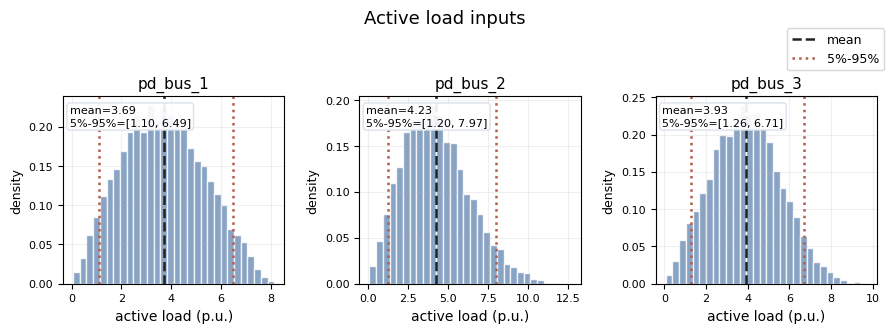

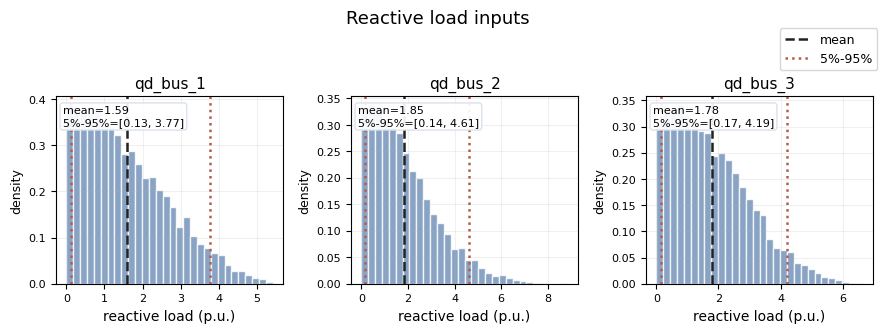

In [18]:
# display(summarize_variables(load_p + load_q))
plot_hist_variables(load_p, title='Active load inputs')
plot_hist_variables(load_q, title='Reactive load inputs')


The load values are positive because they represent demand. The summary table gives the numerical scale seen by the neural network, while the 5%-95% bands show the typical training range.


Next inspect the generator-output labels. These are solver decisions, not independent measurements: they reflect cost curves, generator limits, network constraints, and the load scenario.


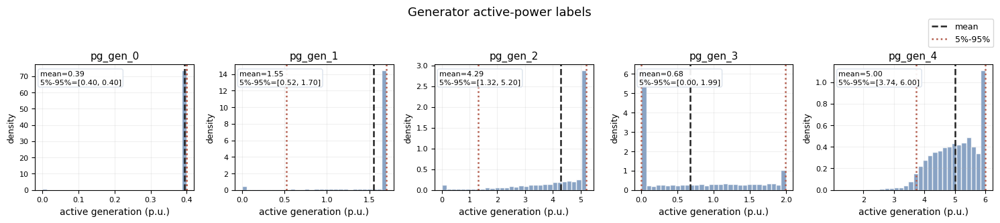

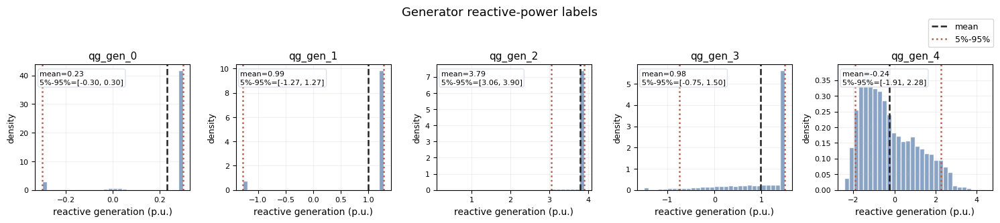

In [19]:
# display(summarize_variables(gen_p + gen_q))
plot_hist_variables(gen_p, title='Generator active-power labels')
plot_hist_variables(gen_q, title='Generator reactive-power labels')


Finally inspect the voltage labels. Voltage magnitudes usually vary over a narrow range, while voltage angles encode network-wide power-flow relationships. The angle labels below are radian-valued variables after the OPFLearn voltage-phase correction introduced above.


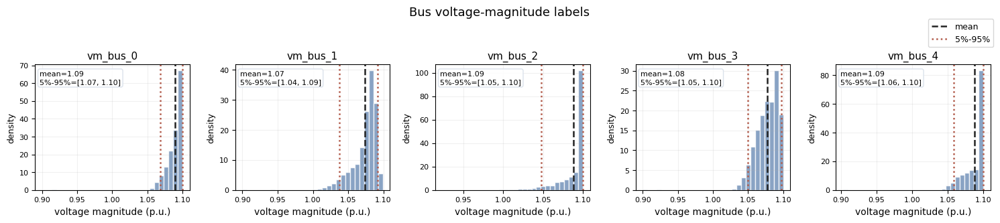

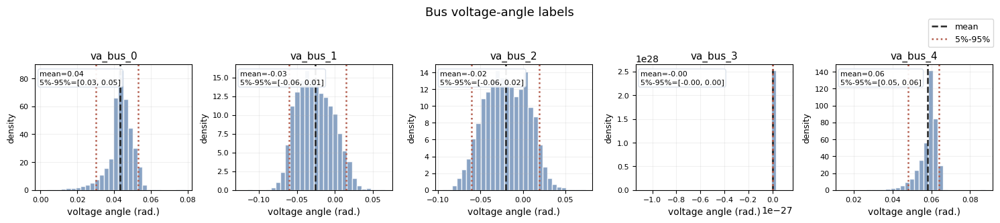

In [20]:
# display(summarize_variables(bus_vm + bus_va))
plot_hist_variables(bus_vm, title='Bus voltage-magnitude labels')
plot_hist_variables(bus_va, title='Bus voltage-angle labels')


These diagnostics foreshadow why OPF surrogate learning should not be judged by average MSE alone. The selected variables have different scales and different physical roles: loads define the operating condition, generator outputs may sit near active/reactive limits, and voltage angles affect network power-flow consistency.

A model can have a small average label error while still making feasibility-relevant mistakes in reactive power, voltage angles, or constrained generator outputs. For the rest of the tutorial, keep these distributions in mind when reading the evaluation tables: MSE measures label imitation, but OPF-aware metrics check whether the predicted variables remain physically meaningful together.


We have now defined the supervised-learning pair:

* `inputs`: active and reactive load demand features.
* `outputs`: solver-generated dispatch and voltage solution labels.

Next, we document the dataset and train a baseline MLP surrogate.



### Dataset Card

Dataset cards and model cards are documentation artifacts. They use a consistent field structure so readers can quickly distinguish **what data were used**, **what model was trained**, **what evidence is reported**, and **what is out of scope**. We keep them as markdown instead of Python-generated output because the card itself is part of the tutorial narrative; dynamic metrics are reported in the evaluation tables.

#### Dataset Card: OPFLearn Case 5 AC-OPF Dataset

| Field | Content |
|---|---|
| Card purpose | Document the prepared dataset used for the tutorial's supervised AC-OPF learning task. |
| Object documented | OPFLearn / OPFLearnData Case 5 PJM AC-OPF samples. |
| Intended use | Educational supervised-learning example for approximating AC-OPF solutions on a fixed 5-bus case. |
| Power-system / dataset scope | PGLib-style 5-bus PJM test case with fixed topology. |
| Inputs used here | Active and reactive load values for the three load buses. |
| Outputs / labels or predictions | Solver-generated generator active/reactive power, bus voltage magnitude, and bus voltage angle. |
| Units / scaling | Active/reactive powers are in per-unit on `baseMVA = 100`; voltage magnitudes are per-unit; voltage angles are radians; generator costs convert per-unit `Pg` back to MW internally. |
| Generation / training signal | Labels are AC-OPF solutions generated in the OPFLearn workflow; the dataset loader applies the OPFLearn Case 5 angle correction, then the schema conversion selects input/output columns and parses corrected complex bus voltages. |
| Reported evidence | Random 80/20 train/test split using the notebook seed; evidence is reported through MSE and OPF-aware evaluation tables. |
| Known limitations | Small fixed-topology benchmark; limited scenario diversity; no outage labels, renewable forecasts, storage state, reserve requirements, or contingency information. |
| Out-of-scope use | Do not use this dataset or the trained tutorial model for real grid operation, market dispatch, or safety-critical decisions. |
| Required verification | Verify data provenance, units, solver status, feasibility status, topology coverage, scenario design, and whether the dataset matches the intended OPF formulation. |

💬 **Reflection prompt:** If this dataset were used beyond a tutorial, what additional information would be needed? Examples include topology changes, generator outages, renewable forecasts, storage state, reserve requirements, and contingency labels.

With the dataset scope documented, we can now build the first surrogate model. We start deliberately simple so the supervised-learning pipeline is clear before adding OPF-specific evaluation and structure.


<a name="training"></a>
### Baseline MLP Architecture

We start with a simple multilayer perceptron (MLP) because it is the clearest baseline for supervised learning. It answers the first modeling question: can a simple neural network learn the input-output mapping from load demand to solver solution labels?

The MLP treats each scenario as a **flat vector**:

* **Input representation:** stack all load features into one vector $z=(P_D,Q_D)$.
* **Propagation mechanism:** each dense layer applies $h^{(k+1)}=\sigma(W_k h^{(k)}+b_k)$, so every hidden unit can mix information from every previous hidden unit.
* **Output head:** a final dense layer returns one flat OPF solution vector.
* **Predicted variables:** generator dispatch and bus voltage magnitude/angle, written here as $x=(P_G,Q_G,V_m,\theta)$.

This baseline is intentionally simple. It establishes a runnable reference point for the rest of the tutorial. Its limitation is also clear: it learns correlations from examples, but it does not explicitly encode grid topology, AC power-flow equations, line limits, or feasibility constraints.

The model implements the flat-vector surrogate shown in Figure 6. For one sample, the mapping is

$$
(P_D, Q_D) \;\longrightarrow\; (\hat P_G, \hat Q_G, \hat V_m, \hat\theta).
$$

The key visual cue is the dense connectivity between layers: once the load values are flattened, the network no longer knows which feature came from which bus or branch unless that relationship can be inferred statistically from data. At this stage, the model only learns from input-output examples using MSE. It does not know which buses are connected, how admittance matrices define AC power flow, or which constraints make a prediction feasible.


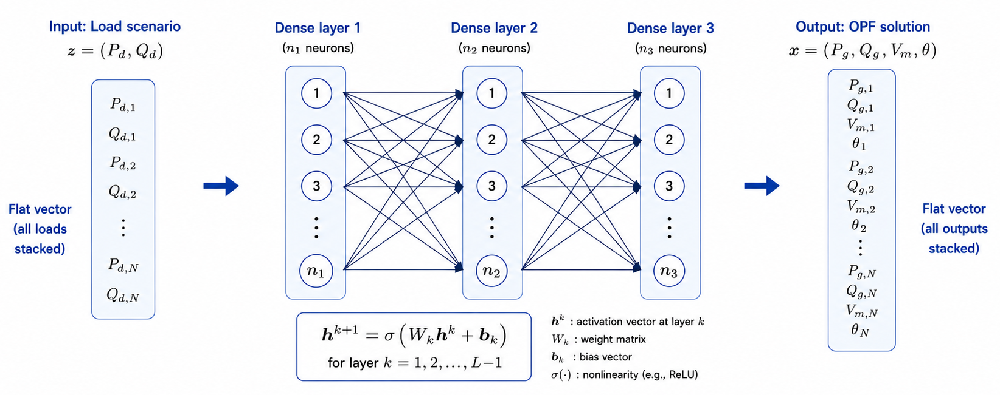



**Figure 6: MLP baseline as dense vector propagation.** The load scenario is stacked into a flat vector, passed through fully connected layers, and mapped to a flat OPF solution vector. This makes the MLP a clean baseline, but the figure also highlights its limitation: all feature interactions are learned through dense weights rather than through an explicit grid topology or physics layer. (*Image note*: AI-assisted illustration created for tutorial use)

In [21]:
torch.cuda.is_available()
# Get cpu or gpu device for training.
device = "cuda" if torch.cuda.is_available() else "mps" if torch.backends.mps.is_available() else "cpu"
print(f"Using {device} device")


Using mps device


In [22]:
# Define a simple NN model
class NeuralNetwork(nn.Module):
    def __init__(self, x_size=3, y_size=5, width=32, depth=2):
        super().__init__()
        NN = [nn.Linear(x_size, width)]
        for _ in range(depth):
          NN.append(nn.Linear(width, width))
          NN.append(nn.ReLU())
        NN.append(nn.Linear(width, y_size))
        self.NN = nn.Sequential(*NN)

    def forward(self, x):
        y = self.NN(x)
        return y

model_base = NeuralNetwork(x_size=len(inputs),
                      y_size=len(outputs),
                      width=32,
                      depth=2).to(device)
print(f'NN with input dim {len(inputs)} and output dim {len(outputs)}')


NN with input dim 6 and output dim 20


The baseline is trained with mean squared error (MSE) between the predicted solution vector and the solver-generated label. This is the right first loss because it directly tests whether the neural surrogate can imitate the OPF solver on held-out load scenarios.

MSE is only the first checkpoint. We train the baseline first, then inspect what this simple loss does and does not tell us about the learned OPF approximation.


In [23]:
loss_fn = nn.MSELoss()
optimizer = torch.optim.Adam(model_base.parameters(), lr=1e-3)


We now define the training and testing functions:




In [24]:
def train(dataloader, model, loss_fn, optimizer):
    size = len(dataloader.dataset)
    model.train()
    with torch.enable_grad():
      for batch, (X, y) in enumerate(dataloader):
          X, y = X.to(device), y.to(device)

          # Compute prediction error
          pred = model(X)
          loss = loss_fn(pred, y)
          # Backpropagation

          loss.backward()
          optimizer.step()
          optimizer.zero_grad()

          if batch % 10 == 0:
              loss, current = loss.item(), (batch) * len(X)
              print(f"loss: {loss:>7f}  [{current:>5d}/{size:>5d}]")


In [25]:
def test(dataloader, model, loss_fn):
    size = len(dataloader.dataset)
    num_batches = len(dataloader)
    model.eval()
    test_loss = 0
    with torch.no_grad():
        for X, y in dataloader:
            X, y = X.to(device), y.to(device)
            pred = model(X)
            test_loss += loss_fn(pred, y).item()
    test_loss /= num_batches
    print(f"Test Error: \n Avg loss: {test_loss:>8f} \n")


For the data, we wrap the pandas DataFrame in PyTorch `Dataset` and `DataLoader` objects, then split it into training and test sets using an 80/20 split.




In [26]:
class OPFDataset(Dataset):
    def __init__(self, data, inputs, outputs):
        self.data = data
        self.inputs = list(inputs)
        self.outputs = list(outputs)

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        row = self.data.iloc[idx]
        input = torch.tensor(row[self.inputs].to_numpy(dtype=np.float32))
        output = torch.tensor(row[self.outputs].to_numpy(dtype=np.float32))
        return input, output


In [27]:
data = df[inputs + outputs]
train_data = data.sample(frac=0.8, random_state=SEED)
test_data = data.drop(train_data.index)
print(f'training data size: {train_data.shape}, test data size: {test_data.shape}')


training data size: (8000, 26), test data size: (2000, 26)


Then we wrap the split arrays in `Dataset` and `DataLoader` objects:




In [28]:
train_dataloader = DataLoader(OPFDataset(train_data, inputs, outputs),
                              batch_size=128, shuffle=True)
test_dataloader = DataLoader(OPFDataset(test_data, inputs, outputs),
                             batch_size=128, shuffle=False)


Run the training loop for a small number of epochs. The goal is not to obtain the best possible model yet; the goal is to establish a working baseline for comparison.



Now train the neural network on the prepared dataset:




In [29]:
epochs = 10
for t in range(epochs):
    print(f"Epoch {t+1}\n-------------------------------")
    train(train_dataloader, model_base, loss_fn, optimizer)
    test(test_dataloader, model_base, loss_fn)
print("Done!")


Epoch 1
-------------------------------


loss: 3.627525  [    0/ 8000]


loss: 2.948317  [ 1280/ 8000]


loss: 1.979907  [ 2560/ 8000]


loss: 0.830599  [ 3840/ 8000]


loss: 0.416896  [ 5120/ 8000]


loss: 0.314632  [ 6400/ 8000]


loss: 0.281295  [ 7680/ 8000]


Test Error: 
 Avg loss: 0.289408 

Epoch 2
-------------------------------
loss: 0.297404  [    0/ 8000]


loss: 0.284971  [ 1280/ 8000]


loss: 0.257219  [ 2560/ 8000]


loss: 0.234207  [ 3840/ 8000]


loss: 0.262187  [ 5120/ 8000]


loss: 0.237653  [ 6400/ 8000]


loss: 0.246212  [ 7680/ 8000]


Test Error: 
 Avg loss: 0.236740 

Epoch 3
-------------------------------
loss: 0.198221  [    0/ 8000]


loss: 0.173128  [ 1280/ 8000]


loss: 0.212714  [ 2560/ 8000]


loss: 0.202459  [ 3840/ 8000]


loss: 0.222331  [ 5120/ 8000]


loss: 0.208192  [ 6400/ 8000]


loss: 0.185549  [ 7680/ 8000]


Test Error: 
 Avg loss: 0.187080 

Epoch 4
-------------------------------
loss: 0.187417  [    0/ 8000]


loss: 0.177617  [ 1280/ 8000]


loss: 0.155950  [ 2560/ 8000]


loss: 0.174492  [ 3840/ 8000]


loss: 0.180213  [ 5120/ 8000]


loss: 0.177573  [ 6400/ 8000]


loss: 0.139262  [ 7680/ 8000]


Test Error: 
 Avg loss: 0.166700 

Epoch 5
-------------------------------
loss: 0.178237  [    0/ 8000]


loss: 0.143571  [ 1280/ 8000]


loss: 0.139300  [ 2560/ 8000]


loss: 0.160605  [ 3840/ 8000]


loss: 0.146198  [ 5120/ 8000]


loss: 0.163660  [ 6400/ 8000]


loss: 0.162560  [ 7680/ 8000]


Test Error: 
 Avg loss: 0.158021 

Epoch 6
-------------------------------
loss: 0.156569  [    0/ 8000]


loss: 0.120601  [ 1280/ 8000]


loss: 0.157711  [ 2560/ 8000]


loss: 0.152505  [ 3840/ 8000]


loss: 0.143211  [ 5120/ 8000]


loss: 0.130709  [ 6400/ 8000]


loss: 0.125251  [ 7680/ 8000]


Test Error: 
 Avg loss: 0.150583 

Epoch 7
-------------------------------
loss: 0.171179  [    0/ 8000]


loss: 0.145559  [ 1280/ 8000]


loss: 0.150787  [ 2560/ 8000]


loss: 0.128555  [ 3840/ 8000]


loss: 0.139128  [ 5120/ 8000]


loss: 0.132674  [ 6400/ 8000]


loss: 0.136227  [ 7680/ 8000]


Test Error: 
 Avg loss: 0.145181 

Epoch 8
-------------------------------
loss: 0.144942  [    0/ 8000]


loss: 0.136973  [ 1280/ 8000]


loss: 0.127705  [ 2560/ 8000]


loss: 0.167475  [ 3840/ 8000]


loss: 0.128427  [ 5120/ 8000]


loss: 0.146902  [ 6400/ 8000]


loss: 0.137001  [ 7680/ 8000]


Test Error: 
 Avg loss: 0.140393 

Epoch 9
-------------------------------
loss: 0.160347  [    0/ 8000]


loss: 0.129486  [ 1280/ 8000]


loss: 0.140339  [ 2560/ 8000]


loss: 0.144746  [ 3840/ 8000]


loss: 0.129900  [ 5120/ 8000]


loss: 0.136871  [ 6400/ 8000]


loss: 0.146399  [ 7680/ 8000]


Test Error: 
 Avg loss: 0.134009 

Epoch 10
-------------------------------
loss: 0.112273  [    0/ 8000]


loss: 0.125956  [ 1280/ 8000]


loss: 0.125974  [ 2560/ 8000]


loss: 0.147702  [ 3840/ 8000]


loss: 0.110522  [ 5120/ 8000]


loss: 0.124531  [ 6400/ 8000]


loss: 0.129827  [ 7680/ 8000]


Test Error: 
 Avg loss: 0.125796 

Done!


<a name="part-4-evaluation-improvement"></a>
## **Part 4. Evaluation and Improvement**

The baseline MLP has finished training. This part changes the question from **can it fit labels?** to **is the predicted OPF solution useful, feasible, and worth the training cost?** We first evaluate the baseline, then use the same metrics to compare targeted improvements.


<a name="results-and-discussion"></a>
### Results and OPF-Aware Evaluation

The baseline MLP is now trained. The first question is straightforward: how well does it imitate the solver labels on held-out load scenarios?

We first inspect one test scenario only to make the input-output structure concrete and to show the basic inference call. The actual evaluation table then uses the full test set, because model quality should be judged by aggregate held-out performance rather than one scenario.


> 🧭 **Section guide: Results and OPF-Aware Evaluation**
>
> **Goal:** Understand what MSE tells us about the baseline MLP, then add OPF-aware checks that reflect the optimization problem.
>
> **Procedure:** Inspect one test scenario for intuition, compute its MSE and inference time, then evaluate cost gap plus physical constraint violations on the full test set.
>
> **Output:** A baseline test-set evaluation table that reports both label imitation and OPF-relevant quantities.
>
> **Important:** Fast inference and low MSE are useful, but they do not by themselves certify AC-OPF feasibility.


#### Why MSE Is Not Enough

The MLP was trained with mean squared error (MSE), so MSE is the first metric to check. It answers a narrow but important question: does the predicted output vector look close to the solver-label vector?

For AC-OPF, that is not the whole story. The output vector is supposed to describe a constrained operating point. Three additional questions matter:

1. **Feasibility:** Does the predicted solution satisfy power balance, voltage limits, generator limits, branch-flow limits, and angle-difference limits?
2. **Decision quality:** Is the predicted dispatch economically close to the solver solution?
3. **Runtime:** Is inference fast enough for the intended repeated-scenario use case?

The next few cells first inspect one test example with MSE and runtime. After that, the OPF-aware table evaluates physical violations and cost gap on the full test set.


**Inspect One Test Scenario**

We start with one test example to make the input-output structure concrete.



In [30]:
batch_snapshot = next(iter(test_dataloader))
snapshot_x, snapshot_y = batch_snapshot[0][[0]], batch_snapshot[1][[0]]


In [31]:
snapshot_x


tensor([[6.5708, 2.2760, 4.0519, 4.3763, 0.6281, 4.0264]])

The corresponding label is the solver-generated AC-OPF solution: generator dispatch and bus voltage variables for the same load scenario.



In [32]:
snapshot_y


tensor([[ 4.0000e-01,  1.7000e+00,  4.8764e+00,  1.5586e+00,  4.4468e+00,
          3.0000e-01,  1.2750e+00,  3.5338e+00,  1.5000e+00,  3.1657e+00,
          1.0887e+00,  1.0273e+00,  1.0583e+00,  1.0556e+00,  1.1000e+00,
          3.1466e-02, -4.7701e-02, -1.8030e-02, -1.0448e-31,  4.4278e-02]])

We now do two quick checks on one held-out load scenario before moving to full test-set evaluation:

1. **Speed check:** how cheap is one neural-network forward pass?
2. **Label-imitation check:** how close is the prediction to the solver label under MSE?

These checks are useful for intuition, but they are not enough to judge whether a prediction is a feasible OPF operating point.


In [33]:
import time
st = time.time()
with torch.no_grad():
    snapshot_pred = model_base(snapshot_x.to(device))
et = time.time()
inference_runtime_s = et - st
print(f'Baseline MLP inference time for one scenario: {inference_runtime_s:.6f} seconds')


Baseline MLP inference time for one scenario: 0.312015 seconds


In [34]:
loss_fn(snapshot_pred, snapshot_y.to(device)).item()


0.2176688015460968

**Speed check.** The neural-network forward pass is cheap compared with solving a fresh nonlinear AC-OPF instance. This is the main computational appeal of ML surrogates for repeated-scenario studies, screening, warm starts, or scenario exploration.

This number is only a lightweight timing check in the current runtime. Final operating decisions still require OPF-aware checks and solver/operator validation.


**Label-imitation check.** Speed alone is not useful unless the prediction is also close to the solver solution. MSE compares the predicted solution vector with the solver-label vector: lower MSE means the prediction is numerically closer to the label.

However, MSE is still only a regression metric. It does not directly check power balance, voltage/reference conventions, generator limits, or branch limits. The next section therefore evaluates the prediction as an OPF operating point.


#### OPF-Aware Metrics and Evaluation

The one-scenario check above is useful for intuition, but model evaluation should use held-out scenarios in aggregate. We now evaluate the baseline prediction as an OPF operating point on the full test set.

A prediction can be close to the solver label numerically while still violating power balance, the reference-angle convention, generator limits, voltage limits, branch-flow limits, or branch angle-difference limits. OPF-aware evaluation therefore checks both **equality residuals** and **inequality violations**.

This subsection does three things: define the metrics, implement them once, and then reuse them for both solver-label checks and model-prediction evaluation.

Notation used below:

* $D$ is the set of evaluated scenarios, such as the test-set load cases.
* $N$ is the set of buses/nodes in the power network.
* $K$ is a chosen family of inequality-constraint items, such as all bounded variables, all branch-flow limits, or all branch angle-difference limits.

For the AC power-balance equalities, $P_i(V_m,\theta)$ and $Q_i(V_m,\theta)$ are the same nonlinear bus-injection functions defined earlier: they are computed from voltage magnitudes, voltage angles, and the bus admittance matrix, and they are not new neural-network outputs.

One active-power residual at bus $i$ is

$$
r^P_i(x) = P_{G,i} - P_{D,i} - P_i(V_m,\theta),
$$

and one reactive-power residual is

$$
r^Q_i(x) = Q_{G,i} - Q_{D,i} - Q_i(V_m,\theta).
$$

A feasible AC power-flow solution has $r^P_i(x)=0$ and $r^Q_i(x)=0$ at every bus. We summarize the average power-flow mismatch as

$$
M_{\mathrm{PF}}
= \frac{1}{2|D||N|}\sum_{d \in D}\sum_{i \in N}
\left(|r^P_{d,i}| + |r^Q_{d,i}|\right).
$$

This averages all active and reactive residual items directly. In the result tables, this quantity is reported as `power_mismatch_mean`; lower is better.

Because voltage angles are relative, AC-OPF also fixes one reference angle. We report `ref_angle_vio_mean` as the mean absolute reference-angle residual $|\theta_{\mathrm{ref}}|$.

For inequality constraints, we use the same positive-part violation idea. For one constraint of the form

$$
g(x) \le 0,
$$

its violation is

$$
[g(x)]_+ = \max(g(x), 0).
$$

A feasible point has zero inequality violation. For any family of inequality constraint items $K$, we summarize the average positive-part violation across both scenarios and constraint items as

$$
V_K
= \frac{1}{|D||K|}\sum_{d \in D}\sum_{k \in K}
[g_k(x_d)]_+.
$$

In this notebook, `bound_vio_mean`, `branch_flow_vio_mean`, and `branch_angle_vio_mean` are all instances of $V_K$ with different choices of $K$: bounded variables, branch-flow limits, and branch angle-difference limits. For branch flow, each branch item uses the larger apparent flow from the from-end and to-end of the branch. Lower values are better for every violation column. These means are unnormalized diagnostic quantities, so compare them within the same metric column rather than treating all violation columns as physically interchangeable units.

| Metric | What it checks | Interpretation |
|---|---|---|
| `mse` | Label-imitation error | Does the model numerically match the solver output? |
| `cost_gap_pct` | Predicted dispatch cost vs. solver-label cost | Is the predicted dispatch economically close to the OPF solution? |
| `power_mismatch_mean` | Mean active/reactive AC power-balance residual item | Are generation, demand, voltage, and network flows mutually consistent? |
| `ref_angle_vio_mean` | Mean absolute reference-angle residual | Is the voltage-angle reference convention satisfied? |
| `bound_vio_mean` | Mean generator/voltage bound violation per bounded variable | Are predicted variables inside known operating limits? |
| `branch_flow_vio_mean` | Mean branch flow-limit violation per branch using max(from-end, to-end) flow | Would the predicted operating point overload lines? |
| `branch_angle_vio_mean` | Mean branch angle-difference violation per branch | Would any predicted branch angle differences exceed allowed limits? |

These are not the only possible OPF-aware metrics. We use them because they are compact and easy to compute in a tutorial. Other studies may report, for example:

* **apparent-power mismatch:** average $|r^P_i + \mathrm{j}r^Q_i|$ instead of averaging active and reactive residuals separately;
* **relative inequality violation:** violation normalized by the corresponding limit or variable range;
* **maximum or tail violations:** worst-case, 95th-percentile, or CVaR-style violation instead of only the mean;
* **feasibility rate:** fraction of scenarios whose residuals and violations are below a chosen tolerance;
* **post-repair metrics:** cost gap and violations after projection, power-flow repair, or OPF solver warm start.

The important point is to state the metric definition clearly and use the same definition consistently across models.

The next cell is implementation infrastructure. Run it, but on a first pass focus on the metric definitions and output table rather than reading every helper line.


In [35]:
# Helper: OPF-aware metric implementation
from pypower import idx_bus, idx_gen, idx_brch
from pypower.api import makeYbus, ext2int
import time


class OPFAwareMetric:
    """Reusable OPF-aware metric object for evaluation and constraint-aware training."""
    def __init__(self, context, device=device):
        self.device = torch.device(device)
        self.context = context
        self.case_int = ext2int(copy.deepcopy(context['net']))
        self.base_mva = self.case_int['baseMVA']
        self.nbus = context['nbus']
        self.ngen = context['ngen']
        self.ref_bus = int(context['ref_bus'])
        self.output_slices = context['output_slices']
        self.gen_bus_index = self.case_int['gen'][:, idx_gen.GEN_BUS].astype(int)
        self.load_bus_index = list(map(int, context['load_bus']))
        self.gen_to_bus = self.build_mapping_matrix(self.gen_bus_index, self.ngen)
        self.load_to_bus = self.build_mapping_matrix(self.load_bus_index, len(self.load_bus_index))
        self.fbus = self.case_int['branch'][:, idx_brch.F_BUS].astype(int)
        self.tbus = self.case_int['branch'][:, idx_brch.T_BUS].astype(int)

        ybus, yf, yt = makeYbus(
            self.case_int['baseMVA'],
            self.case_int['bus'],
            self.case_int['branch'],
        )
        self.Ybus_real = self.to_tensor(np.asarray(ybus.todense().real))
        self.Ybus_imag = self.to_tensor(np.asarray(ybus.todense().imag))
        self.Yf_real = self.to_tensor(np.asarray(yf.todense().real))
        self.Yf_imag = self.to_tensor(np.asarray(yf.todense().imag))
        self.Yt_real = self.to_tensor(np.asarray(yt.todense().real))
        self.Yt_imag = self.to_tensor(np.asarray(yt.todense().imag))

        self.cost_c2, self.cost_c1, self.cost_c0 = self.build_cost_coefficients(self.case_int['gencost'])
        raw_smax = self.case_int['branch'][:, idx_brch.RATE_A] / self.base_mva
        self.smax = self.to_tensor(np.where(raw_smax > 0, raw_smax, np.inf))
        self.angmin = self.to_tensor(np.deg2rad(self.case_int['branch'][:, idx_brch.ANGMIN]))
        self.angmax = self.to_tensor(np.deg2rad(self.case_int['branch'][:, idx_brch.ANGMAX]))

        pg_min = self.case_int['gen'][:, idx_gen.PMIN] / self.base_mva
        pg_max = self.case_int['gen'][:, idx_gen.PMAX] / self.base_mva
        qg_min = self.case_int['gen'][:, idx_gen.QMIN] / self.base_mva
        qg_max = self.case_int['gen'][:, idx_gen.QMAX] / self.base_mva
        vm_min = self.case_int['bus'][:, idx_bus.VMIN]
        vm_max = self.case_int['bus'][:, idx_bus.VMAX]
        va_min = -np.pi * np.ones(self.nbus)
        va_max = np.pi * np.ones(self.nbus)
        self.outputs_min = self.to_tensor(np.concatenate([pg_min, qg_min, vm_min, va_min])).view(1, -1)
        self.outputs_max = self.to_tensor(np.concatenate([pg_max, qg_max, vm_max, va_max])).view(1, -1)

    def to_tensor(self, array):
        return torch.as_tensor(array, dtype=torch.float32, device=self.device)

    def build_cost_coefficients(self, gencost):
        # PGLib-OPF cases used here store quadratic generator costs as c2, c1, c0.
        coeffs = gencost[:, 4:7]
        return self.to_tensor(coeffs[:, 0]), self.to_tensor(coeffs[:, 1]), self.to_tensor(coeffs[:, 2])

    def build_mapping_matrix(self, bus_indices, n_items):
        mapping = np.zeros((n_items, self.nbus), dtype=np.float32)
        for item_idx, bus_idx in enumerate(bus_indices):
            mapping[item_idx, int(bus_idx)] = 1.0
        return self.to_tensor(mapping)

    def split_outputs(self, outputs):
        outputs = outputs.to(self.device)
        slices = self.output_slices
        pg = outputs[:, slices['pg']]
        qg = outputs[:, slices['qg']]
        vm = outputs[:, slices['vm']]
        va = outputs[:, slices['va']]
        return pg, qg, vm, va

    def voltage_rectangular(self, outputs):
        _, _, vm, va = self.split_outputs(outputs)
        return vm * torch.cos(va), vm * torch.sin(va), va

    def complex_power(self, vr, vi, ir, ii):
        p = vr * ir + vi * ii
        q = vi * ir - vr * ii
        return p, q

    def branch_end_power(self, vr, vi, y_real, y_imag, bus_index):
        ir = vr @ y_real.T - vi @ y_imag.T
        ii = vi @ y_real.T + vr @ y_imag.T
        return self.complex_power(vr[:, bus_index], vi[:, bus_index], ir, ii)

    def cal_gen_cost(self, outputs):
        pg, _, _, _ = self.split_outputs(outputs)
        pg_mw = pg * self.base_mva
        return (self.cost_c2 * pg_mw.square() + self.cost_c1 * pg_mw + self.cost_c0).sum(1)

    def cal_upper_lower_bound_violation(self, outputs):
        outputs = outputs.to(self.device)
        return torch.relu(outputs - self.outputs_max) + torch.relu(self.outputs_min - outputs)

    def gen_load_to_bus(self, inputs, outputs):
        inputs = inputs.to(self.device)
        nload = len(self.load_bus_index)
        pd = inputs[:, :nload]
        qd = inputs[:, nload:2 * nload]
        pg, qg, _, _ = self.split_outputs(outputs)
        return pg @ self.gen_to_bus, qg @ self.gen_to_bus, pd @ self.load_to_bus, qd @ self.load_to_bus

    def cal_power_balance_residual(self, inputs, outputs):
        """Signed active/reactive power-balance residuals at each bus."""
        inputs = inputs.to(self.device)
        outputs = outputs.to(self.device)
        bus_pg, bus_qg, bus_pd, bus_qd = self.gen_load_to_bus(inputs, outputs)
        bus_p_inj = bus_pg - bus_pd
        bus_q_inj = bus_qg - bus_qd

        vr, vi, _ = self.voltage_rectangular(outputs)
        ir = vr @ self.Ybus_real - vi @ self.Ybus_imag
        ii = vi @ self.Ybus_real + vr @ self.Ybus_imag
        bus_p, bus_q = self.complex_power(vr, vi, ir, ii)
        return bus_p_inj - bus_p, bus_q_inj - bus_q

    def cal_power_balance_violation(self, inputs, outputs):
        p_residual, q_residual = self.cal_power_balance_residual(inputs, outputs)
        return torch.abs(p_residual), torch.abs(q_residual)

    def cal_reference_angle_residual(self, outputs):
        _, _, _, va = self.split_outputs(outputs)
        return va[:, self.ref_bus:self.ref_bus + 1]

    def cal_reference_angle_violation(self, outputs):
        return torch.abs(self.cal_reference_angle_residual(outputs))

    def cal_branch_flow_vio(self, outputs):
        outputs = outputs.to(self.device)
        vr, vi, va = self.voltage_rectangular(outputs)

        pf, qf = self.branch_end_power(vr, vi, self.Yf_real, self.Yf_imag, self.fbus)
        pt, qt = self.branch_end_power(vr, vi, self.Yt_real, self.Yt_imag, self.tbus)
        sf = torch.sqrt(torch.square(pf) + torch.square(qf))
        st = torch.sqrt(torch.square(pt) + torch.square(qt))

        branch_flow = torch.maximum(sf, st)
        branch_angle = va[:, self.fbus] - va[:, self.tbus]
        angle_upper_vio = torch.relu(branch_angle - self.angmax)
        angle_lower_vio = torch.relu(self.angmin - branch_angle)
        return torch.relu(branch_flow - self.smax), angle_upper_vio + angle_lower_vio





In [36]:
def evaluate_opf_predictions(opf_metric, inputs, target, pred, model_name, runtime_s=None):
    inputs = inputs.to(opf_metric.device)
    target = target.to(opf_metric.device)
    pred = pred.to(opf_metric.device)

    pred_cost = opf_metric.cal_gen_cost(pred)
    opt_cost = opf_metric.cal_gen_cost(target)
    p_mis, q_mis = opf_metric.cal_power_balance_violation(inputs, pred)
    flow_vio, angle_vio = opf_metric.cal_branch_flow_vio(pred)

    row = {
        'model': model_name,
        'samples': int(inputs.shape[0]),
        'mse': float(torch.mean(torch.square(pred - target)).detach().cpu()),
        'cost_gap_pct': float((100 * torch.mean((pred_cost - opt_cost) / opt_cost)).detach().cpu()),
        'power_mismatch_mean': float(torch.cat([p_mis, q_mis], dim=1).mean().detach().cpu()),
        'ref_angle_vio_mean': float(opf_metric.cal_reference_angle_violation(pred).mean().detach().cpu()),
        'bound_vio_mean': float(opf_metric.cal_upper_lower_bound_violation(pred).mean().detach().cpu()),
        'branch_flow_vio_mean': float(flow_vio.mean().detach().cpu()),
        'branch_angle_vio_mean': float(angle_vio.mean().detach().cpu()),
    }
    if runtime_s is not None:
        row['runtime_s'] = runtime_s
    return pd.DataFrame([row])


def evaluate_model_on_dataloader(opf_metric, model, dataloader, model_name):
    model.eval()
    all_x, all_y, all_pred = [], [], []
    start = time.time()
    with torch.no_grad():
        for X, Y in dataloader:
            X = X.to(opf_metric.device)
            Y = Y.to(opf_metric.device)
            all_x.append(X)
            all_y.append(Y)
            all_pred.append(model(X))
    runtime_s = time.time() - start
    return evaluate_opf_predictions(
        opf_metric, torch.cat(all_x), torch.cat(all_y), torch.cat(all_pred), model_name, runtime_s
    )




**Dataset and metric sanity check.** Before evaluating ML predictions, we first pass the solver labels through the same OPF-aware metric code. Because we already corrected the OPFLearn Case 5 voltage-angle convention during loading, this check now mainly verifies that our metric implementation, units, bus/generator ordering, and reference-angle convention are consistent. The same idea is also useful for detecting raw-data problems in a new dataset before training any model.

We pass `label_y` as both the target and the prediction. Therefore MSE and cost gap should be zero by construction; the useful checks here are the physical residual columns such as `power_mismatch_mean` and `ref_angle_vio_mean`.


In [37]:
opf_metric = OPFAwareMetric(context, device=device)

label_batches = [(X.to(device), Y.to(device)) for X, Y in test_dataloader]
label_x = torch.cat([X for X, _ in label_batches])
label_y = torch.cat([Y for _, Y in label_batches])

label_metrics = evaluate_opf_predictions(
    opf_metric, label_x, label_y, label_y, 'Solver labels'
)
label_metrics[['model', 'power_mismatch_mean', 'ref_angle_vio_mean']]


,model,power_mismatch_mean,ref_angle_vio_mean
0,Solver labels,0.000005,8.086183e-32


In [38]:
# Helper functions for compact evaluation tables.
def count_trainable_parameters(model):
    return sum(param.numel() for param in model.parameters() if param.requires_grad)


def summarize_opf_metrics(metrics_table, include_inference_runtime=False, include_training=False, model_size_lookup=None):
    summary = metrics_table.copy()

    cols = ['model']
    if model_size_lookup is not None:
        summary['model_size_params'] = summary['model'].map(
            lambda name: count_trainable_parameters(model_size_lookup[name])
            if name in model_size_lookup else np.nan
        )
        cols.append('model_size_params')
    cols += [
        'samples', 'mse', 'cost_gap_pct',
        'power_mismatch_mean', 'ref_angle_vio_mean', 'bound_vio_mean',
        'branch_flow_vio_mean', 'branch_angle_vio_mean',
    ]
    if include_inference_runtime and 'runtime_s' in summary.columns:
        cols.append('runtime_s')
    if include_training:
        for col in ['train_runtime_s', 'energy_kwh', 'emissions_kg_co2eq']:
            if col in summary.columns:
                cols.append(col)

    rounded = summary[cols].copy()
    round_spec = {
        'model_size_params': 0,
        'mse': 5,
        'cost_gap_pct': 3,
        'power_mismatch_mean': 3,
        'ref_angle_vio_mean': 3,
        'bound_vio_mean': 3,
        'branch_flow_vio_mean': 3,
        'branch_angle_vio_mean': 3,
        'runtime_s': 3,
        'train_runtime_s': 2,
        'energy_kwh': 6,
        'emissions_kg_co2eq': 6,
    }
    return rounded.round({key: value for key, value in round_spec.items() if key in rounded.columns})


**OPF-Aware Evaluation Table**

The helper cell above defines the metric object and table summarizer. The table below reports the baseline MLP on the full test set. This is the row we should use when comparing models, because it averages over held-out load scenarios instead of depending on one selected case.


In [39]:
test_metrics = evaluate_model_on_dataloader(
    opf_metric, model_base,
    test_dataloader,
    'Baseline MLP (test set)',
)

summarize_opf_metrics(
    test_metrics,
    model_size_lookup={'Baseline MLP (test set)': model_base},
)


,model,model_size_params,samples,mse,cost_gap_pct,power_mismatch_mean,ref_angle_vio_mean,bound_vio_mean,branch_flow_vio_mean,branch_angle_vio_mean
0,Baseline MLP (test set),2996,2000,0.12538,4.984,4.266,0.009,0.026,0.98,0.0


Read the table as a feasibility-aware summary, not only as a prediction-error report.

* `model_size_params` reports the number of trainable parameters in the neural model.
* Low `mse` means the model imitates solver labels well.
* `cost_gap_pct` is computed from the predicted active generation before any repair or solver verification. It is useful for comparing raw economic signals, but it is meaningful only together with feasibility metrics.
* Low `power_mismatch_mean`, `ref_angle_vio_mean`, `bound_vio_mean`, `branch_flow_vio_mean`, and `branch_angle_vio_mean` mean the prediction is closer to a physically meaningful OPF solution.
* The runtime column is omitted here because later model-comparison tables focus on training time and emissions. If inference speed matters, it should be benchmarked with a fixed batch size and hardware setup.

For OPF, a model is not good just because it has low MSE or low raw cost. A useful prediction should also have small physical violations and fast enough inference for the intended application.

This answers one side of the evaluation question: **is the predicted operating point useful?** The other side is about the learning process itself: **how much compute, energy, and carbon footprint did we spend to obtain the model?** That second question matters when we compare larger architectures, longer training schedules, or repeated experiments.

#### Carbon and Compute Footprint
The previous table treated the trained model as a dispatch predictor and asked whether its outputs were accurate, feasible, and economically reasonable. We now add a process-level metric: the footprint of training that predictor.

In this subsection, **carbon footprint** means the compute footprint of ML training. It is different from the physical emissions of the power-grid dispatch. Carbon-aware OPF, discussed later, changes the OPF objective or constraints using generator emissions. Here, we only instrument the notebook so model comparisons can include approximate training energy and emissions alongside accuracy and feasibility.

We use [CodeCarbon](https://docs.codecarbon.io/) for this instrumentation. CodeCarbon estimates:

* `energy_kwh`: electricity consumed by the tracked training run;
* `emissions_kg_co2eq`: estimated carbon-equivalent emissions from that energy use.

The estimates are approximate. Short notebook runs can be noisy, and results depend on hardware, runtime, measurement support, and carbon-intensity assumptions. They are still useful pedagogically because they place model quality, runtime, and compute footprint in the same comparison table. For serious reporting, repeat longer runs under fixed hardware and software conditions.

CodeCarbon was installed during Software Preparation. The next cell defines lightweight helper functions for model-comparison runs.

In [40]:
# Energy/emissions tracking with CodeCarbon.
from codecarbon import EmissionsTracker


def start_emissions_tracker(model_name):
    tracker = EmissionsTracker(
        project_name=f'opf_{model_name}',
        save_to_file=False,
        log_level='error',
    )
    tracker.start()
    return tracker


def stop_emissions_tracker(tracker):
    tracker.stop()
    final_data = tracker.final_emissions_data
    return {
        'energy_kwh': float(final_data.energy_consumed),
        'emissions_kg_co2eq': float(final_data.emissions),
    }


print('CodeCarbon tracking is enabled for training loops; results are reported in memory, not saved as files.')


CodeCarbon tracking is enabled for training loops; results are reported in memory, not saved as files.


At this point we have a complete comparison protocol for the baseline: supervised error, dispatch cost, equality residuals, inequality violations, inference time, model size, and training footprint.

The instrumentation does not make the model better by itself. It gives us a fair checklist for asking whether a proposed improvement is actually useful. The next section keeps this checklist fixed and changes the model design and training signal.


<a name="model-improvement"></a>
### Model Improvement
With the evaluation protocol fixed, we can now ask a more useful modeling question: which changes improve the baseline under OPF-aware metrics, not only under MSE?

We compare three directions:

* **Architecture tuning:** wider, deeper, and residual MLP variants.
* **Physical constraints:** bounded outputs and penalty terms for OPF violations.
* **Physics-guided training signals:** losses that use OPF objectives and constraints in addition to labels.

Keep the baseline row as the reference while running this section. A useful variant should improve the tradeoff among MSE, cost gap, physical violations, runtime, model size, and training footprint.


This block rebuilds the case context, canonical dataset, and data loaders used by the model-improvement exercises. It assumes the notebook has been run from the beginning, because it reuses shared helper definitions introduced earlier (`case5_pjm`, `build_opf_context`, `standardize_opflearn_case5_csv`, `OPFDataset`, and `OPFAwareMetric`). The important point is that the exercises reuse the same schema and `OPFAwareMetric` object, so evaluation and constraint-aware training remain consistent.


In [41]:
# Data visualization
import matplotlib.pyplot as plt
# Data manipulation
import pandas as pd
import numpy as np
import os
# Deep learning framework
import torch
from torch import nn
from torch.utils.data import DataLoader, Dataset
from pypower import idx_bus, idx_gen, idx_brch, idx_cost
from pypower.api import makeYbus, ext2int

# For reproducibility
SEED = 2026
torch.manual_seed(SEED)
# Get cpu or gpu device for training.
device = "cuda" if torch.cuda.is_available() else "mps" if torch.backends.mps.is_available() else "cpu"
print(f"Using {device} device")


Using mps device


In [42]:
# Reuse the inline PYPOWER-compatible PJM 5-bus case defined earlier.
net = case5_pjm()
context = build_opf_context(net, case_name='PGLib/PJM Case 5')
print('Loaded inline PJM 5-bus PYPOWER case')
print('bus/gen/branch shapes:', net['bus'].shape, net['gen'].shape, net['branch'].shape)
print('canonical input/output sizes:', len(context['inputs']), len(context['outputs']))


Loaded inline PJM 5-bus PYPOWER case
bus/gen/branch shapes: (5, 13) (5, 10) (6, 13)
canonical input/output sizes: 6 20


In [43]:
# Rebuild the canonical training dataset from the same raw OPFLearn file.
download_case5_dataset()
raw_df = load_clean_opflearn_case5_csv(DATA_PATH)
df = standardize_opflearn_case5_csv(raw_df, context)

load_p = context['load_p']
load_q = context['load_q']
gen_p = context['gen_p']
gen_q = context['gen_q']
bus_vm = context['bus_vm']
bus_va = context['bus_va']
inputs = context['inputs']
outputs = context['outputs']

data = df[inputs + outputs]
train_data = data.sample(frac=0.8, random_state=SEED)
test_data = data.drop(train_data.index)
train_dataloader = DataLoader(OPFDataset(train_data, inputs, outputs),
                              batch_size=128, shuffle=True)
test_dataloader = DataLoader(OPFDataset(test_data, inputs, outputs),
                             batch_size=128, shuffle=False)
print(f'training data size: {train_data.shape}, test data size: {test_data.shape}')


Using OPFLearn dataset: pglib_opf_case5_pjm.csv


training data size: (8000, 26), test data size: (2000, 26)


In [44]:
# Reuse the same OPF-aware metric class introduced in the Results section.
# It is used both for model evaluation and for constraint-aware training losses.
opf_metric = OPFAwareMetric(context, device=device)


⚠️ **Training budget note.** Most model cells use `epochs=10` so the notebook runs quickly in Colab. This is a teaching budget, not a research recommendation. Serious experiments usually train longer, often 100-1000+ epochs with validation-based early stopping and hyperparameter tuning.


In [45]:
# Shared training loop for the model-improvement exercises.
# It prints OPF-aware validation metrics during training and returns a full test-set summary row.
def evaluate_training_snapshot(dataloader, model, opf_metric):
    batch_snapshot = next(iter(dataloader))
    X, Y = batch_snapshot[0].to(device), batch_snapshot[1].to(device)
    model.eval()
    with torch.no_grad():
      Y_pred = model(X)

    test_sol_mse = ((Y_pred - Y)**2)

    Y_pred_cost = opf_metric.cal_gen_cost(Y_pred)
    Y_opt_cost = opf_metric.cal_gen_cost(Y)
    test_obj_gap = (Y_pred_cost - Y_opt_cost)/Y_opt_cost

    vio_bound = opf_metric.cal_upper_lower_bound_violation(Y_pred)
    vio_p_mis, vio_q_mis = opf_metric.cal_power_balance_violation(X, Y_pred)
    vio_ref_angle = opf_metric.cal_reference_angle_violation(Y_pred)
    vio_flow, vio_ang = opf_metric.cal_branch_flow_vio(Y_pred)
    eq_vio = torch.cat([vio_p_mis, vio_q_mis, vio_ref_angle], dim=1)
    ineq_vio = torch.cat([vio_bound, vio_flow, vio_ang], dim=1)
    # Training prints use a compact mean over equality-style residual items.
    # ineq_vio.mean() is only a compact training monitor; final tables split
    # inequality violations into bound, branch-flow, and branch-angle means.
    return test_sol_mse, test_obj_gap, eq_vio, ineq_vio


def model_train_test(train_dataloader, test_dataloader, model,
                     loss_fn, opf_metric, epochs=10, penalty=False,
                     model_name='model'):
  torch.manual_seed(SEED)
  optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
  tracker = start_emissions_tracker(model_name)
  train_start_time = time.perf_counter()
  for t in range(epochs):
      model.train()
      train_loss = []
      with torch.enable_grad():
        for batch, (X, y) in enumerate(train_dataloader):
            X, y = X.to(device), y.to(device)
            pred = model(X)
            if penalty:
              loss = loss_fn(X, pred, y)
            else:
              loss = loss_fn(pred, y)
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()
            train_loss.append(loss.item())
      train_loss = np.mean(train_loss)

      test_sol_mse, test_obj_gap, eq_vio, ineq_vio = evaluate_training_snapshot(test_dataloader, model, opf_metric)
      print(f"Epoch {t+1} | Train loss: {train_loss:.3f} | ",
            f"Test mse: {test_sol_mse.mean():.3f}, "
            f"opt gap: {100 * test_obj_gap.mean():.3f}%, ",
            f"eq compact mean: {eq_vio.mean():.3f}, ",
            f"ineq compact mean: {ineq_vio.mean():.3f}")

  emissions_metrics = stop_emissions_tracker(tracker)
  train_runtime_s = time.perf_counter() - train_start_time

  # Evaluate the whole test set so every model variant can be compared in one table.
  metrics = evaluate_model_on_dataloader(opf_metric, model, test_dataloader, model_name)
  for key, value in emissions_metrics.items():
      metrics[key] = value
  metrics['train_runtime_s'] = train_runtime_s
  metrics['training_epochs'] = epochs
  return metrics


model_comparison_rows = {}
model_size_lookup = {}
model_metadata = {}


def register_model_result(model_name, metrics, model, **metadata):
    model_comparison_rows[model_name] = metrics
    model_size_lookup[model_name] = model
    if metadata:
        model_metadata[model_name] = metadata

The training logs use compact monitors to keep each epoch line short. `eq compact mean` averages active/reactive power-balance residual magnitudes together with the reference-angle residual. `ineq compact mean` averages bound, branch-flow, and branch-angle positive-part violations together. These compact values are unnormalized mixed-unit diagnostics for training progress; the final result tables report the clearer split metrics: `power_mismatch_mean`, `ref_angle_vio_mean`, `bound_vio_mean`, `branch_flow_vio_mean`, and `branch_angle_vio_mean`.


#### Exercise 1: Architecture Tuning

The first exercise tests whether a larger or better-connected MLP improves the baseline. We train four supervised models with the same data, loss, epoch count, and evaluator:

1. baseline MLP;
2. wider MLP;
3. deeper MLP;
4. residual MLP.

**Learning question:** does extra model capacity improve cost and feasibility, or does it only improve MSE?

Read each result row with the same checklist: MSE, cost gap, equality violation, inequality violation, runtime, and training emissions.

In [46]:
# Reuse the baseline MLP class defined earlier.
# We retrain a local baseline row so the exercise table has a fair reference.
model_base_ex = NeuralNetwork(x_size=len(inputs),
                              y_size=len(outputs),
                              width=32,
                              depth=2).to(device)
metrics_base_ex = model_train_test(train_dataloader, test_dataloader, model_base_ex,
                                   nn.MSELoss(), opf_metric,
                                   epochs=10, model_name='MLP baseline')
register_model_result(
    'MLP baseline', metrics_base_ex, model_base_ex,
    learning_step='1. Baseline',
    family='MLP',
    exercise_step='1. Baseline',
    design_change='Flat MLP reference',
    main_idea='Flat load-to-solution mapping',
    training_signal='MSE',
    architecture_note='Flat MLP mapping load features to AC-OPF solution variables.',
    main_path=True,
)
summarize_opf_metrics(metrics_base_ex, include_training=True, model_size_lookup=model_size_lookup)


[codecarbon WARNING @ 09:21:10] Multiple instances of codecarbon are allowed to run at the same time.


Epoch 1 | Train loss: 1.370 |  Test mse: 0.262, opt gap: 2.558%,  eq compact mean: 13.133,  ineq compact mean: 1.582


Epoch 2 | Train loss: 0.262 |  Test mse: 0.224, opt gap: 4.158%,  eq compact mean: 11.807,  ineq compact mean: 1.368


Epoch 3 | Train loss: 0.225 |  Test mse: 0.180, opt gap: 3.626%,  eq compact mean: 10.236,  ineq compact mean: 1.322


Epoch 4 | Train loss: 0.177 |  Test mse: 0.144, opt gap: 3.994%,  eq compact mean: 6.740,  ineq compact mean: 0.642


Epoch 5 | Train loss: 0.158 |  Test mse: 0.135, opt gap: 3.215%,  eq compact mean: 4.965,  ineq compact mean: 0.429


Epoch 6 | Train loss: 0.150 |  Test mse: 0.129, opt gap: 2.963%,  eq compact mean: 4.656,  ineq compact mean: 0.361


Epoch 7 | Train loss: 0.144 |  Test mse: 0.124, opt gap: 4.115%,  eq compact mean: 4.014,  ineq compact mean: 0.289


Epoch 8 | Train loss: 0.140 |  Test mse: 0.121, opt gap: 3.649%,  eq compact mean: 4.259,  ineq compact mean: 0.263


Epoch 9 | Train loss: 0.135 |  Test mse: 0.117, opt gap: 3.591%,  eq compact mean: 3.925,  ineq compact mean: 0.266


Epoch 10 | Train loss: 0.129 |  Test mse: 0.112, opt gap: 3.757%,  eq compact mean: 4.412,  ineq compact mean: 0.345


,model,model_size_params,samples,mse,cost_gap_pct,power_mismatch_mean,ref_angle_vio_mean,bound_vio_mean,branch_flow_vio_mean,branch_angle_vio_mean,train_runtime_s,energy_kwh,emissions_kg_co2eq
0,MLP baseline,2996,2000,0.12967,5.921,4.71,0.011,0.03,1.642,0.0,24.38,0.000074,0.00002


**Try.** Increase the MLP width while keeping the depth fixed.

**Run.** The next cell doubles the hidden width from 32 to 64 and evaluates the model with the same OPF-aware metrics.

**Interpret.** Check whether lower MSE also comes with lower cost gap and lower constraint violations.


⭐ **YOUR TURN!**


In [47]:
# Variant 1: double the hidden width while keeping the depth fixed.
model_wide = NeuralNetwork(x_size=len(inputs),
                           y_size=len(outputs),
                           width=64,
                           depth=2).to(device)
metrics_wide = model_train_test(train_dataloader, test_dataloader, model_wide,
                                nn.MSELoss(), opf_metric,
                                epochs=10, model_name='Wider MLP')
register_model_result(
    'Wider MLP', metrics_wide, model_wide,
    exercise_step='1. Width',
    design_change='Increase hidden width',
    training_signal='MSE',
)
summarize_opf_metrics(metrics_wide, include_training=True, model_size_lookup=model_size_lookup)


Epoch 1 | Train loss: 0.798 |  Test mse: 0.222, opt gap: 0.135%,  eq compact mean: 10.682,  ineq compact mean: 1.201


Epoch 2 | Train loss: 0.206 |  Test mse: 0.163, opt gap: 3.128%,  eq compact mean: 7.292,  ineq compact mean: 0.722


Epoch 3 | Train loss: 0.160 |  Test mse: 0.129, opt gap: 3.068%,  eq compact mean: 5.487,  ineq compact mean: 0.490


Epoch 4 | Train loss: 0.143 |  Test mse: 0.123, opt gap: 3.620%,  eq compact mean: 4.619,  ineq compact mean: 0.396


Epoch 5 | Train loss: 0.137 |  Test mse: 0.121, opt gap: 1.897%,  eq compact mean: 4.095,  ineq compact mean: 0.320


Epoch 6 | Train loss: 0.129 |  Test mse: 0.111, opt gap: 2.587%,  eq compact mean: 5.796,  ineq compact mean: 0.547


Epoch 7 | Train loss: 0.116 |  Test mse: 0.097, opt gap: 3.402%,  eq compact mean: 5.450,  ineq compact mean: 0.453


Epoch 8 | Train loss: 0.094 |  Test mse: 0.078, opt gap: 1.251%,  eq compact mean: 6.056,  ineq compact mean: 0.479


Epoch 9 | Train loss: 0.073 |  Test mse: 0.065, opt gap: 1.851%,  eq compact mean: 4.270,  ineq compact mean: 0.261


Epoch 10 | Train loss: 0.061 |  Test mse: 0.057, opt gap: -0.314%,  eq compact mean: 3.979,  ineq compact mean: 0.209


,model,model_size_params,samples,mse,cost_gap_pct,power_mismatch_mean,ref_angle_vio_mean,bound_vio_mean,branch_flow_vio_mean,branch_angle_vio_mean,train_runtime_s,energy_kwh,emissions_kg_co2eq
0,Wider MLP,10068,2000,0.06049,-0.718,4.603,0.025,0.022,1.165,0.0,23.29,0.000094,0.000025


**Interpret.** In this run, the wider MLP improves several metrics at once. That is useful, but it does not prove that width alone is always better; later rows should still be compared by feasibility and cost, not only MSE.


**Try.** Increase depth after testing width.

**Run.** The next cell keeps width at 64 but increases the number of hidden layers.

**Interpret.** A deeper model is not automatically better; compare its OPF-aware metrics with the wider model.


⭐ **YOUR TURN!**


In [48]:
# Variant 2: increase depth after testing width.
model_deep = NeuralNetwork(x_size=len(inputs),
                           y_size=len(outputs),
                           width=64,
                           depth=4).to(device)
metrics_deep = model_train_test(train_dataloader, test_dataloader, model_deep,
                                nn.MSELoss(), opf_metric,
                                epochs=10, model_name='Deeper MLP')
register_model_result(
    'Deeper MLP', metrics_deep, model_deep,
    exercise_step='1. Depth',
    design_change='Increase hidden depth',
    training_signal='MSE',
)
summarize_opf_metrics(metrics_deep, include_training=True, model_size_lookup=model_size_lookup)


Epoch 1 | Train loss: 0.996 |  Test mse: 0.256, opt gap: 4.224%,  eq compact mean: 5.820,  ineq compact mean: 0.475


Epoch 2 | Train loss: 0.256 |  Test mse: 0.212, opt gap: 2.431%,  eq compact mean: 8.093,  ineq compact mean: 0.777


Epoch 3 | Train loss: 0.213 |  Test mse: 0.173, opt gap: 3.527%,  eq compact mean: 4.326,  ineq compact mean: 0.324


Epoch 4 | Train loss: 0.179 |  Test mse: 0.135, opt gap: 4.259%,  eq compact mean: 8.878,  ineq compact mean: 1.093


Epoch 5 | Train loss: 0.146 |  Test mse: 0.123, opt gap: 2.489%,  eq compact mean: 5.530,  ineq compact mean: 0.416


Epoch 6 | Train loss: 0.132 |  Test mse: 0.112, opt gap: 2.379%,  eq compact mean: 5.697,  ineq compact mean: 0.472


Epoch 7 | Train loss: 0.118 |  Test mse: 0.097, opt gap: 4.990%,  eq compact mean: 6.250,  ineq compact mean: 0.547


Epoch 8 | Train loss: 0.089 |  Test mse: 0.066, opt gap: 1.245%,  eq compact mean: 5.104,  ineq compact mean: 0.450


Epoch 9 | Train loss: 0.058 |  Test mse: 0.054, opt gap: -1.614%,  eq compact mean: 3.589,  ineq compact mean: 0.225


Epoch 10 | Train loss: 0.050 |  Test mse: 0.046, opt gap: 1.222%,  eq compact mean: 3.624,  ineq compact mean: 0.220


,model,model_size_params,samples,mse,cost_gap_pct,power_mismatch_mean,ref_angle_vio_mean,bound_vio_mean,branch_flow_vio_mean,branch_angle_vio_mean,train_runtime_s,energy_kwh,emissions_kg_co2eq
0,Deeper MLP,18388,2000,0.04897,1.288,4.12,0.017,0.014,1.138,0.0,25.48,0.000078,0.000021


**Interpret.** The deeper MLP does not clearly improve this case. More layers can increase expressiveness, but they can also make optimization harder and may not reduce OPF-specific violations.


**Try.** Add residual connections to make a deeper network easier to optimize.

**Run.** The next cells define a residual MLP and train it with the same supervised loss.

**Interpret.** Residual connections can help optimization, but they still do not enforce OPF feasibility by themselves.


⭐ **YOUR TURN!**


In [49]:
# Variant 3: add residual blocks so a deeper network is easier to optimize.
# The residual layer computes f(x) = x + W2(ReLU(W1*x + b1)) + b2.

class residual_layer(nn.Module):
  def __init__(self, in_dim, out_dim):
    super().__init__()
    if in_dim != out_dim:
      raise ValueError("This residual layer expects in_dim == out_dim")
    self.layer = nn.Sequential(nn.Linear(in_dim, in_dim // 2),
                               nn.ReLU(),
                               nn.Linear(in_dim // 2, out_dim))
  def forward(self, x):
    return self.layer(x) + x

class ResidualNeuralNetwork(nn.Module):
    def __init__(self, x_size=3, y_size=5, width=32, depth=3):
        super().__init__()
        NN = [nn.Linear(x_size, width)]
        for _ in range(depth):
          NN.append(residual_layer(width, width))
        NN.append(nn.Linear(width, y_size))
        self.NN = nn.Sequential(*NN)
    def forward(self, x):
        y = self.NN(x)
        return y


In [50]:
model_res = ResidualNeuralNetwork(x_size=len(inputs),
                                  y_size=len(outputs),
                                  width=64,
                                  depth=4).to(device)
metrics_res = model_train_test(train_dataloader, test_dataloader, model_res,
                               nn.MSELoss(), opf_metric,
                               epochs=10, model_name='Residual MLP')
register_model_result(
    'Residual MLP', metrics_res, model_res,
    exercise_step='1. Residual',
    design_change='Add residual connections',
    training_signal='MSE',
)
summarize_opf_metrics(metrics_res, include_training=True, model_size_lookup=model_size_lookup)


Epoch 1 | Train loss: 0.523 |  Test mse: 0.146, opt gap: 3.678%,  eq compact mean: 11.852,  ineq compact mean: 1.363


Epoch 2 | Train loss: 0.136 |  Test mse: 0.105, opt gap: 3.825%,  eq compact mean: 7.868,  ineq compact mean: 0.755


Epoch 3 | Train loss: 0.097 |  Test mse: 0.074, opt gap: 0.834%,  eq compact mean: 8.060,  ineq compact mean: 0.716


Epoch 4 | Train loss: 0.068 |  Test mse: 0.060, opt gap: 1.542%,  eq compact mean: 5.475,  ineq compact mean: 0.402


Epoch 5 | Train loss: 0.057 |  Test mse: 0.054, opt gap: -0.550%,  eq compact mean: 5.225,  ineq compact mean: 0.397


Epoch 6 | Train loss: 0.052 |  Test mse: 0.045, opt gap: 0.068%,  eq compact mean: 5.519,  ineq compact mean: 0.413


Epoch 7 | Train loss: 0.049 |  Test mse: 0.043, opt gap: 0.336%,  eq compact mean: 5.603,  ineq compact mean: 0.472


Epoch 8 | Train loss: 0.043 |  Test mse: 0.041, opt gap: 1.140%,  eq compact mean: 4.929,  ineq compact mean: 0.324


Epoch 9 | Train loss: 0.040 |  Test mse: 0.034, opt gap: -0.079%,  eq compact mean: 4.980,  ineq compact mean: 0.339


Epoch 10 | Train loss: 0.036 |  Test mse: 0.030, opt gap: -1.119%,  eq compact mean: 4.507,  ineq compact mean: 0.287


,model,model_size_params,samples,mse,cost_gap_pct,power_mismatch_mean,ref_angle_vio_mean,bound_vio_mean,branch_flow_vio_mean,branch_angle_vio_mean,train_runtime_s,energy_kwh,emissions_kg_co2eq
0,Residual MLP,18516,2000,0.03745,-1.499,5.206,0.022,0.018,1.663,0.0,24.42,0.000086,0.000023


**Conclusion and discussion.** Among the architecture-only variants, the residual MLP gives the strongest supervised-label fit in this run, so we use it as the backbone for the next exercises.

This does not mean the residual MLP is the best model on every OPF-aware metric, or that it is physically feasible by itself. It only means it is a useful neural-network backbone for controlled experiments. The next exercises keep this residual backbone and add OPF-specific structure through bounded outputs and penalty losses.


Exercise 1 changed only the model architecture. From here on, we use the residual MLP as the backbone and change the **constraint handling**: first by bounding outputs by construction, then by adding OPF violation terms to the loss.

#### Exercise 2: Bounds and Penalties

AC-OPF solutions must respect operational limits such as generator bounds, voltage limits, and branch-flow limits. This exercise tests two lightweight ways to reduce obviously infeasible predictions:

1. **Bounded outputs:** map neural-network outputs into known lower and upper bounds.
2. **Penalty losses:** add differentiable quadratic OPF violation terms during training.

**Learning question:** can simple physics-guided structure reduce violations without destroying prediction quality?

The goal is not to guarantee feasibility. Bounded outputs do not enforce AC power balance, and quadratic penalty weights still require tuning.

**Try.** Enforce known lower and upper bounds directly in the model output.

**Run.** The next cell applies a sigmoid to map raw neural-network outputs into `[0, 1]`, then uses an affine transformation to map them into the physical output range `[l, u]`.

**Interpret.** This can eliminate simple bound violations, but it does not enforce AC power balance or branch-flow limits.


⭐ **YOUR TURN!**


In [51]:
class BoundedNeuralNetwork(ResidualNeuralNetwork):
    def __init__(self, x_size, y_size, width, depth, yl, yu):
        super().__init__(x_size, y_size, width, depth)
        self.yl = yl
        self.yu = yu

    def forward(self, x):
        y = self.NN(x)
        y = torch.sigmoid(y)
        y = y * (self.yu - self.yl) + self.yl
        return y


In [52]:
model_bound = BoundedNeuralNetwork(x_size=len(inputs),
                                   y_size=len(outputs),
                                   width=64,
                                   depth=4,
                                   yl=opf_metric.outputs_min,
                                   yu=opf_metric.outputs_max).to(device)
metrics_bound = model_train_test(train_dataloader, test_dataloader, model_bound,
                                 nn.MSELoss(), opf_metric,
                                 epochs=10, model_name='Bounded residual MLP')
register_model_result(
    'Bounded residual MLP', metrics_bound, model_bound,
    learning_step='2. Bounded output',
    family='Bounded MLP',
    exercise_step='2. Bounds',
    design_change='Constrain output range',
    main_idea='Output range enforced by construction',
    training_signal='MSE',
    architecture_note='MLP output mapped into known physical output bounds.',
    main_path=True,
)
summarize_opf_metrics(metrics_bound, include_training=True, model_size_lookup=model_size_lookup)


Epoch 1 | Train loss: 0.366 |  Test mse: 0.141, opt gap: 3.878%,  eq compact mean: 7.307,  ineq compact mean: 0.700


Epoch 2 | Train loss: 0.137 |  Test mse: 0.102, opt gap: 3.766%,  eq compact mean: 6.178,  ineq compact mean: 0.567


Epoch 3 | Train loss: 0.089 |  Test mse: 0.060, opt gap: -0.832%,  eq compact mean: 5.397,  ineq compact mean: 0.428


Epoch 4 | Train loss: 0.057 |  Test mse: 0.048, opt gap: -1.327%,  eq compact mean: 4.315,  ineq compact mean: 0.291


Epoch 5 | Train loss: 0.048 |  Test mse: 0.044, opt gap: -0.546%,  eq compact mean: 4.811,  ineq compact mean: 0.423


Epoch 6 | Train loss: 0.044 |  Test mse: 0.037, opt gap: -0.290%,  eq compact mean: 3.892,  ineq compact mean: 0.313


Epoch 7 | Train loss: 0.040 |  Test mse: 0.035, opt gap: -2.204%,  eq compact mean: 3.966,  ineq compact mean: 0.265


Epoch 8 | Train loss: 0.036 |  Test mse: 0.033, opt gap: 0.070%,  eq compact mean: 3.822,  ineq compact mean: 0.243


Epoch 9 | Train loss: 0.034 |  Test mse: 0.030, opt gap: -1.925%,  eq compact mean: 4.684,  ineq compact mean: 0.256


Epoch 10 | Train loss: 0.032 |  Test mse: 0.029, opt gap: -1.720%,  eq compact mean: 4.183,  ineq compact mean: 0.319


,model,model_size_params,samples,mse,cost_gap_pct,power_mismatch_mean,ref_angle_vio_mean,bound_vio_mean,branch_flow_vio_mean,branch_angle_vio_mean,train_runtime_s,energy_kwh,emissions_kg_co2eq
0,Bounded residual MLP,18516,2000,0.03552,-1.515,4.833,0.054,0.0,1.831,0.0,25.91,0.000082,0.000022


**Interpret.** Bound-aware outputs reduce direct lower/upper bound violations. The next check verifies the maximum bound violation in one batch.


In [53]:
batch_snapshot = next(iter(test_dataloader))
X, Y = batch_snapshot[0].to(device), batch_snapshot[1].to(device)
model_bound.eval()
with torch.no_grad():
  Y_pred = model_bound(X)
vio_bound = opf_metric.cal_upper_lower_bound_violation(Y_pred)
print(f"maximum bound violation in this batch: {vio_bound.max().item():.6f}")


maximum bound violation in this batch: 0.000000


**Try.** Penalize constraints that cannot be enforced by output bounds alone.

**Run.** The next loss adds power-balance and branch-limit violation terms to the supervised MSE loss.

**Interpret.** Fixed penalty weights are simple, but they must be tuned. Watch whether this loss improves physical violations, and whether it changes MSE or cost gap at the same time.


⭐ **YOUR TURN!**


In [54]:
def opf_constraint_items(opf_metric, X, pred):
    """Return shared equality residual items and inequality violation items."""
    p_residual, q_residual = opf_metric.cal_power_balance_residual(X, pred)
    ref_angle_residual = opf_metric.cal_reference_angle_residual(pred)
    eq_items = torch.cat([p_residual, q_residual, ref_angle_residual], dim=1)

    vio_bound = opf_metric.cal_upper_lower_bound_violation(pred)
    vio_flow, vio_ang = opf_metric.cal_branch_flow_vio(pred)
    ineq_items = torch.cat([vio_bound, vio_flow, vio_ang], dim=1)
    return eq_items, ineq_items


def quadratic_constraint_penalty(eq_items, ineq_items):
    """Quadratic OPF penalty terms used consistently across training losses."""
    eq_penalty = torch.mean(torch.square(eq_items))
    ineq_penalty = torch.mean(torch.square(ineq_items))
    return eq_penalty, ineq_penalty


class MSEPenaltyLoss(nn.Module):
    def __init__(self, opf_metric, w_eq=0.01, w_ineq=0.01):
        super().__init__()
        self.w_eq = w_eq
        self.w_ineq = w_ineq
        self.mse = nn.MSELoss()
        self.opf_metric = opf_metric

    def forward(self, X, pred, target):
        MSE = self.mse(pred, target)
        eq_items, ineq_items = opf_constraint_items(self.opf_metric, X, pred)
        eq_penalty, ineq_penalty = quadratic_constraint_penalty(eq_items, ineq_items)

        loss = MSE + self.w_eq * eq_penalty + self.w_ineq * ineq_penalty
        return loss


In [55]:
model_bound_penalty = BoundedNeuralNetwork(x_size=len(inputs),
                                           y_size=len(outputs),
                                           width=64,
                                           depth=4,
                                           yl=opf_metric.outputs_min,
                                           yu=opf_metric.outputs_max).to(device)
metrics_bound_penalty = model_train_test(train_dataloader, test_dataloader, model_bound_penalty,
                                         MSEPenaltyLoss(opf_metric), opf_metric,
                                         epochs=10, penalty=True,
                                         model_name='Bounded + penalty MLP')
register_model_result(
    'Bounded + penalty MLP', metrics_bound_penalty, model_bound_penalty,
    learning_step='3. Fixed OPF penalty',
    family='Penalty MLP',
    exercise_step='2. Penalty',
    design_change='Add fixed quadratic OPF penalties',
    main_idea='Bounds plus OPF violation penalties',
    training_signal='MSE + fixed quadratic penalties',
    architecture_note='Bounded MLP trained with MSE plus fixed quadratic OPF-violation penalties.',
    main_path=True,
)
summarize_opf_metrics(metrics_bound_penalty, include_training=True, model_size_lookup=model_size_lookup)


Epoch 1 | Train loss: 24.510 |  Test mse: 1.644, opt gap: 4.846%,  eq compact mean: 6.896,  ineq compact mean: 0.656


Epoch 2 | Train loss: 2.074 |  Test mse: 1.420, opt gap: 5.368%,  eq compact mean: 2.747,  ineq compact mean: 0.070


Epoch 3 | Train loss: 0.897 |  Test mse: 0.226, opt gap: 4.439%,  eq compact mean: 2.439,  ineq compact mean: 0.077


Epoch 4 | Train loss: 0.340 |  Test mse: 0.177, opt gap: 4.120%,  eq compact mean: 1.920,  ineq compact mean: 0.037


Epoch 5 | Train loss: 0.267 |  Test mse: 0.160, opt gap: 1.944%,  eq compact mean: 1.569,  ineq compact mean: 0.030


Epoch 6 | Train loss: 0.227 |  Test mse: 0.147, opt gap: 1.965%,  eq compact mean: 1.412,  ineq compact mean: 0.021


Epoch 7 | Train loss: 0.223 |  Test mse: 0.136, opt gap: 3.582%,  eq compact mean: 1.631,  ineq compact mean: 0.073


Epoch 8 | Train loss: 0.239 |  Test mse: 0.129, opt gap: 2.584%,  eq compact mean: 1.140,  ineq compact mean: 0.018


Epoch 9 | Train loss: 0.198 |  Test mse: 0.122, opt gap: 2.265%,  eq compact mean: 1.295,  ineq compact mean: 0.039


Epoch 10 | Train loss: 0.174 |  Test mse: 0.116, opt gap: 2.937%,  eq compact mean: 1.260,  ineq compact mean: 0.029


,model,model_size_params,samples,mse,cost_gap_pct,power_mismatch_mean,ref_angle_vio_mean,bound_vio_mean,branch_flow_vio_mean,branch_angle_vio_mean,train_runtime_s,energy_kwh,emissions_kg_co2eq
0,Bounded + penalty MLP,18516,2000,0.13468,6.626,1.435,0.068,0.0,0.184,0.0,29.15,0.0001,0.000027


**Conclusion and discussion.** Bounded outputs and fixed quadratic penalties add simple OPF structure to the residual backbone. The bounded model can remove direct lower/upper bound violations by construction, while the quadratic-penalty model makes power-balance and line-limit violations part of the training objective.

The limitation is that neither approach guarantees AC feasibility. Bounds do not enforce nonlinear power balance, and fixed penalty weights can overemphasize one metric while underemphasizing another. This limitation sets up a later question: can constraint weights adapt during training instead of being fixed by hand?

#### Exercise 3: Self-Supervised OPF

The previous exercises still used solver labels through MSE. Solver labels can be expensive to generate for large systems, so this exercise explores a more data-efficient idea: train with an OPF-inspired loss based on objective value and constraint violations.

**Learning question:** what happens when the model is trained to reduce OPF objective and violation terms rather than imitate the solver label directly?

This is harder than supervised imitation. The loss terms have different scales, and a model may reduce one violation while worsening another. Treat the result as a learning exercise about feasibility/optimality tradeoffs, not as a production OPF solver.

**Try.** Train without directly matching solver labels in the loss.

**Run.** The next cell defines a self-supervised objective that combines generation cost with equality and inequality violation terms. The `target` argument is kept only so this loss can use the same shared training loop as the supervised losses.

**Interpret.** Removing MSE makes the loss more OPF-like, but it also makes training more sensitive to scaling and initialization. Compare the result with the bounded and quadratic-penalty models above.

⭐ **YOUR TURN!**


In [56]:
class SelfSuperviseLoss(nn.Module):
    def __init__(self, opf_metric, w_eq=1, w_ineq=1, w_obj=1e-5):
        super().__init__()
        self.w_eq = w_eq
        self.w_ineq = w_ineq
        self.w_obj = w_obj
        self.opf_metric = opf_metric

    def forward(self, X, pred, target=None):
        # target is unused; the argument keeps this loss compatible with model_train_test.
        obj = self.opf_metric.cal_gen_cost(pred)
        eq_items, ineq_items = opf_constraint_items(self.opf_metric, X, pred)
        eq_penalty, ineq_penalty = quadratic_constraint_penalty(eq_items, ineq_items)

        loss = self.w_eq * eq_penalty + self.w_ineq * ineq_penalty + self.w_obj * obj.mean()
        return loss


In [57]:
model_bound_self = BoundedNeuralNetwork(x_size=len(inputs),
                                       y_size=len(outputs),
                                       width=64,
                                       depth=4,
                                       yl=opf_metric.outputs_min,
                                       yu=opf_metric.outputs_max).to(device)
metrics_bound_self = model_train_test(train_dataloader, test_dataloader, model_bound_self,
                                      SelfSuperviseLoss(opf_metric), opf_metric,
                                      epochs=10, penalty=True,
                                      model_name='Bounded self-supervised MLP')
register_model_result(
    'Bounded self-supervised MLP', metrics_bound_self, model_bound_self,
    learning_step='4. Self-supervised OPF loss',
    family='Self-supervised MLP',
    exercise_step='3. Self-supervised',
    design_change='Use objective and violation terms',
    main_idea='Train from OPF objective and violation terms without MSE labels',
    training_signal='OPF-style self-supervised loss',
    architecture_note='Bounded MLP trained with generation cost plus OPF equality/inequality violation terms instead of supervised MSE.',
    main_path=True,
)
summarize_opf_metrics(metrics_bound_self, include_training=True, model_size_lookup=model_size_lookup)


Epoch 1 | Train loss: 3619.775 |  Test mse: 4.089, opt gap: 3.907%,  eq compact mean: 3.005,  ineq compact mean: 0.576


Epoch 2 | Train loss: 19.655 |  Test mse: 4.249, opt gap: 2.152%,  eq compact mean: 2.406,  ineq compact mean: 0.541


Epoch 3 | Train loss: 13.492 |  Test mse: 4.357, opt gap: -0.965%,  eq compact mean: 2.384,  ineq compact mean: 0.540


Epoch 4 | Train loss: 10.791 |  Test mse: 5.581, opt gap: -28.851%,  eq compact mean: 1.882,  ineq compact mean: 0.540


Epoch 5 | Train loss: 9.317 |  Test mse: 5.640, opt gap: 2.206%,  eq compact mean: 1.725,  ineq compact mean: 0.540


Epoch 6 | Train loss: 8.508 |  Test mse: 5.656, opt gap: 5.266%,  eq compact mean: 1.711,  ineq compact mean: 0.540


Epoch 7 | Train loss: 8.396 |  Test mse: 5.657, opt gap: 5.306%,  eq compact mean: 1.695,  ineq compact mean: 0.540


Epoch 8 | Train loss: 8.298 |  Test mse: 5.648, opt gap: 5.334%,  eq compact mean: 1.677,  ineq compact mean: 0.540


Epoch 9 | Train loss: 8.181 |  Test mse: 5.626, opt gap: 5.327%,  eq compact mean: 1.655,  ineq compact mean: 0.540


Epoch 10 | Train loss: 8.061 |  Test mse: 5.618, opt gap: 5.182%,  eq compact mean: 1.626,  ineq compact mean: 0.540


,model,model_size_params,samples,mse,cost_gap_pct,power_mismatch_mean,ref_angle_vio_mean,bound_vio_mean,branch_flow_vio_mean,branch_angle_vio_mean,train_runtime_s,energy_kwh,emissions_kg_co2eq
0,Bounded self-supervised MLP,18516,2000,5.56747,11.949,1.467,3.141,0.0,0.006,2.878,33.37,0.000097,0.000026


**Conclusion and discussion.** Self-supervised OPF learning shows how objective and constraint terms can enter training without directly matching solver labels. This is useful when labels are expensive or when we want the model to learn from the OPF formulation itself.

The tradeoff is optimization difficulty. Without MSE anchoring, the model can reduce some violations while drifting away from the solver solution or producing misleading costs. Treat this exercise as a bridge toward physics-guided and solver-in-the-loop learning, not as a standalone replacement for OPF.

#### Exercise Performance Comparison

The same OPF-aware metrics and model-size counts are now reported for every model variant. The table also includes CodeCarbon energy and emissions estimates for each training run. This lets learners compare accuracy, feasibility, runtime, and compute footprint in one place.

For short tutorial runs, emissions estimates should be treated as approximate instrumentation rather than precise environmental accounting. They are most useful for comparing repeated runs in the same environment.



In [58]:
exercise_model_names = [
    'MLP baseline',
    'Wider MLP',
    'Deeper MLP',
    'Residual MLP',
    'Bounded residual MLP',
    'Bounded + penalty MLP',
    'Bounded self-supervised MLP',
]

model_comparison_table = pd.concat(model_comparison_rows.values(), ignore_index=True)
exercise_comparison_table = (
    model_comparison_table
    .set_index('model')
    .loc[exercise_model_names]
    .reset_index()
)

exercise_metadata_table = pd.DataFrame([
    {
        'model': name,
        'exercise_step': model_metadata[name]['exercise_step'],
        'design_change': model_metadata[name]['design_change'],
        'training_signal': model_metadata[name]['training_signal'],
    }
    for name in exercise_model_names
])

exercise_metric_table = summarize_opf_metrics(
    exercise_comparison_table,
    include_training=True,
    model_size_lookup=model_size_lookup,
)

exercise_results = exercise_metadata_table.merge(exercise_metric_table, on='model', how='left')
exercise_results[[
    'exercise_step', 'model', 'model_size_params',
    'design_change', 'training_signal',
    'mse', 'cost_gap_pct', 'power_mismatch_mean', 'ref_angle_vio_mean',
    'bound_vio_mean', 'branch_flow_vio_mean', 'branch_angle_vio_mean',
    'train_runtime_s', 'emissions_kg_co2eq',
]]


,exercise_step,model,model_size_params,design_change,training_signal,mse,cost_gap_pct,power_mismatch_mean,ref_angle_vio_mean,bound_vio_mean,branch_flow_vio_mean,branch_angle_vio_mean,train_runtime_s,emissions_kg_co2eq
0,1. Baseline,MLP baseline,2996,Flat MLP reference,MSE,0.12967,5.921,4.710,0.011,0.030,1.642,0.000,24.38,0.000020
1,1. Width,Wider MLP,10068,Increase hidden width,MSE,0.06049,-0.718,4.603,0.025,0.022,1.165,0.000,23.29,0.000025
2,1. Depth,Deeper MLP,18388,Increase hidden depth,MSE,0.04897,1.288,4.120,0.017,0.014,1.138,0.000,25.48,0.000021
3,1. Residual,Residual MLP,18516,Add residual connections,MSE,0.03745,-1.499,5.206,0.022,0.018,1.663,0.000,24.42,0.000023
4,2. Bounds,Bounded residual MLP,18516,Constrain output range,MSE,0.03552,-1.515,4.833,0.054,0.000,1.831,0.000,25.91,0.000022
5,2. Penalty,Bounded + penalty MLP,18516,Add fixed quadratic OPF penalties,MSE + fixed quadratic penalties,0.13468,6.626,1.435,0.068,0.000,0.184,0.000,29.15,0.000027
6,3. Self-supervised,Bounded self-supervised MLP,18516,Use objective and violation terms,OPF-style self-supervised loss,5.56747,11.949,1.467,3.141,0.000,0.006,2.878,33.37,0.000026


**Discussion.** Read this exercise table as a sequence of small design changes around the same MLP-based surrogate.

* **Architecture tuning** asks whether extra capacity or residual connections improve the baseline. If MSE improves but OPF violations do not, the model is fitting labels better without necessarily becoming more physically consistent.
* **Bounded outputs** target a narrow problem: direct lower/upper bound violations. This is useful, but it cannot enforce AC power balance or branch constraints.
* **Fixed quadratic penalties** make violations part of training, but the penalty weights are hand chosen. A lower violation metric may come with worse MSE, worse cost gap, or longer training.
* **Self-supervised OPF loss** shows how objective and constraint terms can train a model without direct label imitation, but it is harder to optimize and can produce misleading costs if feasibility is poor.

The lesson is that simple improvements usually help one part of the evaluation checklist, not all parts at once. This closes the baseline-improvement phase. The next phase keeps the same metrics but asks broader modeling questions: should the model use grid topology, global attention, physical reconstruction, or adaptive constraint weights?


<a name="part-5-modern-ml"></a>
## **Part 5. Modern ML Extensions**

The improvement exercises above stayed close to the baseline MLP: we changed model capacity, output bounds, and loss terms while keeping the same flat-vector backbone. Part 5 steps outward. It keeps the same Case 5 task and evaluator, but changes larger modeling choices: the representation, output parameterization, or training rule. This keeps the learning curve linear while connecting the tutorial to current ML-for-OPF research directions.


Part 4 used the baseline MLP as a controlled sandbox for capacity, bounds, and fixed penalty losses. Here we keep the same Case 5 task and OPF-aware evaluator, but use them to compare broader ML-for-OPF design choices.

Read the extensions as a sequence of design choices: first make the model topology-aware with a GNN, then allow global bus-to-bus interaction with a Transformer, then change the output structure with physical completion, and finally make constraint pressure adaptive with augmented Lagrangian training. The detailed method comparison is collected later in the main-path architecture comparison section.

Use this reading map for Part 5. On a first pass, focus on each extension's motivation, conclusion, and result table; the longer code cells are reusable helper implementations.

* **Backbone changes:** GNN and Transformer models change how information moves through hidden layers.
* **Output-parameterization change:** physical completion changes what the neural network predicts directly.
* **Training-rule change:** augmented Lagrangian training changes how constraint violations enter the loss.
* **Final exercise:** combine architecture, output parameterization, and training choices to design a stronger tutorial model.



### Extension 1: GNN Model

**Motivation.** The MLP treats the OPF input as a flat vector. That is useful for a first surrogate, but it hides the fact that a power grid is a graph: buses are nodes, transmission lines are edges, and electrical interactions follow the network topology. A GNN-style model is the first natural extension because it makes this topology visible to the neural network.



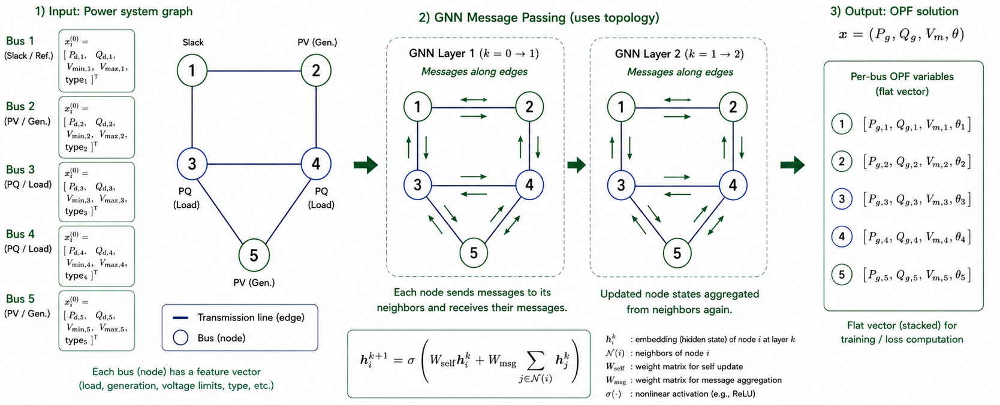



**Figure 7: GNN-style message passing over the grid graph.** Each bus starts with a node feature vector. At each layer, a bus updates its hidden state by combining its own representation with messages from neighboring buses connected by transmission lines. Compared with the MLP, the propagation pattern is no longer dense all-to-all mixing; it follows the branch topology. (*Image note*: AI-assisted illustration created for tutorial use)



**Technical details.** In this tutorial, each bus has a hidden state. At every message-passing layer, a bus combines its own state with information aggregated from neighboring buses:

$$
h_i^{(k+1)} = \sigma\left(W_{\text{self}} h_i^{(k)} + W_{\text{nbr}} \sum_{j \in N(i)} a_{ij} h_j^{(k)}\right),
$$

where $N(i)$ is the set of neighboring buses and $a_{ij}$ comes from the normalized branch adjacency. This operation does not solve AC-OPF, but it gives the model a topology-aware representation before producing the same OPF output vector used by the MLP models.

This notebook implements the message-passing idea directly in PyTorch to keep the dependency stack small for Colab. In larger projects, the same idea is often implemented with packages such as PyTorch Geometric, which provide standard graph layers, batching utilities, and edge-feature support.



**Implementation.** The next cells build bus-level features from the Case 5 network and train a small message-passing model. The comparison stays controlled: same inputs, same targets, same training loop, and same OPF-aware metrics as the MLP variants.

In [59]:
# Build graph-style features for a topology-aware OPF model.
# This is a representation exercise; it does not require installing a GNN library.

bus_array = net['bus']
gen_array = net['gen']
branch_array = net['branch']
base_mva = net['baseMVA']

bus_ids = bus_array[:, idx_bus.BUS_I].astype(int)
bus_id_to_idx = {bus_id: i for i, bus_id in enumerate(bus_ids)}

node_rows = []
for row_idx, bus_id in enumerate(bus_ids):
    gens_at_bus = gen_array[gen_array[:, idx_gen.GEN_BUS].astype(int) == bus_id]
    online_gens = gens_at_bus[gens_at_bus[:, idx_gen.GEN_STATUS] > 0]
    node_rows.append({
        'bus_id': bus_id,
        'node_index': row_idx,
        'bus_type': int(bus_array[row_idx, idx_bus.BUS_TYPE]),
        'pd_pu': bus_array[row_idx, idx_bus.PD] / base_mva,
        'qd_pu': bus_array[row_idx, idx_bus.QD] / base_mva,
        'vmin': bus_array[row_idx, idx_bus.VMIN],
        'vmax': bus_array[row_idx, idx_bus.VMAX],
        'has_generator': int(len(online_gens) > 0),
        'pmax_total_pu': online_gens[:, idx_gen.PMAX].sum() / base_mva if len(online_gens) else 0.0,
        'pmin_total_pu': online_gens[:, idx_gen.PMIN].sum() / base_mva if len(online_gens) else 0.0,
        'qmax_total_pu': online_gens[:, idx_gen.QMAX].sum() / base_mva if len(online_gens) else 0.0,
        'qmin_total_pu': online_gens[:, idx_gen.QMIN].sum() / base_mva if len(online_gens) else 0.0,
    })

edge_rows = []
edge_index = []
for branch_idx, branch in enumerate(branch_array):
    source_bus = int(branch[idx_brch.F_BUS])
    target_bus = int(branch[idx_brch.T_BUS])
    edge_rows.append({
        'branch_id': branch_idx,
        'source_bus': source_bus,
        'target_bus': target_bus,
        'source_index': bus_id_to_idx[source_bus],
        'target_index': bus_id_to_idx[target_bus],
        'r': branch[idx_brch.BR_R],
        'x': branch[idx_brch.BR_X],
        'b': branch[idx_brch.BR_B],
        'rateA_pu': branch[idx_brch.RATE_A] / base_mva,
        'status': int(branch[idx_brch.BR_STATUS]),
        'angmin_rad': np.deg2rad(branch[idx_brch.ANGMIN]),
        'angmax_rad': np.deg2rad(branch[idx_brch.ANGMAX]),
    })
    edge_index.append([bus_id_to_idx[source_bus], bus_id_to_idx[target_bus]])

node_features = pd.DataFrame(node_rows)
edge_features = pd.DataFrame(edge_rows)
edge_index = np.array(edge_index, dtype=np.int64).T
edge_index_undirected = np.concatenate([edge_index, edge_index[::-1]], axis=1)

print('Node feature table shape:', node_features.shape)
print('Edge feature table shape:', edge_features.shape)
print('Directed edge_index shape:', edge_index.shape)
print('Undirected edge_index shape:', edge_index_undirected.shape)

display(node_features)
display(edge_features)


Node feature table shape: (5, 12)
Edge feature table shape: (6, 12)
Directed edge_index shape: (2, 6)
Undirected edge_index shape: (2, 12)


,bus_id,node_index,bus_type,pd_pu,qd_pu,vmin,vmax,has_generator,pmax_total_pu,pmin_total_pu,qmax_total_pu,qmin_total_pu
0,1,0,2,0.0,0.0000,0.9,1.1,1,2.1,0.0,1.575,-1.575
1,2,1,1,3.0,0.9861,0.9,1.1,0,0.0,0.0,0.000,0.000
2,3,2,2,3.0,0.9861,0.9,1.1,1,5.2,0.0,3.900,-3.900
3,4,3,3,4.0,1.3147,0.9,1.1,1,2.0,0.0,1.500,-1.500
4,5,4,2,0.0,0.0000,0.9,1.1,1,6.0,0.0,4.500,-4.500


,branch_id,source_bus,target_bus,source_index,target_index,r,x,b,rateA_pu,status,angmin_rad,angmax_rad
0,0,1,2,0,1,0.00281,0.0281,0.00712,4.00,1,-0.523599,0.523599
1,1,1,4,0,3,0.00304,0.0304,0.00658,4.26,1,-0.523599,0.523599
2,2,1,5,0,4,0.00064,0.0064,0.03126,4.26,1,-0.523599,0.523599
3,3,2,3,1,2,0.00108,0.0108,0.01852,4.26,1,-0.523599,0.523599
4,4,3,4,2,3,0.00297,0.0297,0.00674,4.26,1,-0.523599,0.523599
5,5,4,5,3,4,0.00297,0.0297,0.00674,2.40,1,-0.523599,0.523599


To keep the tutorial lightweight, we implement the GNN-style model directly in PyTorch rather than installing a graph-learning package. Each sample becomes **one node feature vector per bus**:

* dynamic features: active and reactive loads placed on the corresponding load buses;
* static bus features: bus type, voltage limits, and generator capacity;
* topology: the branch adjacency matrix from the loaded PYPOWER/PGLib case.

For this tutorial, that means five bus-node feature vectors from PJM Case 5. The representation is intentionally small, but it mirrors the node/edge data layout used by larger graph-learning pipelines. In the code below, we use a normalized adjacency matrix so that neighbor aggregation keeps a stable scale during training instead of growing with the number of connected lines. In larger projects, PyTorch Geometric or DGL would usually handle graph batching, edge indices, edge attributes, and case-level metadata.

In [60]:
# Shared bus-level utilities for topology-aware models.

def build_normalized_adjacency(edge_index_undirected, nbus):
    adjacency = torch.zeros((nbus, nbus), dtype=torch.float32)
    for source, target in edge_index_undirected.T:
        adjacency[int(source), int(target)] = 1.0
    adjacency = adjacency + torch.eye(nbus, dtype=torch.float32)
    degree = adjacency.sum(dim=1, keepdim=True).clamp_min(1.0)
    return adjacency / degree


static_feature_cols = [
    'bus_type', 'vmin', 'vmax', 'has_generator',
    'pmax_total_pu', 'pmin_total_pu', 'qmax_total_pu', 'qmin_total_pu',
]
static_node_feature_values = node_features[static_feature_cols].to_numpy(dtype=np.float32)
static_node_feature_values[:, 0] = static_node_feature_values[:, 0] / 3.0

load_bus_indices_graph = list(context['load_bus'])
adjacency_graph = build_normalized_adjacency(edge_index_undirected, nbus=len(net['bus']))

print('Static node feature matrix:', static_node_feature_values.shape)
print('Load bus indices:', load_bus_indices_graph)
print('Normalized adjacency matrix:')
print(adjacency_graph)


Static node feature matrix: (5, 8)
Load bus indices: [np.int64(1), np.int64(2), np.int64(3)]
Normalized adjacency matrix:
tensor([[0.2500, 0.2500, 0.0000, 0.2500, 0.2500],
        [0.3333, 0.3333, 0.3333, 0.0000, 0.0000],
        [0.0000, 0.3333, 0.3333, 0.3333, 0.0000],
        [0.2500, 0.0000, 0.2500, 0.2500, 0.2500],
        [0.3333, 0.0000, 0.0000, 0.3333, 0.3333]])


In [61]:
class BusLevelModelBase(nn.Module):
    def __init__(self, static_node_features, load_bus_indices):
        super().__init__()
        self.register_buffer('static_node_features', torch.as_tensor(static_node_features, dtype=torch.float32))
        self.load_bus_indices = list(load_bus_indices)
        self.nbus = static_node_features.shape[0]
        self.node_feature_dim = static_node_features.shape[1] + 2

    def make_node_features(self, x):
        batch = x.shape[0]
        static = self.static_node_features.to(x.device).unsqueeze(0).expand(batch, -1, -1)
        load_features = torch.zeros((batch, self.nbus, 2), dtype=x.dtype, device=x.device)
        nload = len(self.load_bus_indices)
        for load_pos, bus_idx in enumerate(self.load_bus_indices):
            load_features[:, bus_idx, 0] = x[:, load_pos]
            load_features[:, bus_idx, 1] = x[:, load_pos + nload]
        return torch.cat([load_features, static], dim=-1)


class SimpleGraphConv(nn.Module):
    def __init__(self, width):
        super().__init__()
        self.self_linear = nn.Linear(width, width)
        self.neighbor_linear = nn.Linear(width, width)
        self.activation = nn.ReLU()

    def forward(self, node_state, adjacency):
        neighbor_state = torch.einsum('ij,bjf->bif', adjacency.to(node_state.device), node_state)
        return self.activation(self.self_linear(node_state) + self.neighbor_linear(neighbor_state))


class TopologyGNN(BusLevelModelBase):
    def __init__(self, static_node_features, load_bus_indices, adjacency, y_size, width=48, depth=2):
        super().__init__(static_node_features, load_bus_indices)
        self.register_buffer('adjacency', adjacency.to(torch.float32))
        self.input_projection = nn.Linear(self.node_feature_dim, width)
        self.layers = nn.ModuleList([SimpleGraphConv(width) for _ in range(depth)])
        self.output_head = nn.Sequential(
            nn.Linear(self.nbus * width, 96),
            nn.ReLU(),
            nn.Linear(96, y_size),
        )

    def forward(self, x):
        node_state = self.input_projection(self.make_node_features(x))
        for layer in self.layers:
            node_state = layer(node_state, self.adjacency)
        return self.output_head(node_state.flatten(start_dim=1))


model_gnn = TopologyGNN(
    static_node_features=static_node_feature_values,
    load_bus_indices=load_bus_indices_graph,
    adjacency=adjacency_graph,
    y_size=len(outputs),
    width=48,
    depth=2,
).to(device)

metrics_gnn = model_train_test(
    train_dataloader, test_dataloader, model_gnn,
    nn.MSELoss(), opf_metric,
    epochs=10, model_name='Topology GNN'
)
register_model_result(
    'Topology GNN', metrics_gnn, model_gnn,
    learning_step='5. Topology',
    family='GNN',
    main_idea='Bus node features with branch message passing',
    training_signal='MSE',
    architecture_note='Message passing over one node feature vector per bus on the fixed 5-bus branch topology.',
    main_path=True,
)
summarize_opf_metrics(metrics_gnn, include_training=True, model_size_lookup=model_size_lookup)


Epoch 1 | Train loss: 0.858 |  Test mse: 0.252, opt gap: 0.983%,  eq compact mean: 5.371,  ineq compact mean: 0.451


Epoch 2 | Train loss: 0.250 |  Test mse: 0.192, opt gap: 6.109%,  eq compact mean: 8.030,  ineq compact mean: 0.785


Epoch 3 | Train loss: 0.161 |  Test mse: 0.120, opt gap: 2.972%,  eq compact mean: 7.382,  ineq compact mean: 0.602


Epoch 4 | Train loss: 0.098 |  Test mse: 0.079, opt gap: 3.390%,  eq compact mean: 5.436,  ineq compact mean: 0.420


Epoch 5 | Train loss: 0.079 |  Test mse: 0.075, opt gap: 4.230%,  eq compact mean: 5.093,  ineq compact mean: 0.383


Epoch 6 | Train loss: 0.073 |  Test mse: 0.065, opt gap: -1.700%,  eq compact mean: 4.406,  ineq compact mean: 0.372


Epoch 7 | Train loss: 0.068 |  Test mse: 0.061, opt gap: 2.174%,  eq compact mean: 4.653,  ineq compact mean: 0.375


Epoch 8 | Train loss: 0.063 |  Test mse: 0.059, opt gap: 1.769%,  eq compact mean: 4.225,  ineq compact mean: 0.372


Epoch 9 | Train loss: 0.060 |  Test mse: 0.055, opt gap: -0.636%,  eq compact mean: 3.551,  ineq compact mean: 0.252


Epoch 10 | Train loss: 0.057 |  Test mse: 0.053, opt gap: 0.090%,  eq compact mean: 3.494,  ineq compact mean: 0.271


,model,model_size_params,samples,mse,cost_gap_pct,power_mismatch_mean,ref_angle_vio_mean,bound_vio_mean,branch_flow_vio_mean,branch_angle_vio_mean,train_runtime_s,energy_kwh,emissions_kg_co2eq
0,Topology GNN,35012,2000,0.05881,0.034,4.057,0.012,0.021,1.527,0.0,26.87,0.000126,0.000034


**Conclusion and discussion.** The GNN changes the **backbone**: instead of treating inputs as one flat vector, it updates bus representations through the branch graph before predicting OPF variables.

* **Pros:** topology-aware representation; natural place to add branch parameters, limits, and edge features; better suited to larger grids, topology changes, and graph-structured datasets.
* **Cons:** message passing is local; long-range redispatch and congestion effects may need more layers, pooling, richer edge features, or hybrid designs.

**Further advanced methods.** Larger GNN pipelines usually use PyTorch Geometric or DGL, where each case can be represented with node features, edge indices, edge attributes, and graph-level metadata. They also need richer line features, batching across cases, and explicit tests for topology transfer.

💡 **Key takeaway.** Use the MLP as the default fixed-topology baseline. Use GNN-style backbones when topology is part of the learning problem.

### Extension 2: Transformer Model

**Motivation.** The GNN passes information through local branch neighborhoods. That matches the grid graph, but some OPF effects are not purely local: congestion, voltage support, and generator redispatch can create interactions across distant buses. A Transformer-style model illustrates a different representation idea: represent each bus with a feature vector and let every bus-level vector interact with every other bus-level vector through attention.



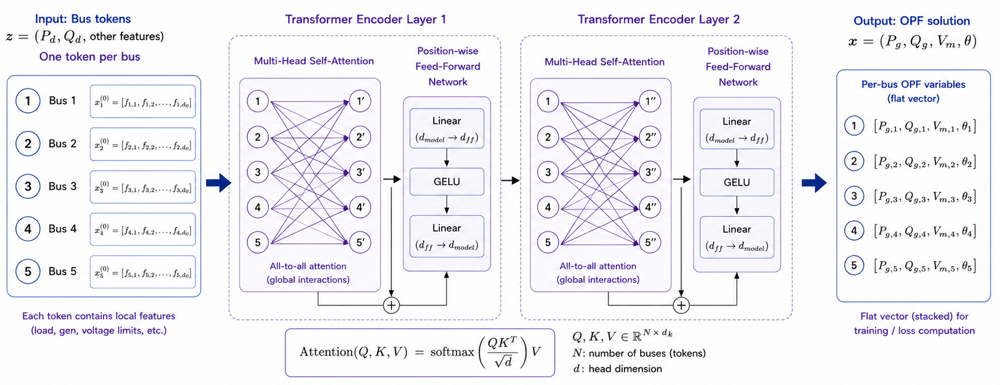



**Figure 8: Bus-level Transformer with global self-attention.** Each bus is represented by one feature vector with local load and bus features. In each encoder layer, multi-head self-attention creates direct all-to-all interactions between bus-level feature vectors, followed by a position-wise feed-forward block. Compared with the GNN, the propagation pattern is global rather than restricted to neighboring buses. (*Image note*: AI-assisted illustration created for tutorial use)



**Technical details.** In a self-attention layer, each bus-level feature vector can directly attend to all other bus-level feature vectors:

$$
\text{Attention}(Q,K,V) = \text{softmax}\left(\frac{QK^\top}{\sqrt{d}}\right)V.
$$

This tutorial uses a simplified **bus-level Transformer**. Each bus is represented by one feature vector, and a learned bus embedding tells the model which feature vector corresponds to which bus. Because the topology is fixed in this 5-bus dataset, the model can learn some topology-dependent patterns implicitly.

The limitation is important: this is not an edge-aware grid Transformer. It does not explicitly pass line resistance $r$, reactance $x$, charging susceptance $b$, thermal limits, angle limits, or from/to bus indices into the attention layer. More advanced grid Transformers can inject edge features through attention bias terms, graph-aware positional encodings, or hybrid message-passing and attention layers.



**Implementation.** The next cell trains a compact Transformer encoder on the same bus-level representation used by the GNN. This keeps the comparison clean: same inputs, same targets, same evaluation, but a different interaction mechanism.

In [62]:
class BusLevelTransformer(BusLevelModelBase):
    def __init__(self, static_node_features, load_bus_indices, y_size, width=48, nhead=4, depth=2):
        super().__init__(static_node_features, load_bus_indices)
        self.input_projection = nn.Linear(self.node_feature_dim, width)
        self.bus_embedding = nn.Parameter(torch.zeros(1, self.nbus, width))
        encoder_layer = nn.TransformerEncoderLayer(
            d_model=width,
            nhead=nhead,
            dim_feedforward=2 * width,
            dropout=0.0,
            activation='gelu',
            batch_first=True,
        )
        self.encoder = nn.TransformerEncoder(encoder_layer, num_layers=depth)
        self.output_head = nn.Sequential(
            nn.Linear(self.nbus * width, 96),
            nn.ReLU(),
            nn.Linear(96, y_size),
        )

    def forward(self, x):
        node_state = self.input_projection(self.make_node_features(x)) + self.bus_embedding
        node_state = self.encoder(node_state)
        return self.output_head(node_state.flatten(start_dim=1))


model_transformer = BusLevelTransformer(
    static_node_features=static_node_feature_values,
    load_bus_indices=load_bus_indices_graph,
    y_size=len(outputs),
    width=48,
    nhead=4,
    depth=2,
).to(device)

metrics_transformer = model_train_test(
    train_dataloader, test_dataloader, model_transformer,
    nn.MSELoss(), opf_metric,
    epochs=10, model_name='Bus-level Transformer'
)
register_model_result(
    'Bus-level Transformer', metrics_transformer, model_transformer,
    learning_step='6. Attention',
    family='Transformer',
    main_idea='Bus-level feature vectors with global self-attention',
    training_signal='MSE',
    architecture_note='Self-attention over one feature vector per bus.',
    main_path=True,
)
summarize_opf_metrics(metrics_transformer, include_training=True, model_size_lookup=model_size_lookup)


Epoch 1 | Train loss: 0.690 |  Test mse: 0.200, opt gap: 3.594%,  eq compact mean: 12.920,  ineq compact mean: 1.557


Epoch 2 | Train loss: 0.124 |  Test mse: 0.077, opt gap: 2.769%,  eq compact mean: 8.586,  ineq compact mean: 0.746


Epoch 3 | Train loss: 0.068 |  Test mse: 0.054, opt gap: 0.995%,  eq compact mean: 7.801,  ineq compact mean: 0.622


Epoch 4 | Train loss: 0.050 |  Test mse: 0.040, opt gap: -1.847%,  eq compact mean: 5.686,  ineq compact mean: 0.438


Epoch 5 | Train loss: 0.040 |  Test mse: 0.038, opt gap: 4.626%,  eq compact mean: 4.763,  ineq compact mean: 0.294


Epoch 6 | Train loss: 0.035 |  Test mse: 0.027, opt gap: -0.616%,  eq compact mean: 4.213,  ineq compact mean: 0.289


Epoch 7 | Train loss: 0.032 |  Test mse: 0.028, opt gap: -0.053%,  eq compact mean: 5.502,  ineq compact mean: 0.383


Epoch 8 | Train loss: 0.029 |  Test mse: 0.028, opt gap: 3.845%,  eq compact mean: 4.281,  ineq compact mean: 0.259


Epoch 9 | Train loss: 0.026 |  Test mse: 0.023, opt gap: -3.387%,  eq compact mean: 4.301,  ineq compact mean: 0.234


Epoch 10 | Train loss: 0.023 |  Test mse: 0.018, opt gap: -0.794%,  eq compact mean: 4.220,  ineq compact mean: 0.222


,model,model_size_params,samples,mse,cost_gap_pct,power_mismatch_mean,ref_angle_vio_mean,bound_vio_mean,branch_flow_vio_mean,branch_angle_vio_mean,train_runtime_s,energy_kwh,emissions_kg_co2eq
0,Bus-level Transformer,63764,2000,0.02181,-0.673,4.606,0.025,0.01,1.114,0.0,32.79,0.00015,0.00004


**Conclusion and discussion.** The Transformer also changes the **backbone**, but uses global bus-to-bus attention instead of local graph propagation.

* **Pros:** every bus-level feature vector can directly interact with every other bus-level feature vector; useful when nonlocal dependencies matter.
* **Cons:** generic attention is not automatically grid-aware. Without adjacency, line parameters, admittance, electrical distance, or graph positional information, the model may learn bus-ID patterns rather than physical structure.

**Further advanced methods.** Grid-aware Transformers can add attention biases from adjacency/electrical distance, topology masks, line-level features, graph positional encodings, admittance-derived features, or hybrid GNN-Transformer layers.

💡 **Key takeaway.** Use GNNs when branch topology should guide propagation. Use Transformer-style backbones when global interactions matter, but augment attention with topology or electrical features for real-grid OPF.


### Extension 3: Physical Completion (via Predict-and-Reconstruct)

**Motivation.** The GNN and Transformer changed the **backbone representation**: how information moves through hidden layers before the output head. This extension changes a different design choice: the **output parameterization**.

In the baseline models, the network directly predicts the full OPF solution vector. That is simple, but it treats generator powers, voltage magnitudes, voltage angles, loads, and network admittance as if they were independent output coordinates. In AC power flow, they are coupled by equations.

A physics-guided alternative is **predict-and-complete**: predict voltage variables with a bounded neural network, then use power-balance equations to complete selected generator active/reactive powers.

There is one important modeling detail. If multiple generators sit at the same bus, we need a simple convention for deciding which variables are predicted and which variables are completed. This tutorial uses one **balancing generator** per generator bus:

* **Predicted by the neural network:** bounded voltage magnitudes, bounded non-reference voltage angles, and bounded `P/Q` for extra generators at buses with multiple generators.
* **Fixed by convention:** the reference-bus voltage angle.
* **Completed by equations:** `P/Q` for one balancing generator at each generator bus.
* **Training signal in this first test:** supervised MSE only, so we can isolate whether this output parameterization helps before adding penalties.
* **Still not guaranteed:** generator limits for completed variables, branch limits, or OPF optimality.

This reduces the number of free outputs while keeping the generator-bus mapping easy to inspect. It should be read as a lightweight physics-guided layer, not as a full power-flow or OPF solver inside the network.


**Technical details: forward pass.** In this simplified example, the neural network first predicts bounded voltage variables and bounded extra-generator outputs:

$$
(\widehat V_m, \widehat\theta_{\text{non-ref}}, \widehat P_G^{\text{extra}}, \widehat Q_G^{\text{extra}})
= \operatorname{BoundedHead}(f_\theta(z)),
$$

where $z$ is the load input. The bounded head uses the same idea as the earlier bounded MLP: map raw neural outputs through a sigmoid-style transformation into known lower/upper ranges.

The physical layer then sets the reference angle and constructs the full voltage state:

$$
\widehat\theta_{\text{ref}} = \theta_{\text{ref}},
\qquad
\widehat V_i = \widehat V_{m,i} e^{j\widehat\theta_i}.
$$

Using the admittance matrix $Y = G + jB$, bus complex power injection implied by the predicted voltage is

$$
\widehat S_i(\widehat V)
= \widehat V_i \overline{\sum_j Y_{ij}\widehat V_j}
= \widehat P_i(\widehat V) + j\widehat Q_i(\widehat V).
$$

If the predicted voltage were exactly consistent with the grid and load, bus-level generation would satisfy

$$
\widehat P_{G,i}^{\text{bus}} = P_{D,i} + \widehat P_i(\widehat V),
\qquad
\widehat Q_{G,i}^{\text{bus}} = Q_{D,i} + \widehat Q_i(\widehat V).
$$

For each generator bus, the tutorial layer chooses one balancing generator. If there are extra generators at that bus, their `P/Q` values are predicted by the neural network. The balancing generator absorbs the remaining bus-level requirement:

$$
\widehat P_{G,g_b}^{\text{bal}}
= \widehat P_{G,b}^{\text{bus}} - \sum_{g\in E_b}\widehat P_{G,g}^{\text{extra}},
\qquad
\widehat Q_{G,g_b}^{\text{bal}}
= \widehat Q_{G,b}^{\text{bus}} - \sum_{g\in E_b}\widehat Q_{G,g}^{\text{extra}},
$$

where $g_b$ is the balancing generator at bus $b$ and $E_b$ is the set of extra generators at that bus.

This completion rule is simple and transparent. However, it still does not guarantee full feasibility: completed balancing-generator outputs can violate generator limits, and load-only buses can still have residual mismatch if the predicted voltage is inconsistent.


**Technical details: backward pass and loss.** The completion formulas are written with PyTorch tensor operations, so automatic differentiation propagates through the algebraic layer. In this first version, we train with plain supervised MSE only.

This is deliberate. Earlier we saw that fixed quadratic OPF penalties can improve constraint metrics, but here we first want to isolate the effect of the output parameterization itself: bounded voltage prediction plus algebraic `P/Q` completion. After inspecting the result, one natural next experiment is to add the equality and inequality penalties back on top of this physical layer.


**Implementation.** The next four cells separate the idea into mapping, completion, model definition, and training. First we identify the reference bus, load buses, generator buses, and the balancing/extra generator split. Then we write the voltage-to-power completion helper. Next we wrap those pieces in a bounded neural network. Finally we train it with MSE only. It is intentionally lightweight: no nonlinear power-flow solve is run inside the network, and completed generator limits, branch limits, and cost optimality are not guaranteed by the layer.


In [63]:
# Step 1: choose one balancing generator per generator bus.
def identify_balancing_generator_mapping(opf_metric):
    gen_bus = opf_metric.gen_bus_index.astype(int)
    bus_type = opf_metric.case_int['bus'][:, idx_bus.BUS_TYPE]
    ref_bus = int(np.where(bus_type == idx_bus.REF)[0][0])
    non_ref_bus = np.array([bus for bus in range(opf_metric.nbus) if bus != ref_bus])

    balancing_gen = []
    extra_gen = []
    for bus in sorted(np.unique(gen_bus)):
        gens = np.where(gen_bus == bus)[0]
        balancing_gen.append(gens[0])
        extra_gen.extend(gens[1:])

    balancing_gen = np.array(balancing_gen, dtype=int)
    extra_gen = np.array(extra_gen, dtype=int)

    return {
        'ref_bus': ref_bus,
        'load_bus': np.array(opf_metric.load_bus_index),
        'non_ref_bus': non_ref_bus,
        'balancing_gen': balancing_gen,
        'balancing_bus': gen_bus[balancing_gen],
        'extra_gen': extra_gen,
        'extra_bus': gen_bus[extra_gen],
    }


In [64]:
# Step 2: complete one balancing generator's Pg/Qg at each generator bus.
def complete_balancing_generators_from_voltage(x, vm, va, pg_extra, qg_extra, layer):
    batch = x.shape[0]
    bus_pd = torch.zeros((batch, layer.nbus), dtype=x.dtype, device=x.device)
    bus_qd = torch.zeros_like(bus_pd)
    bus_pd[:, layer.load_bus] = x[:, :layer.nload]
    bus_qd[:, layer.load_bus] = x[:, layer.nload:2 * layer.nload]

    vr = vm * torch.cos(va)
    vi = vm * torch.sin(va)
    ir = vr @ layer.opf_metric.Ybus_real - vi @ layer.opf_metric.Ybus_imag
    ii = vi @ layer.opf_metric.Ybus_real + vr @ layer.opf_metric.Ybus_imag
    bus_p_required = vr * ir + vi * ii + bus_pd
    bus_q_required = vi * ir - vr * ii + bus_qd

    pg = torch.zeros((batch, layer.ngen), dtype=x.dtype, device=x.device)
    qg = torch.zeros_like(pg)
    bus_p_extra = torch.zeros((batch, layer.nbus), dtype=x.dtype, device=x.device)
    bus_q_extra = torch.zeros_like(bus_p_extra)

    pg[:, layer.extra_gen] = pg_extra
    qg[:, layer.extra_gen] = qg_extra
    bus_p_extra.index_add_(1, layer.extra_bus, pg_extra)
    bus_q_extra.index_add_(1, layer.extra_bus, qg_extra)

    pg[:, layer.balancing_gen] = bus_p_required[:, layer.balancing_bus] - bus_p_extra[:, layer.balancing_bus]
    qg[:, layer.balancing_gen] = bus_q_required[:, layer.balancing_bus] - bus_q_extra[:, layer.balancing_bus]
    return pg, qg


In [65]:
# Step 3: bounded neural backbone predicts voltage and extra-generator outputs, then completes balancing generators.
class PartialPFPhysicalLayerMLP(nn.Module):
    def __init__(self, x_size, opf_metric, width=64, depth=3):
        super().__init__()
        self.opf_metric = opf_metric
        self.nbus = opf_metric.nbus
        self.ngen = opf_metric.ngen
        self.nload = len(opf_metric.load_bus_index)

        mapping = identify_balancing_generator_mapping(opf_metric)
        self.ref_bus = mapping['ref_bus']
        for name in [
            'load_bus', 'non_ref_bus',
            'balancing_gen', 'balancing_bus', 'extra_gen', 'extra_bus',
        ]:
            self.register_buffer(name, torch.as_tensor(mapping[name], dtype=torch.long))
        self.n_extra = len(mapping['extra_gen'])
        self.n_va = len(mapping['non_ref_bus'])

        outputs_min = opf_metric.outputs_min
        outputs_max = opf_metric.outputs_max
        slices = opf_metric.output_slices

        def bound_pair(name, columns=None):
            lower = outputs_min[:, slices[name]]
            upper = outputs_max[:, slices[name]]
            if columns is not None:
                lower = lower[:, columns]
                upper = upper[:, columns]
            return lower, upper

        bounds = {
            'pg_extra': bound_pair('pg', mapping['extra_gen']),
            'qg_extra': bound_pair('qg', mapping['extra_gen']),
            'vm': bound_pair('vm'),
            'va_non_ref': bound_pair('va', mapping['non_ref_bus']),
        }
        for name, (lower, upper) in bounds.items():
            self.register_buffer(f'{name}_min', lower)
            self.register_buffer(f'{name}_max', upper)

        ref_angle = opf_metric.case_int['bus'][self.ref_bus, idx_bus.VA] * np.pi / 180.0
        self.register_buffer('ref_angle', torch.tensor(float(ref_angle)))

        n_outputs = 2 * self.n_extra + self.nbus + self.n_va
        layers = [nn.Linear(x_size, width), nn.ReLU()]
        for _ in range(depth):
            layers += [nn.Linear(width, width), nn.ReLU()]
        layers.append(nn.Linear(width, n_outputs))
        self.direct_net = nn.Sequential(*layers)

    def bounded_map(self, raw, lower, upper):
        return lower + (upper - lower) * torch.sigmoid(raw)

    def forward(self, x):
        raw = self.direct_net(x)
        pos = 0
        raw_pg_extra = raw[:, pos:pos + self.n_extra]
        pos += self.n_extra
        raw_qg_extra = raw[:, pos:pos + self.n_extra]
        pos += self.n_extra
        raw_vm = raw[:, pos:pos + self.nbus]
        pos += self.nbus
        raw_va = raw[:, pos:pos + self.n_va]

        pg_extra = self.bounded_map(raw_pg_extra, self.pg_extra_min, self.pg_extra_max)
        qg_extra = self.bounded_map(raw_qg_extra, self.qg_extra_min, self.qg_extra_max)
        vm = self.bounded_map(raw_vm, self.vm_min, self.vm_max)
        va = torch.zeros((x.shape[0], self.nbus), dtype=x.dtype, device=x.device)
        va[:, self.ref_bus] = self.ref_angle.to(x.device)
        va[:, self.non_ref_bus] = self.bounded_map(raw_va, self.va_non_ref_min, self.va_non_ref_max)

        pg, qg = complete_balancing_generators_from_voltage(x, vm, va, pg_extra, qg_extra, self)
        return torch.cat([pg, qg, vm, va], dim=1)


In [66]:
model_partial_pf = PartialPFPhysicalLayerMLP(
    x_size=len(inputs),
    opf_metric=opf_metric,
    width=64,
    depth=3,
).to(device)

metrics_partial_pf = model_train_test(
    train_dataloader, test_dataloader, model_partial_pf,
    nn.MSELoss(), opf_metric,
    epochs=10,
    model_name='Partial PF physical-layer MLP'
)
register_model_result(
    'Partial PF physical-layer MLP', metrics_partial_pf, model_partial_pf,
    learning_step='7. Physical completion',
    family='Physical-layer MLP',
    main_idea='Predict bounded V and extra-generator P/Q; complete balancing-generator P/Q',
    training_signal='MSE',
    architecture_note='Bounded MLP predicts voltage and extra-generator outputs; one balancing generator per generator bus is completed from AC power-balance equations.',
    main_path=True,
)
summarize_opf_metrics(metrics_partial_pf, include_training=True, model_size_lookup=model_size_lookup)


Epoch 1 | Train loss: 8.805 |  Test mse: 0.830, opt gap: 26.311%,  eq compact mean: 0.346,  ineq compact mean: 0.108


Epoch 2 | Train loss: 0.635 |  Test mse: 0.517, opt gap: -1.233%,  eq compact mean: 0.215,  ineq compact mean: 0.058


Epoch 3 | Train loss: 0.453 |  Test mse: 0.409, opt gap: -3.418%,  eq compact mean: 0.182,  ineq compact mean: 0.047


Epoch 4 | Train loss: 0.355 |  Test mse: 0.316, opt gap: -4.529%,  eq compact mean: 0.180,  ineq compact mean: 0.042


Epoch 5 | Train loss: 0.297 |  Test mse: 0.274, opt gap: -2.483%,  eq compact mean: 0.177,  ineq compact mean: 0.041


Epoch 6 | Train loss: 0.261 |  Test mse: 0.239, opt gap: -4.644%,  eq compact mean: 0.186,  ineq compact mean: 0.033


Epoch 7 | Train loss: 0.234 |  Test mse: 0.218, opt gap: -1.579%,  eq compact mean: 0.166,  ineq compact mean: 0.034


Epoch 8 | Train loss: 0.213 |  Test mse: 0.199, opt gap: -0.224%,  eq compact mean: 0.156,  ineq compact mean: 0.033


Epoch 9 | Train loss: 0.194 |  Test mse: 0.180, opt gap: -2.149%,  eq compact mean: 0.160,  ineq compact mean: 0.028


Epoch 10 | Train loss: 0.179 |  Test mse: 0.163, opt gap: -1.959%,  eq compact mean: 0.148,  ineq compact mean: 0.030


,model,model_size_params,samples,mse,cost_gap_pct,power_mismatch_mean,ref_angle_vio_mean,bound_vio_mean,branch_flow_vio_mean,branch_angle_vio_mean,train_runtime_s,energy_kwh,emissions_kg_co2eq
0,Partial PF physical-layer MLP,13643,2000,0.17303,-2.705,0.165,0.0,0.046,0.008,0.0,27.26,0.00011,0.000029


**Conclusion and discussion.** Physical completion changes the **output parameterization**. The model predicts bounded voltage variables and bounded extra-generator outputs, then reconstructs one balancing generator at each generator bus from AC power-flow relationships.

* **Pros:** fewer free outputs; part of the equality structure is built into the prediction path.
* **Cons:** not full feasibility. The completion only enforces the specific equations used to reconstruct selected generator outputs; it does not guarantee all bus equations, generator limits, branch limits, or OPF optimality.

**Further advanced methods.** A natural next step is to combine this predict-and-complete layer with the equality and inequality penalties from Exercise 2, then verify the resulting dispatch with OPF-aware metrics.

💡 **Key takeaway.** Output parameterization can make the prediction more physical, but it still needs OPF-aware training, repair, or solver verification.


**Further advanced methods: toward full equation feasibility.** A stronger physical layer can solve dependent variables inside the forward pass. Given predicted control variables $u$, define a residual equation

$$
F(y,u)=0,
$$

where $y$ contains dependent variables such as voltage angles, reactive power, or slack generation. The forward pass solves for $y^*(u)$, and the backward pass can use the implicit-function theorem:

$$
\frac{\partial y^*}{\partial u}
= -\left(\frac{\partial F}{\partial y}\right)^{-1}
\frac{\partial F}{\partial u}.
$$

This is more faithful to the physics, but it requires a robust nonlinear solve inside training and careful handling of convergence failures, singular Jacobians, limits, and infeasible operating points.


### Extension 4: Augmented Lagrangian Training

**Motivation.** Exercise 2 added fixed OPF penalty weights to the supervised MSE loss. That was a useful first step because it made equality and inequality violations visible during training. It also exposed a practical problem: **quadratic penalty weights are hard to tune**.

If the equality weight is too small, the model may ignore power-balance residuals. If it is too large, training may sacrifice label accuracy or cost. The same issue appears for bounds, branch-flow limits, and branch-angle limits. Different constraint items can also have different scales, and the hardest constraints may change during training.

A pure Lagrangian update is adaptive, but it can be unstable in a short neural-network training run because the equality residuals are signed and the dual variables start from zero. A more practical tutorial variant is **augmented Lagrangian training**: keep adaptive dual variables, but also add a small quadratic penalty term that gives stable constraint pressure from the beginning.

In this tutorial, augmented Lagrangian training changes the **training rule**, not the neural backbone or output parameterization.


**Technical details.** The idea comes from the Lagrangian form of constrained optimization. A standard problem is

$$
\min_x f(x) \quad \text{s.t.} \quad h_i(x)=0,\; g_j(x)\le 0.
$$

The standard Lagrangian augments the objective with linear constraint terms:

$$
L(x,\lambda,\mu)
= f(x) + \sum_i \lambda_i h_i(x) + \sum_j \mu_j g_j(x),
\qquad \mu_j \ge 0.
$$

The equality multiplier $\lambda_i$ is a free variable: it can be positive or negative. The inequality multiplier $\mu_j$ is constrained to be nonnegative. In neural-network training, however, a purely linear Lagrangian term can be noisy and weak early in training. The augmented Lagrangian adds quadratic residual penalties:

$$
L_{\text{aug}}(x,\lambda,\mu)
= f(x)
+ \sum_i \lambda_i h_i(x)
+ \sum_j \mu_j v_j(x)
+ \frac{\rho_h}{2}\sum_i h_i(x)^2
+ \frac{\rho_g}{2}\sum_j v_j(x)^2,
$$

where $v_j(x)=\max(0,g_j(x))$ is the nonnegative violation of inequality constraint $j$.

This uses the same quadratic penalty style as the fixed quadratic-penalty loss introduced earlier: equality terms use signed active/reactive power-balance residuals, and inequality terms use nonnegative bound/branch violations. The augmented Lagrangian then adds itemwise dual terms on top of those quadratic penalties. Because the augmented formula uses the convention $\rho/2$, `rho_eq` and `rho_ineq` play the same role as quadratic penalty weights but are not numerically identical to `w_eq` and `w_ineq`.

For neural OPF training, the neural-network parameters play the role of the primal variables. The dual variables are not model weights; they are adaptive multipliers attached to constraint residuals. A training epoch alternates between two steps:

1. **Primal update:** train the neural network with the current augmented Lagrangian loss.
2. **Dual update:** update multipliers according to the current mean constraint residuals.

**Implementation.** In this notebook, augmented Lagrangian training only changes the neural-network loss. It does not solve the OPF KKT system and does not certify feasibility. For this tutorial, we keep the implementation compact:

* one free equality multiplier for each signed active/reactive power-balance residual item;
* one nonnegative inequality multiplier for each bound, branch-flow, and branch-angle violation item;
* small quadratic penalties on equality residuals and inequality violations;
* one lightweight dual-ascent update after each training epoch.

This is still a simplified training heuristic, but it is more stable than a pure linear Lagrangian because the quadratic terms provide constraint pressure even before the dual variables become informative.


In [67]:
class AugmentedLagrangianLoss(nn.Module):
    def __init__(self, opf_metric, w_mse=1.0, rho_eq=1e-3, rho_ineq=1e-3):
        super().__init__()
        self.opf_metric = opf_metric
        self.w_mse = w_mse
        self.rho_eq = rho_eq
        self.rho_ineq = rho_ineq
        self.register_buffer('lambda_eq', torch.empty(0))
        self.register_buffer('lambda_ineq', torch.empty(0))

    def _ensure_duals(self, eq_mean, ineq_mean):
        if self.lambda_eq.numel() != eq_mean.numel():
            self.lambda_eq = torch.zeros_like(eq_mean.detach())
        if self.lambda_ineq.numel() != ineq_mean.numel():
            self.lambda_ineq = torch.zeros_like(ineq_mean.detach())

    def forward(self, X, pred, target):
        mse = torch.mean(torch.square(pred - target))
        eq_items, ineq_items = opf_constraint_items(self.opf_metric, X, pred)
        eq_mean = eq_items.mean(dim=0)
        ineq_mean = ineq_items.mean(dim=0)
        self._ensure_duals(eq_mean, ineq_mean)

        lagrangian_term = (
            torch.sum(self.lambda_eq.detach() * eq_mean)
            + torch.sum(self.lambda_ineq.detach() * ineq_mean)
        )
        eq_penalty, ineq_penalty = quadratic_constraint_penalty(eq_items, ineq_items)
        quadratic_penalty = 0.5 * self.rho_eq * eq_penalty + 0.5 * self.rho_ineq * ineq_penalty
        return self.w_mse * mse + lagrangian_term + quadratic_penalty

    @torch.no_grad()
    def update_duals(self, eq_mean, ineq_mean, dual_lr=1e-4):
        self._ensure_duals(eq_mean, ineq_mean)
        self.lambda_eq = self.lambda_eq + dual_lr * eq_mean
        self.lambda_ineq = torch.clamp(self.lambda_ineq + dual_lr * ineq_mean, min=0.0)


In [68]:
def augmented_lagrangian_train_test(train_dataloader, test_dataloader, model,
                                    loss_fn, opf_metric, epochs=10, dual_lr=1e-4,
                                    model_name='Augmented-Lagrangian model'):
    torch.manual_seed(SEED)
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
    tracker = start_emissions_tracker(model_name)
    train_start_time = time.perf_counter()

    for t in range(epochs):
        model.train()
        train_loss = []
        for X, y in train_dataloader:
            X, y = X.to(device), y.to(device)
            pred = model(X)
            loss = loss_fn(X, pred, y)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            train_loss.append(loss.item())

        # Lightweight dual update: estimate constraint means on one training batch.
        X_dual, _ = next(iter(train_dataloader))
        X_dual = X_dual.to(device)
        model.eval()
        with torch.no_grad():
            pred_dual = model(X_dual)
            eq_items, ineq_items = opf_constraint_items(opf_metric, X_dual, pred_dual)
            loss_fn.update_duals(
                eq_items.mean(dim=0), ineq_items.mean(dim=0), dual_lr=dual_lr
            )

        test_sol_mse, test_obj_gap, eq_vio, ineq_vio = evaluate_training_snapshot(test_dataloader, model, opf_metric)
        print(f"Epoch {t+1} | Train loss: {np.mean(train_loss):.3f} | ",
              f"Test mse: {test_sol_mse.mean():.3f}, ",
              f"opt gap: {100 * test_obj_gap.mean():.3f}%, ",
              f"eq compact mean: {eq_vio.mean():.3f}, ",
              f"ineq compact mean: {ineq_vio.mean():.3f}")

    emissions_metrics = stop_emissions_tracker(tracker)
    train_runtime_s = time.perf_counter() - train_start_time

    metrics = evaluate_model_on_dataloader(opf_metric, model, test_dataloader, model_name)
    for key, value in emissions_metrics.items():
        metrics[key] = value
    metrics['train_runtime_s'] = train_runtime_s
    metrics['training_epochs'] = epochs
    return metrics


In [69]:
model_aug_lagrangian = BoundedNeuralNetwork(
    x_size=len(inputs),
    y_size=len(outputs),
    width=64,
    depth=4,
    yl=opf_metric.outputs_min,
    yu=opf_metric.outputs_max,
).to(device)

aug_lagrangian_loss = AugmentedLagrangianLoss(
    opf_metric,
    w_mse=1.0,
    rho_eq=1e-3,
    rho_ineq=1e-3,
)
metrics_aug_lagrangian = augmented_lagrangian_train_test(
    train_dataloader, test_dataloader, model_aug_lagrangian,
    aug_lagrangian_loss, opf_metric,
    epochs=10, dual_lr=1e-3, model_name='Augmented-Lagrangian bounded MLP'
)
register_model_result(
    'Augmented-Lagrangian bounded MLP', metrics_aug_lagrangian, model_aug_lagrangian,
    learning_step='8. Augmented Lagrangian training',
    family='Augmented-Lagrangian MLP',
    main_idea='Bounded MLP with quadratic penalties and adaptive dual terms',
    training_signal='MSE + augmented Lagrangian terms',
    architecture_note='Bounded MLP trained with itemwise dual variables plus quadratic equality/inequality penalties.',
    main_path=True,
)
summarize_opf_metrics(metrics_aug_lagrangian, include_training=True, model_size_lookup=model_size_lookup)


Epoch 1 | Train loss: 2.701 |  Test mse: 0.235,  opt gap: 3.937%,  eq compact mean: 7.289,  ineq compact mean: 0.785


Epoch 2 | Train loss: -0.063 |  Test mse: 0.182,  opt gap: 4.226%,  eq compact mean: 11.824,  ineq compact mean: 1.615


Epoch 3 | Train loss: -0.412 |  Test mse: 0.171,  opt gap: -0.111%,  eq compact mean: 11.549,  ineq compact mean: 1.336


Epoch 4 | Train loss: 0.428 |  Test mse: 0.144,  opt gap: 3.458%,  eq compact mean: 5.023,  ineq compact mean: 0.352


Epoch 5 | Train loss: 0.185 |  Test mse: 0.134,  opt gap: 4.717%,  eq compact mean: 3.101,  ineq compact mean: 0.068


Epoch 6 | Train loss: 0.147 |  Test mse: 0.124,  opt gap: 3.086%,  eq compact mean: 2.896,  ineq compact mean: 0.177


Epoch 7 | Train loss: 0.187 |  Test mse: 0.117,  opt gap: 2.954%,  eq compact mean: 4.128,  ineq compact mean: 0.160


Epoch 8 | Train loss: 0.187 |  Test mse: 0.110,  opt gap: 4.000%,  eq compact mean: 2.989,  ineq compact mean: 0.121


Epoch 9 | Train loss: 0.203 |  Test mse: 0.106,  opt gap: 2.905%,  eq compact mean: 2.225,  ineq compact mean: 0.021


Epoch 10 | Train loss: 0.169 |  Test mse: 0.100,  opt gap: 2.747%,  eq compact mean: 1.789,  ineq compact mean: 0.078


,model,model_size_params,samples,mse,cost_gap_pct,power_mismatch_mean,ref_angle_vio_mean,bound_vio_mean,branch_flow_vio_mean,branch_angle_vio_mean,train_runtime_s,energy_kwh,emissions_kg_co2eq
0,Augmented-Lagrangian bounded MLP,18516,2000,0.10898,5.33,1.962,0.063,0.0,0.387,0.0,30.85,0.000125,0.000033


**Conclusion and discussion.** Augmented Lagrangian training changes the **training rule**. It responds to the fixed-weight limitation from Exercise 2 by combining quadratic penalties with adaptive itemwise dual variables.

* **Pros:** quadratic terms provide immediate constraint pressure; dual variables increase pressure on constraint items that remain violated.
* **Cons:** dual learning rates, penalty parameters, stochastic batches, and nonconvex neural-network training can all affect stability; feasibility is still not certified.

**Further advanced methods.** More realistic workflows may use adaptive penalty schedules, full-dataset multiplier updates, differentiable optimization layers, feasibility restoration networks, active-constraint prediction, warm starts, or solver-in-the-loop repair.

💡 **Key takeaway.** Augmented Lagrangian training is a constraint-aware training heuristic, not an OPF solver replacement. Final operational use still needs feasibility checking or repair.


### Main-Path Architecture Comparison

The table below summarizes the main tutorial path by **what changes** in each method. Read it as a design map, not a leaderboard.

| Method | Design type | What changes | Main benefit | Main limitation |
|---|---|---|---|---|
| Baseline MLP | Backbone | Flat-vector supervised predictor | Simple, fast, strong fixed-topology baseline | No explicit topology, physics, or feasibility structure |
| Bounded MLP | Output parameterization | Output range is mapped into known variable bounds | Removes direct lower/upper-bound violations | Does not enforce AC power balance or branch limits |
| Fixed quadratic OPF penalties | Loss design | Adds hand-weighted squared violation terms to the loss | Makes feasibility visible during training | Quadratic penalty weights are hard to tune and scale-sensitive |
| Self-supervised OPF loss | Loss design | Trains from OPF objective and violation terms without supervised MSE | Reduces reliance on solver labels | Harder to optimize and can give misleading objective values if feasibility is poor |
| GNN | Backbone | Uses branch topology for message passing | Topology-aware representation | Local propagation may miss long-range effects without richer design |
| Transformer | Backbone | Uses bus-level feature vectors with global self-attention | Flexible nonlocal bus-to-bus interactions | Needs topology/electrical features to be grid-aware |
| Physical completion | Output parameterization | Predicts fewer variables and reconstructs selected dependent variables | Encodes part of the equality structure | Adds computation and does not certify full feasibility |
| Augmented Lagrangian training | Training rule | Adds quadratic penalties plus adaptive dual terms | Combines stable fixed pressure with adaptive constraint weighting | Adds training dynamics and still needs verification or repair |

The compact table above compares the **modeling components**. The next table switches from component descriptions to **numerical results**: it keeps the same main-path rows, omits exercise-only capacity variants, and reports the shared OPF-aware metrics.

⚠️ **Training budget note.** These numerical rows use a short 10-epoch tutorial budget so the notebook runs quickly in Colab. Use them to compare modeling behavior under one controlled teaching setup, not as final performance rankings. Serious reporting would require longer runs, repeated seeds, and hyperparameter tuning.


In [70]:
model_comparison_table = pd.concat(model_comparison_rows.values(), ignore_index=True).reset_index(drop=True)

main_model_names = [
    name for name, meta in model_metadata.items()
    if meta.get('main_path') and name in set(model_comparison_table['model'])
]

core_comparison_table = (
    model_comparison_table
    .set_index('model')
    .loc[main_model_names]
    .reset_index()
)

metadata_table = pd.DataFrame([
    {
        'model': name,
        'learning_step': model_metadata[name]['learning_step'],
        'main_idea': model_metadata[name]['main_idea'],
        'training_signal': model_metadata[name]['training_signal'],
    }
    for name in main_model_names
])

metric_table = summarize_opf_metrics(
    core_comparison_table,
    include_training=True,
    model_size_lookup=model_size_lookup,
)

architecture_results = metadata_table.merge(metric_table, on='model', how='left')
architecture_results[[
    'learning_step', 'model', 'model_size_params',
    'main_idea', 'training_signal',
    'mse', 'cost_gap_pct', 'power_mismatch_mean', 'ref_angle_vio_mean',
    'bound_vio_mean', 'branch_flow_vio_mean', 'branch_angle_vio_mean',
    'train_runtime_s', 'emissions_kg_co2eq',
]]


,learning_step,model,model_size_params,main_idea,training_signal,mse,cost_gap_pct,power_mismatch_mean,ref_angle_vio_mean,bound_vio_mean,branch_flow_vio_mean,branch_angle_vio_mean,train_runtime_s,emissions_kg_co2eq
0,1. Baseline,MLP baseline,2996,Flat load-to-solution mapping,MSE,0.12967,5.921,4.710,0.011,0.030,1.642,0.000,24.38,0.000020
1,2. Bounded output,Bounded residual MLP,18516,Output range enforced by construction,MSE,0.03552,-1.515,4.833,0.054,0.000,1.831,0.000,25.91,0.000022
2,3. Fixed OPF penalty,Bounded + penalty MLP,18516,Bounds plus OPF violation penalties,MSE + fixed quadratic penalties,0.13468,6.626,1.435,0.068,0.000,0.184,0.000,29.15,0.000027
3,4. Self-supervised OPF loss,Bounded self-supervised MLP,18516,Train from OPF objective and violation terms w...,OPF-style self-supervised loss,5.56747,11.949,1.467,3.141,0.000,0.006,2.878,33.37,0.000026
4,5. Topology,Topology GNN,35012,Bus node features with branch message passing,MSE,0.05881,0.034,4.057,0.012,0.021,1.527,0.000,26.87,0.000034
5,6. Attention,Bus-level Transformer,63764,Bus-level feature vectors with global self-att...,MSE,0.02181,-0.673,4.606,0.025,0.010,1.114,0.000,32.79,0.000040
6,7. Physical completion,Partial PF physical-layer MLP,13643,Predict bounded V and extra-generator P/Q; com...,MSE,0.17303,-2.705,0.165,0.000,0.046,0.008,0.000,27.26,0.000029
7,8. Augmented Lagrangian training,Augmented-Lagrangian bounded MLP,18516,Bounded MLP with quadratic penalties and adapt...,MSE + augmented Lagrangian terms,0.10898,5.330,1.962,0.063,0.000,0.387,0.000,30.85,0.000033


**How to read these results.** Compare rows across several columns, not by a single winner column. Because this is a fast tutorial run, focus on qualitative tradeoffs rather than small numerical differences.

* **MSE** measures label imitation, but low MSE does not guarantee feasibility.
* **Cost gap** is computed from raw predicted active generation before repair. A low or negative cost gap can be misleading if constraints are violated.
* **Power mismatch and violation means** summarize physical consistency, but they are averages and do not certify every sample.
* **Model size, train runtime, and emissions** show the training footprint, not the quality of one dispatch.

The main lesson is to compare **accuracy, raw cost, feasibility, model size, runtime, and training footprint together**.

### Model Cards for Tutorial Models

The main-path comparison table answers **which model performed better on this run**. Model cards answer a different question: **what exactly was this model trained for, what evidence is reported, and where should it not be used?**

We document two representative models with the same field structure used in the dataset card. This keeps the documentation readable and stable in Colab. Numerical values are not duplicated inside the cards; use the comparison table above for the current run's MSE, cost gap, OPF-aware violations, model size, runtime, and emissions.


#### Model Card: Baseline MLP

| Field | Content |
|---|---|
| Card purpose | Document the first reference surrogate model used in the tutorial. |
| Object documented | Baseline flat-vector MLP trained on OPFLearn/PGLib Case 5 data. |
| Intended use | Educational reference model for learning the supervised AC-OPF surrogate workflow. |
| Power-system / dataset scope | Fixed PJM 5-bus topology using the prepared OPFLearn Case 5 train/test split. |
| Inputs used here | Active and reactive load values from the fixed 5-bus case. |
| Outputs / labels or predictions | Generator active/reactive power, bus voltage magnitudes, and bus voltage angles. |
| Units / scaling | Inputs and active/reactive power outputs use per-unit on `baseMVA = 100`; voltage magnitudes use per-unit; voltage angles use radians. |
| Generation / training signal | Supervised mean squared error against solver-generated AC-OPF labels. |
| Reported evidence | See the main-path comparison table for MSE, cost gap, power-balance mismatch, reference-angle violation, inequality violations, model size, training time, and emissions. |
| Known limitations | No explicit topology, physics, or feasibility structure; fixed topology; no out-of-distribution validation; no feasibility guarantee. |
| Out-of-scope use | Real-time grid operation, market dispatch, topology changes, unseen contingencies, or dispatch without solver verification. |
| Required verification | Check AC feasibility, engineering limits, objective quality, and solver repair/verification before any operational interpretation. |

#### Model Card: Final Main-Path Structured Model

| Field | Content |
|---|---|
| Card purpose | Document the most complete structured model demonstrated before the open-ended final exercise. |
| Object documented | Augmented-Lagrangian bounded MLP trained on the same Case 5 task. |
| Intended use | Tutorial demonstration of combining bounded outputs with constraint-aware training. |
| Power-system / dataset scope | Fixed PJM 5-bus topology using the prepared OPFLearn Case 5 train/test split. |
| Inputs used here | Active and reactive load values from the fixed 5-bus case. |
| Outputs / labels or predictions | Generator active/reactive power, bus voltage magnitudes, and bus voltage angles. |
| Units / scaling | Inputs and active/reactive power outputs use per-unit on `baseMVA = 100`; voltage magnitudes use per-unit; voltage angles use radians. |
| Generation / training signal | Supervised MSE plus augmented-Lagrangian-style equality/inequality terms with itemwise dual variables and quadratic penalties. |
| Reported evidence | See the main-path comparison table for MSE, cost gap, power-balance mismatch, reference-angle violation, inequality violations, model size, training time, and emissions. |
| Known limitations | Tutorial-scale model; fixed topology; short training budget; no uncertainty, contingency, topology-shift, or operational validation; no certified feasibility. |
| Out-of-scope use | Real-time grid operation, market dispatch, carbon-aware dispatch labels, topology changes, unseen contingencies, or dispatch without solver verification. |
| Required verification | Use OPF-aware metrics, power-flow/OPF repair, stress tests, and trusted solver/operator validation before any operational interpretation. |

These are tutorial-scale model cards, not deployment documentation. A deployment model card would need stronger validation, uncertainty testing, contingency studies, data lineage, versioning, security review, and solver-verification evidence.


### Final Exercise: Design Your Best Tutorial Model

⭐ **YOUR TURN!**


You have now seen several reusable pieces for building an ML surrogate for AC-OPF:

* **Architecture choices:** flat MLP, bounded MLP, topology-aware GNN, bus-level Transformer, and physical completion layer.
* **Training choices:** MSE, fixed quadratic OPF penalties, equality-residual training, and augmented Lagrangian training.
* **Tuning choices:** width, depth, epochs, penalty weights, dual learning rate, and model size.

The goal of this final exercise is not to rerun a single prescribed model. The goal is to use what you learned from the previous extensions and exercises to design, compare, and explain better ML-for-OPF candidates.

**Design checklist.**

1. Choose an architecture.
2. Choose a training signal.
3. Tune one or two parameters, such as width, depth, penalty weights, or dual learning rate.
4. Compare against the main-path table above.
5. Write a one-sentence conclusion about what improved and what got worse.

A good final model should not be selected by MSE alone. It should balance supervised fit, cost gap, power-flow mismatch, bound violations, branch-flow/angle violations, model size, training time, and emissions footprint.

The starter code below runs one candidate design by default. Edit `final_design` to try your own architecture, training signal, and hyperparameters, then document the tradeoffs.


In [71]:
# ⭐ YOUR TURN: edit this final_design dictionary to test your own model.
# Change the values below, then rerun this cell and the training cell after it.

# Available architecture choices:
#   'bounded_mlp'  - bounded flat-vector MLP
#   'gnn'          - topology-aware graph model
#   'transformer'  - bus-level Transformer
#   'partial_pf'   - physical-completion model

# Available training choices:
#   'mse'                   - supervised MSE only
#   'fixed_penalty'         - MSE + fixed quadratic OPF penalties
#   'augmented_lagrangian'  - MSE + quadratic penalties + adaptive dual terms

final_design = {
    'name': 'your_model',
    'architecture': 'gnn',
    'training': 'fixed_penalty',

    # Capacity and training budget.
    'width': 64,
    'depth': 3,
    'epochs': 6,

    # Used by fixed quadratic-penalty training.
    'w_mse': 1.0,
    'w_eq': 0.1,
    'w_ineq': 0.01,

    # Used by augmented Lagrangian training.
    'dual_lr': 1e-4,
}


In [72]:
def build_final_exercise_model(design):
    architecture = design['architecture']
    width = design['width']
    depth = design['depth']

    if architecture == 'bounded_mlp':
        return BoundedNeuralNetwork(
            x_size=len(inputs), y_size=len(outputs), width=width, depth=depth,
            yl=opf_metric.outputs_min, yu=opf_metric.outputs_max,
        ).to(device)
    if architecture == 'gnn':
        return TopologyGNN(
            static_node_features=static_node_feature_values,
            load_bus_indices=load_bus_indices_graph,
            adjacency=adjacency_graph,
            y_size=len(outputs), width=width, depth=depth,
        ).to(device)
    if architecture == 'transformer':
        return BusLevelTransformer(
            static_node_features=static_node_feature_values,
            load_bus_indices=load_bus_indices_graph,
            y_size=len(outputs), width=width, nhead=4, depth=depth,
        ).to(device)
    if architecture == 'partial_pf':
        return PartialPFPhysicalLayerMLP(
            x_size=len(inputs), opf_metric=opf_metric, width=width, depth=depth,
        ).to(device)
    raise ValueError(f"Unknown architecture: {architecture}")


def train_final_exercise_model(design):
    model = build_final_exercise_model(design)
    model_name = f"Final candidate: {design['name']}"

    if design['training'] == 'mse':
        metrics = model_train_test(
            train_dataloader, test_dataloader, model,
            nn.MSELoss(), opf_metric,
            epochs=design['epochs'], model_name=model_name,
        )
    elif design['training'] == 'fixed_penalty':
        loss_fn = MSEPenaltyLoss(
            opf_metric,
            w_eq=design['w_eq'],
            w_ineq=design['w_ineq'],
        )
        metrics = model_train_test(
            train_dataloader, test_dataloader, model,
            loss_fn, opf_metric,
            epochs=design['epochs'], penalty=True, model_name=model_name,
        )
    elif design['training'] == 'augmented_lagrangian':
        loss_fn = AugmentedLagrangianLoss(opf_metric, w_mse=design['w_mse'])
        metrics = augmented_lagrangian_train_test(
            train_dataloader, test_dataloader, model,
            loss_fn, opf_metric,
            epochs=design['epochs'], dual_lr=design['dual_lr'], model_name=model_name,
        )
    else:
        raise ValueError(f"Unknown training signal: {design['training']}")

    summary = summarize_opf_metrics(
        metrics,
        include_training=True,
        model_size_lookup={model_name: model},
    )
    summary.insert(1, 'design', design['name'])
    summary.insert(2, 'architecture', design['architecture'])
    summary.insert(3, 'training', design['training'])
    return model, metrics, summary

In [73]:
final_model, final_metrics, final_exercise_results = train_final_exercise_model(final_design)
final_exercise_results


Epoch 1 | Train loss: 1.896 |  Test mse: 0.416, opt gap: 5.127%,  eq compact mean: 1.001,  ineq compact mean: 0.092


Epoch 2 | Train loss: 0.642 |  Test mse: 0.523, opt gap: -9.876%,  eq compact mean: 1.255,  ineq compact mean: 0.097


Epoch 3 | Train loss: 0.560 |  Test mse: 0.551, opt gap: -18.170%,  eq compact mean: 1.604,  ineq compact mean: 0.090


Epoch 4 | Train loss: 0.505 |  Test mse: 0.301, opt gap: 5.382%,  eq compact mean: 0.413,  ineq compact mean: 0.054


Epoch 5 | Train loss: 0.462 |  Test mse: 0.387, opt gap: -9.132%,  eq compact mean: 1.010,  ineq compact mean: 0.063


Epoch 6 | Train loss: 0.428 |  Test mse: 0.499, opt gap: -18.523%,  eq compact mean: 1.144,  ineq compact mean: 0.066


,model,design,architecture,training,model_size_params,samples,mse,cost_gap_pct,power_mismatch_mean,ref_angle_vio_mean,bound_vio_mean,branch_flow_vio_mean,branch_angle_vio_mean,train_runtime_s,energy_kwh,emissions_kg_co2eq
0,Final candidate: your_model,your_model,gnn,fixed_penalty,58420,2000,0.52416,-14.939,1.233,0.069,0.105,0.002,0.0,17.34,0.000066,0.000018


**Conclusion and discussion.** Treat this result as a design candidate, not as a final answer. The useful question is: what changed when you altered the architecture, training signal, capacity, or penalty weights?

**Report template.**

* Which architecture did you choose, and why?
* Which training signal did you choose, and why?
* Which metric improved relative to the main-path table?
* Which metric got worse or became more expensive?
* Would you trust this model without solver verification? Why or why not?

The final model should still be interpreted as an educational surrogate, not an operational OPF solver. A real deployment would need feasibility repair or solver verification, tests under topology and load shifts, and documentation of where the model is allowed to be used.

That limitation is not a side note; it is the reason for the final part of the tutorial. We now step back from model variants and ask what changes when the same ML-for-OPF idea is moved beyond a fixed 5-bus benchmark.


**My report.**

I chose `final_design = {'architecture': 'gnn', 'training': 'fixed_penalty', 'width': 64, 'depth': 3, 'epochs': 6, 'w_eq': 0.1, 'w_ineq': 0.01}` and trained it, giving: MSE=0.524, cost gap=-14.9%, power-mismatch=1.233, ref-angle violation=0.069, bound violation=0.105, branch-flow violation=0.002, branch-angle violation=0.000, runtime=17.3s, emissions=1.8e-5 kg CO2eq, 58,420 parameters.

* **Which architecture did you choose, and why?** The topology-aware GNN, because AC-OPF is naturally a graph problem (buses and branches), and I wanted to see whether combining that structural prior with explicit physics penalties could push violations down further than the plain-MSE GNN in the main-path table.
* **Which training signal did you choose, and why?** Fixed quadratic OPF penalties (`fixed_penalty`), to directly reward reduced power-balance and branch-flow violations during training instead of relying on label imitation alone.
* **Which metric improved relative to the main-path table?** Compared to the main-path "Topology GNN" row (MSE=0.059, branch-flow violation=1.527, power-mismatch=4.057), my candidate's **branch-flow violation dropped sharply to 0.002** and **power-mismatch improved to 1.233** — the penalty term is doing exactly what it was added to do.
* **Which metric got worse or became more expensive?** **MSE got much worse** (0.059 to 0.524) and so did **bound violation** (0.021 to 0.105) and **reference-angle violation** (0.012 to 0.069); the model also has more parameters (58,420 vs 35,012). The **cost gap turned sharply negative (-14.9%)**, which looks like an improvement but is actually a red flag here: a large negative cost gap on a model with elevated bound/angle violations usually means the "cheap" dispatch is not really AC-feasible, so the solver-comparable cost isn't meaningful for this candidate.
* **Would you trust this model without solver verification? Why or why not?** No. The branch-flow win is real, but the simultaneous jump in MSE, bound violations, and reference-angle violations, plus a suspiciously large negative cost gap, together suggest this configuration (only 6 epochs, penalty weights not tuned) hasn't converged to a jointly feasible solution — it traded one violation type for others rather than solving the underlying feasibility problem. This is exactly the kind of result the tutorial warns about: it needs solver verification and probably more epochs and better-tuned penalty weights before it's more than a design candidate.

<a name="part-6-beyond-5bus"></a>
## **Part 6. Beyond the 5-Bus Case**

The notebook has built a complete learning loop on a small benchmark. The last part clarifies what that loop teaches, what it leaves out, and how modern OPF and real-grid ML evaluation expand the problem.

We separate two scaling questions: first, how to scale the **case/data pipeline** beyond the 5-bus example; second, how to scale the **OPF formulation** beyond single-period least-cost AC-OPF.


<a name="case5-to-real-grid-bridge"></a>
### Toy Case to Real Grids


We have now used the PJM 5-bus system to solve a basic least-cost AC-OPF problem, train an MLP baseline, compare model variants with OPF-aware metrics and emissions estimates, discuss modern ML extensions, and document compact model cards.

Read Part 6 as a short roadmap beyond the toy setting:

1. what the 5-bus case teaches;
2. what real-grid operation requires beyond average prediction accuracy;
3. how the case/data pipeline can scale with PGLib-style systems;
4. how modern OPF formulations and grid-planning extensions change the learning target and evaluation metrics.

The final summary then returns to open challenges and evaluation metrics.


#### Why the 5-Bus Case Is Useful

The 5-bus system is intentionally small. It makes every important AC-OPF object visible: buses consume power, generators inject active and reactive power, branches impose thermal and angle limits, and the solver chooses a dispatch that minimizes operating cost while satisfying nonlinear power-flow equations.

This simplicity is pedagogically useful. It lets us see the full loop from formulation to solver labels, from supervised learning to OPF-aware evaluation, and from flat MLP inputs to graph-style features.


#### What Changes in Real Grids

Real grids preserve the same basic structure, but add scale and operational complexity. A practical transmission system may contain thousands of buses, multiple voltage levels, changing topology, generator ramping limits, reserve requirements, contingencies, renewable uncertainty, storage, demand response, and operator security rules.

| In this 5-bus tutorial | In real grid operation | Why it matters for ML-for-OPF |
|---|---|---|
| Fixed 5-bus topology | Large networks with switching, outages, and changing topology | A model trained on one topology may fail on another |
| Static single-period load | Time-coupled demand, renewable forecasts, storage, and ramping | Decisions across time cannot be learned from one snapshot alone |
| Least-cost dispatch | Cost, emissions, reliability, reserves, and policy constraints | The objective can change the preferred dispatch |
| Solver-generated labels | Labels may be expensive, incomplete, confidential, or scenario-dependent | Self-supervised and physics-guided learning become useful |
| Educational feasibility checks | Operator-grade contingency and security analysis | Low MSE is not enough for safe operation |

The takeaway is not that the toy problem is unrealistic and therefore useless. The takeaway is that the toy problem isolates the core AC-OPF learning loop. Once that loop is clear, we can ask better research questions: how should models use grid topology, how should they handle unseen operating conditions, how should emissions be tracked, and how should the OPF formulation change for low-carbon and reliable real-world grids?


#### Requirements for Real-Grid ML

For real power-grid use, ML-for-OPF must be treated as an optimization and reliability tool, not just a prediction model. Important requirements include:

| Requirement | Why it matters |
|---|---|
| Physical feasibility | Predicted generator dispatch, voltages, and flows must satisfy AC power balance and engineering limits |
| Reliability and security | Operators must consider contingencies such as line or generator outages, not only the base case |
| Uncertainty handling | Load, renewable generation, outages, and forecast errors can move the system away from the training distribution |
| Scalability and latency | Large grids require fast inference or fast solver assistance without hiding expensive verification steps |
| Solver verification or repair | ML outputs should be checked, repaired, projected, or used as solver warm starts before operational use |
| Documentation and governance | Dataset cards and model cards should state topology coverage, formulation, assumptions, limitations, and out-of-scope uses |

These requirements explain why modern ML-for-OPF research often combines learning with power-system structure and optimization tools. ML should support solver workflows, not replace operator-grade verification. The safest role for ML is often to accelerate, initialize, guide, or approximate parts of a workflow that still includes feasibility checks, repair, and trusted solver validation.

The next subsections separate three questions: how the case/data pipeline can scale beyond Case 5, how the OPF formulation can change through carbon objectives, uncertainty, time coupling, or security constraints, and how additional grid-control or planning decisions further expand the problem.


#### Scaling the Case/Data Pipeline

After clarifying real-grid requirements, we next ask how the notebook data pipeline can move beyond Case 5.

Scaling is not just swapping one case file for another. Larger grids increase the number of buses, branches, generators, constraints, binding limits, and failure modes. They also make data schema and evaluation more important.

The code path above is a small version of the needed adapter pattern: `build_opf_context(...)` reads a PYPOWER/PGLib-style case, defines canonical input/output columns, and gives the dataset, models, and OPF-aware evaluator the same schema. For larger systems, this should become a dedicated converter rather than new hard-coded column slices.

A scalable ML-for-OPF dataset should keep three pieces separate:

* **Network definition:** bus table, branch table, generator table, cost curves, base MVA, topology, bounds, and reference bus.
* **Scenario inputs:** active/reactive loads, renewable availability, outages or topology changes, storage states, carbon prices, or emissions factors.
* **Solver labels and metadata:** dispatch, voltages, angles, objective value, solver status, feasibility status, units, train/test splits, and known limitations.

A practical roadmap from this notebook to large-grid ML is:

1. **Start from a standardized case family,** such as PGLib-OPF, instead of an ad hoc network.
2. **Build a converter** from `MATPOWER/PGLib case -> normalized network tables -> scenario table -> solver-label table`.
3. **Keep the evaluator first:** reproduce cost gap, power-balance mismatch, bound violations, branch-flow/angle violations, runtime, and solver status before changing models.
4. **Scale the model after the schema is stable:** MLPs remain useful fixed-topology baselines; GNNs and Transformers become more valuable when topology, edge features, or transfer across cases matter.
5. **Add realism gradually:** renewable scenarios, topology changes, contingencies, carbon terms, and multi-period constraints should be introduced one at a time.

For concrete datasets and software options, see the **Useful Resources** section at the end of the tutorial.


#### Optional Hands-On Bridge: Load a PGLib 118-Bus Case

You can skip this cell on a first conceptual pass. Its purpose is to make the scaling path concrete by downloading a larger PGLib-OPF MATPOWER case file directly from the web and converting it into the same PYPOWER-style case dictionary used by the tutorial.

The PJM 5-bus case used earlier can also be loaded through this kind of PGLib route. We defined it inline in the notebook only to keep the first AC-OPF example self-contained, transparent, and easy to inspect. For larger systems, downloading a PGLib case and passing it through a small adapter is the more realistic workflow:

```text
PGLib MATPOWER .m file -> PYPOWER-style case dict -> build_opf_context(...) -> canonical ML schema
```

This smoke test does **not** generate a supervised-learning dataset and does **not** solve thousands of OPF instances. It only verifies that the same context builder and OPF-aware metric machinery can attach to a larger PGLib-style network.


In [74]:
# PGLib route: download a MATPOWER .m case and convert it to a PYPOWER-style dict.
import re
import urllib.request

PGLIB_CASE118_URL = 'https://raw.githubusercontent.com/power-grid-lib/pglib-opf/master/pglib_opf_case118_ieee.m'


def parse_matpower_matrix(text, field_name):
    pattern = rf"mpc\.{field_name}\s*=\s*\[(.*?)\];"
    match = re.search(pattern, text, flags=re.DOTALL)
    if match is None:
        raise ValueError(f'Could not find mpc.{field_name} in the MATPOWER file.')

    rows = []
    for raw_line in match.group(1).splitlines():
        line = raw_line.split('%', 1)[0].strip().rstrip(';')
        if not line:
            continue
        rows.append([float(value) for value in line.split()])
    return np.asarray(rows, dtype=float)


def load_pglib_matpower_case(url):
    with urllib.request.urlopen(url, timeout=60) as response:
        text = response.read().decode('utf-8')

    base_match = re.search(r"mpc\.baseMVA\s*=\s*([0-9.eE+-]+)\s*;", text)
    if base_match is None:
        raise ValueError('Could not find mpc.baseMVA in the MATPOWER file.')

    return {
        'version': '2',
        'baseMVA': float(base_match.group(1)),
        'bus': parse_matpower_matrix(text, 'bus'),
        'gen': parse_matpower_matrix(text, 'gen'),
        'branch': parse_matpower_matrix(text, 'branch'),
        'gencost': parse_matpower_matrix(text, 'gencost'),
    }


pglib_case118_net = load_pglib_matpower_case(PGLIB_CASE118_URL)
pglib_case118_context = build_opf_context(
    pglib_case118_net,
    case_name='PGLib-OPF case118 IEEE',
)
pglib_case118_metric = OPFAwareMetric(pglib_case118_context, device=device)

assert len(pglib_case118_context['inputs']) == 2 * len(pglib_case118_context['load_bus'])
assert len(pglib_case118_context['outputs']) == 2 * pglib_case118_context['ngen'] + 2 * pglib_case118_context['nbus']
assert len(pglib_case118_context['inputs']) == len(set(pglib_case118_context['inputs']))
assert len(pglib_case118_context['outputs']) == len(set(pglib_case118_context['outputs']))
assert pglib_case118_metric.outputs_min.shape == (1, len(pglib_case118_context['outputs']))
assert pglib_case118_metric.outputs_max.shape == (1, len(pglib_case118_context['outputs']))

# A fake batch checks that the OPF-aware metric machinery can evaluate tensor shapes
# for the larger case without constructing a full supervised dataset.
x_demo_pglib = torch.zeros((1, len(pglib_case118_context['inputs'])), dtype=torch.float32, device=device)
y_demo_pglib = 0.5 * (pglib_case118_metric.outputs_min + pglib_case118_metric.outputs_max)
p_demo_pglib, q_demo_pglib = pglib_case118_metric.cal_power_balance_violation(x_demo_pglib, y_demo_pglib)
assert p_demo_pglib.shape == (1, pglib_case118_context['nbus'])
assert q_demo_pglib.shape == (1, pglib_case118_context['nbus'])

pglib_case118_summary = pd.DataFrame({
    'item': [
        'source', 'buses', 'generators', 'branches',
        'load buses', 'canonical input columns', 'canonical output columns',
        'metric lower-bound shape', 'metric upper-bound shape',
    ],
    'value': [
        'PGLib-OPF MATPOWER .m file',
        pglib_case118_context['nbus'],
        pglib_case118_context['ngen'],
        pglib_case118_context['nbranch'],
        len(pglib_case118_context['load_bus']),
        len(pglib_case118_context['inputs']),
        len(pglib_case118_context['outputs']),
        tuple(pglib_case118_metric.outputs_min.shape),
        tuple(pglib_case118_metric.outputs_max.shape),
    ],
})

print('Downloaded:', PGLIB_CASE118_URL)
print('First PGLib input columns:', pglib_case118_context['inputs'][:8])
print('First PGLib output columns:', pglib_case118_context['outputs'][:8])
print('Power-balance residual shape:', tuple(p_demo_pglib.shape), tuple(q_demo_pglib.shape))
pglib_case118_summary


Downloaded: https://raw.githubusercontent.com/power-grid-lib/pglib-opf/master/pglib_opf_case118_ieee.m
First PGLib input columns: ['pd_bus_0', 'pd_bus_1', 'pd_bus_2', 'pd_bus_3', 'pd_bus_5', 'pd_bus_6', 'pd_bus_7', 'pd_bus_10']
First PGLib output columns: ['pg_gen_0', 'pg_gen_1', 'pg_gen_2', 'pg_gen_3', 'pg_gen_4', 'pg_gen_5', 'pg_gen_6', 'pg_gen_7']
Power-balance residual shape: (1, 118) (1, 118)


,item,value
0,source,PGLib-OPF MATPOWER .m file
1,buses,118
2,generators,54
3,branches,186
4,load buses,99
5,canonical input columns,198
6,canonical output columns,344
7,metric lower-bound shape,"(1, 344)"
8,metric upper-bound shape,"(1, 344)"


If the assertions pass, the notebook has verified the first large-grid adapter step: a downloaded PGLib case can be parsed, converted into the tutorial's context object, and connected to the OPF-aware evaluator.

What remains for a full large-grid ML experiment is data engineering and solver workflow design:

* create or load many scenarios for the PGLib case;
* solve each scenario with a trusted OPF workflow and keep solver status/feasibility metadata;
* standardize the scenario table into `context['inputs']` and the label table into `context['outputs']`;
* run the same OPF-aware evaluation before comparing model architectures.

For a full research pipeline, the lightweight parser above should be replaced or extended with a tested MATPOWER/PGLib loader, cached files, unit checks, solver-status checks, and scenario/label validation.

This solves the case-format side of scaling. The next question is different: even with a fixed case format, what happens when the OPF formulation changes?



<a name="modern-opf-formulations"></a>
### Modern OPF Formulations

The previous subsection scaled the **case/data pipeline**. We now scale the **optimization problem itself**. The tutorial so far used **basic single-period, least-cost AC-OPF**. That narrow formulation was useful because it isolated the core workflow: grid variables, AC power balance, solver labels, supervised prediction, and OPF-aware evaluation.

Real applications often change one or more parts of that formulation. The physical AC network equations still matter, but the objective, time horizon, uncertainty model, or reliability rules may change.


**Four Axes of Modern OPF**



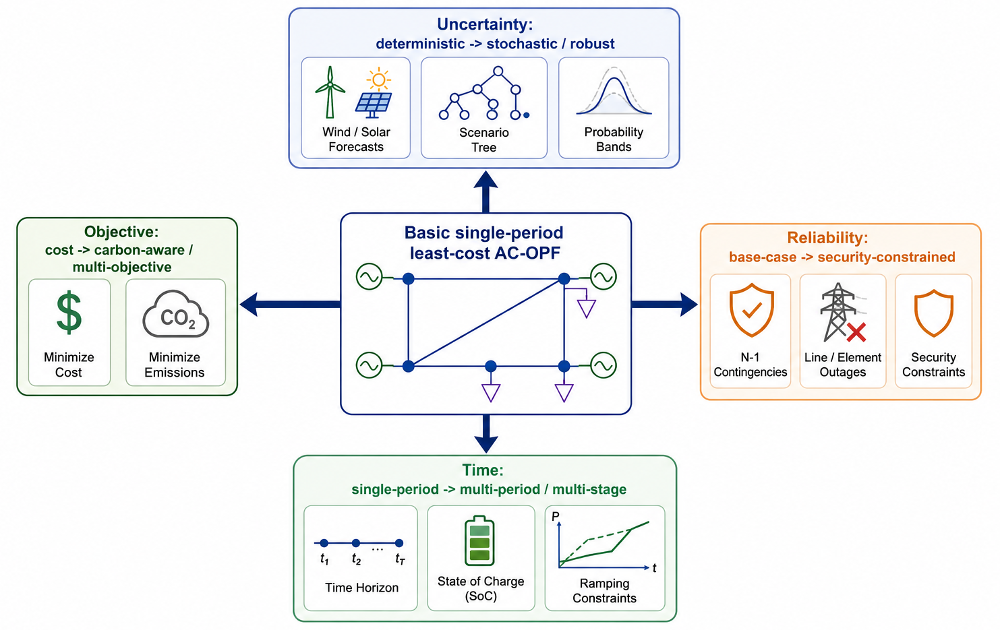



**Figure 9: Four-axis map of modern OPF formulations.** The figure organizes modern OPF extensions by objective, time, uncertainty, and reliability. (*Image note*: AI-assisted illustration created for tutorial use)

Read modern OPF as four extensions of the basic formulation:

1. **Objective:** cost-only dispatch can become carbon-aware, renewable-aware, resilience-aware, or multi-objective dispatch.
2. **Time:** one-snapshot OPF can become multi-period or multi-stage OPF with ramping, storage, and forecast updates.
3. **Uncertainty:** fixed load and renewable inputs can become stochastic, robust, or chance-constrained inputs.
4. **Reliability:** base-case feasibility can become security-constrained feasibility under line, generator, or topology contingencies.


#### Formulation Map

Read modern OPF as targeted extensions of the basic single-snapshot, least-cost AC-OPF problem. The table highlights what changes first, what extra data are needed, and why the change matters for ML.

| OPF formulation | Main change relative to basic AC-OPF | Typical new data needed | ML implication |
|---|---|---|---|
| Basic least-cost AC-OPF | Minimize generator operating cost for one network snapshot | Network model, load, generator limits, cost curves | Good first supervised-learning target and feasibility testbed |
| Carbon-aware OPF | Add emissions terms, carbon prices, carbon budgets, or cost-emission tradeoffs | Generator emission rates, fuel types, carbon intensity, policy targets | Labels and metrics change because cheapest dispatch may not be lowest-emission dispatch |
| Multi-period / multi-stage OPF | Couple decisions across time through ramping, storage, demand response, and forecast updates | Load/renewable time series, storage parameters, ramp limits | Model must learn temporal coupling, not only one-shot dispatch |
| Stochastic OPF | Optimize expected performance across forecast scenarios | Scenario sets, scenario probabilities, forecast distributions | Labels depend on scenario design and risk preference |
| Robust OPF | Require feasibility under a prescribed uncertainty set | Bounds for demand, renewable output, outages, or model error | Improves out-of-distribution reliability but may be conservative |
| Chance-constrained OPF | Limit violation probability instead of enforcing every scenario | Probability models and acceptable risk levels | Connects ML uncertainty estimates with operational risk metrics |
| Security-constrained OPF | Enforce limits under contingencies, often N-1 line or generator outages | Contingency list, post-contingency limits, corrective-action rules | Base-case low MSE is not enough if contingency constraints fail |


#### Additional Grid-Control and Planning Extensions

The formulation map above changes the objective, time horizon, uncertainty model, or reliability rule. Real-grid studies can also change the controllable devices and planning decisions represented inside the optimization problem. For example, **OLTC transformers**, **shunts**, and **AVR-equipped generators** add controllable voltage-support behavior that is not represented in the simple 5-bus tutorial case. These devices change the decision variables and may require richer OPF models or additional constraints.

A separate planning direction is **interconnection queues** and **transmission expansion**, where mixed-integer OPF or related planning models include build/no-build decisions for candidate lines, transformers, storage, or other grid upgrades. These are future directions beyond the current AC-OPF surrogate-learning scope; they are not capabilities of the trained tutorial models above.

The common message is that real-grid ML does not only scale the number of buses. It can also change the controllable devices, decision variables, and feasibility checks. The formulation map is therefore a starting point, not an exhaustive list. Next, we zoom in on carbon-aware OPF because it is the smallest runnable extension in this notebook: the objective changes, while the basic AC feasibility constraints can stay the same.


#### Example: Carbon-Aware OPF

Carbon-aware OPF is a useful first modern extension because it changes the **objective** while keeping the same AC power-balance equations and operating limits. In other words, the feasible set can stay close to the basic AC-OPF problem, but the preferred dispatch changes:

**least cost** $\rightarrow$ **cost plus emissions**.

Carbon settings are not fixed universal constants. A carbon price or emissions weight can vary across policy designs, emissions-market prices, carbon-tax schedules, utility planning assumptions, time-varying marginal emissions, or decarbonization scenarios. If that setting varies across samples, it should become part of the ML input:

$$
z_i \rightarrow x_i^* \quad \text{becomes} \quad
(z_i, \lambda_{\text{CO2}}) \rightarrow x_i^*(\lambda_{\text{CO2}}).
$$


**Formulation.** Let $x = (P_G, Q_G, V_m, \theta)$ collect the usual AC-OPF decision variables, and let $e_g$ denote the emission rate of generator $g$. For a single-period problem with time step $\Delta t$,

$$
E_{\text{gen}}(x) = \Delta t \sum_{g \in G} e_g P_{G,g}.
$$

A simple carbon-price OPF adds this emissions term to the generation-cost objective:

$$
\begin{aligned}
\min_{P_G,Q_G,V_m,\theta} \quad
& \sum_{g \in G} C_g(P_{G,g}) + \lambda_{\text{CO2}} E_{\text{gen}}(x) \\
\text{s.t.} \quad
& \text{the same AC power-balance, generator-limit, voltage-limit,} \\
& \text{branch-flow, branch-angle, and reference-angle constraints.}
\end{aligned}
$$

When $\lambda_{\text{CO2}}=0$, this reduces to the least-cost AC-OPF used earlier. As $\lambda_{\text{CO2}}$ increases, the optimizer is encouraged to shift generation away from high-emission units when the network and generator limits allow it.


**Runnable objective-change example.** PYPOWER stores generator costs in `gencost`. For the simple carbon-price case, we only add $\lambda_{\text{CO2}} e_g$ to each generator's linear cost coefficient. The solver still solves a standard AC-OPF, but the objective now includes emissions. The emission rates below are illustrative; research studies should use documented sources such as PGLib-CO2 or plant/fuel data.


In [75]:
# Carbon-price OPF example: change only the objective, keep the same AC constraints.
from pypower.idx_cost import COST

carbon_case = copy.deepcopy(net)
least_cost_case = copy.deepcopy(net)

# Illustrative generator emission rates in ton CO2/MWh.
# Lower values represent cleaner generators; higher values represent more carbon-intensive generators.
emission_rate_ton_per_mwh = np.array([0.10, 0.20, 0.55, 0.75, 0.95])
carbon_price_per_ton = 80.0

# PYPOWER polynomial cost with NCOST=3 stores the linear coefficient at COST + 1.
carbon_case['gencost'][:, COST + 1] += carbon_price_per_ton * emission_rate_ton_per_mwh

opf_options = ppoption(VERBOSE=0, OUT_ALL=0)
least_cost_result = runopf(least_cost_case, opf_options)
carbon_price_result = runopf(carbon_case, opf_options)
if not least_cost_result['success']:
    raise RuntimeError('Least-cost AC-OPF did not converge in the carbon-aware example.')
if not carbon_price_result['success']:
    raise RuntimeError('Carbon-price AC-OPF did not converge in the carbon-aware example.')


def generator_emissions(result, emission_rate, hours=1.0):
    pg_mw = result['gen'][:, idx_gen.PG]
    return hours * np.sum(pg_mw * emission_rate)


def original_generation_cost(result, reference_case):
    pg_mw = result['gen'][:, idx_gen.PG]
    quad_coef = reference_case['gencost'][:, COST]
    lin_coef = reference_case['gencost'][:, COST + 1]
    const_coef = reference_case['gencost'][:, COST + 2]
    return np.sum(quad_coef * pg_mw**2 + lin_coef * pg_mw + const_coef)


def summarize_opf_result(label, result):
    pg_mw = result['gen'][:, idx_gen.PG]
    return {
        'case': label,
        'generation_cost_$': original_generation_cost(result, net),
        'dispatch_emissions_tco2': generator_emissions(result, emission_rate_ton_per_mwh),
        'carbon_price_objective_$': result['f'],
        **{f'Pg{g+1}_MW': pg for g, pg in enumerate(pg_mw)},
    }


carbon_opf_comparison = pd.DataFrame([
    summarize_opf_result('least-cost OPF', least_cost_result),
    summarize_opf_result('carbon-price OPF', carbon_price_result),
])

carbon_opf_comparison.round(3)


,case,generation_cost_$,dispatch_emissions_tco2,carbon_price_objective_$,Pg1_MW,Pg2_MW,Pg3_MW,Pg4_MW,Pg5_MW
0,least-cost OPF,17551.892,663.633,17551.892,40.0,170.0,324.498,0.0,470.694
1,carbon-price OPF,21433.385,582.722,68051.111,40.0,170.0,520.000,0.0,272.338


**Intuition and key message.** The carbon-price case keeps the same AC feasibility constraints as the basic OPF, but changes which feasible dispatch is preferred. Cleaner generators may be dispatched more often, original operating cost may increase, and emissions may decrease. Therefore, carbon-aware OPF labels are not interchangeable with least-cost OPF labels: the optimization problem has changed.

Richer variants, such as emissions budgets, cost-emission Pareto curves, multi-period storage/ramping, stochastic OPF, or security-constrained OPF, require richer data and solver support. Here we only use the smallest runnable objective change to show the idea.


#### What Changes for ML?

Modern OPF extensions change both the learning target and the evaluation metrics:

* **Inputs/context:** carbon price, emissions cap, time index, forecast scenario, or contingency set may need to be included as model context.
* **Labels:** least-cost OPF labels, carbon-aware labels, multi-period labels, and security-constrained labels solve different optimization problems.
* **Loss/evaluation:** MSE and cost gap are not enough; relevant metrics may include emissions gap, power-balance residuals, limit violations, contingency violations, and runtime.
* **Documentation:** dataset cards should state the OPF formulation, emissions factors, uncertainty assumptions, time horizon, and reliability rules used to generate labels; model cards should state the same scope and limitations.

💬 **Discussion prompt.** Pick one extension above. What would need to change in this notebook's dataset card, model inputs, model outputs, loss function, evaluation table, and model card?


<a name="summary"></a>
## **Summary and Key Takeaways**

This tutorial built a complete learning loop of AI for AC-OPF:

* Start from climate and renewable-grid motivation.
* Translate a 5-bus network into AC-OPF variables, constraints, and solver outputs.
* Use OPFLearn Case 5 data to train a baseline MLP surrogate.
* Evaluate predictions with OPF-aware metrics: MSE, cost gap, power-balance residuals, limit violations, runtime, and emissions.
* Improve and extend the baseline with bounded outputs, penalty/self-supervised losses, GNNs, transformers, and augmented Lagrangian training.
* Document datasets, models, limitations, and future extensions before making claims about usefulness.

💡 **Technical takeaway:** ML-for-OPF is not just vector prediction. A useful model must be evaluated against the optimization problem it approximates.

⚠️ **Responsible-use takeaway:** A neural OPF surrogate does not guarantee AC feasibility or operational safety. Solver verification, feasibility repair, uncertainty testing, dataset documentation, model cards, and careful scope statements are required before operational use.


<a name="open-challenges-summary"></a>
### Open Challenges and Evaluation Checklist

The tutorial results should be read as a starting point, not a final benchmark. A useful ML-for-OPF model is not judged by prediction error alone; it must be evaluated as part of an optimization workflow: feasibility, decision quality, robustness, solver interaction, and reporting all matter.


| Challenge area | Core question | Useful evaluation metrics |
|---|---|---|
| Feasibility and safety | Does the prediction satisfy AC power balance and engineering limits, before and after repair? | Feasibility rate, mean/max violation, power-flow mismatch, repair success rate |
| Decision quality | Does the prediction lead to a good dispatch, not just a low MSE vector? | Objective gap, regret, cost-emissions tradeoff, post-repair cost gap |
| Generalization and risk | Does the model work under new loads, topologies, contingencies, renewable uncertainty, or stress cases? | OOD tests, topology-transfer tests, N-1/N-2 performance, tail-risk/CVaR violation metrics |
| Solver integration | Can ML safely accelerate or guide an optimization workflow? | Solver convergence rate, iteration reduction, wall-clock speedup, warm-start success, verified feasible-solution rate |
| Documentation and footprint | Are data assumptions, model scope, compute cost, and emissions transparent? | Dataset-card/model-card completeness, unit checks, reproducibility, train/inference time, energy use, kg CO2eq |


**How this connects back to this tutorial.** Part 4 introduced the first layer of this evaluation mindset: MSE, cost gap, power-balance mismatch, bound violations, branch-flow and angle violations, runtime, and training emissions. Part 6 then showed that changing the OPF formulation changes the ML target. Larger research studies should extend the same idea to topology transfer, contingencies, uncertainty, repair, solver integration, and carbon-aware objectives.


<a name="next-steps"></a>
### Next Steps

Use the completed tutorial as a launch point rather than an endpoint.

* **Larger supervised OPF:** rerun the workflow on larger OPFLearn or PGLib-OPF cases; compare MSE, cost gap, violations, runtime, and emissions.
* **Carbon-aware OPF:** add generator emissions using PGLib-CO2; compare least-cost and carbon-aware dispatch.
* **Graph learning:** move from the tutorial GNN to PyTorch Geometric or DGL graph-learning pipelines with explicit node, edge, and topology features.
* **Sequential operation:** try Grid2Op/L2RPN-style environments to study multi-step grid control.
* **Energy-system planning:** explore PyPSA-Eur or PyPSA-Earth to understand how multi-period planning differs from single-snapshot AC-OPF.
* **Responsible reporting:** fill dataset cards and model cards for each new experiment.

The resource list below is organized to support these next steps: first datasets and benchmarks, then model, algorithm, and software tools.


<a name="useful-resources-for-future-exploration"></a>
### Useful Resources

The resources below are an appendix-style exploration index, not a required reading list for the tutorial session. They are grouped into datasets/benchmarks and models/algorithms/software tools.

#### Datasets and Benchmarks

| Resource | What it provides | Why it is useful after this tutorial |
|---|---|---|
| [OPFLearnData](https://data.nlr.gov/submissions/177) | AC-OPF datasets generated with OPFLearn.jl, including load profiles and optimal primal/dual solutions | Direct continuation of the dataset used in this tutorial |
| [Power Grid Lib](https://power-grid-lib.github.io/) | Benchmark repositories for validating power-system algorithms | Broad entry point for community-curated power-system benchmarks |
| [PGLib-OPF](https://github.com/power-grid-lib/pglib-opf) | Curated AC-OPF benchmark cases in MATPOWER format | Standard benchmark family beyond the 5-bus case |
| [PGLib-CO2](https://github.com/jacobcho0103/PGLib-CO2) | Carbon-enhanced PGLib-style cases with generator fuel/emission information | Natural next dataset for carbon-aware OPF |
| [OPFData](https://arxiv.org/abs/2406.07234) | Large-scale AC-OPF datasets with topological perturbations | Useful for robustness to topology changes and transfer |
| [PFDelta](https://arxiv.org/html/2510.22048v1) | Power-flow benchmark with load, generation, and topology variations, including N/N-1/N-2 contingencies and close-to-infeasible cases | Useful for ML-for-power-flow robustness, topology/outage generalization, and physical-layer model evaluation; complementary to OPF-label datasets |
| [PyTorch Geometric OPFDataset](https://pytorch-geometric.readthedocs.io/en/latest/generated/torch_geometric.datasets.OPFDataset.html) | Graph-learning interface to OPFData/PGLib-derived data | Useful for moving from graph-feature tables to a PyG GNN pipeline |
| [Microsoft GridSFM Dataset](https://huggingface.co/datasets/microsoft/GridSFM_US_power_grid) | Public-data-based US transmission-grid models for GridSFM-style research | Useful for larger graph-structured OPF data pipelines |
| [Grid2Op / L2RPN](https://grid2op.readthedocs.io/) | Sequential power-grid operation environments | Useful for topology control and sequential decision-making |
| [MARL2GRID-TR](https://openreview.net/pdf?id=mpAMH1OyMO) | ICLR 2026 multi-agent RL benchmark for grid topology control, redispatching, curtailment, observability regimes, and safety-critical constraints | Useful for moving beyond single-agent Grid2Op/L2RPN-style control toward cooperative, decentralized, and constrained grid-operation learning |
| [OPF-Gym](https://opf-gym.readthedocs.io/) | Gymnasium-compatible RL environments for OPF problems | Useful for comparing supervised OPF approximation with RL/control formulations |
| [PowerGym](https://github.com/siemens/powergym) | RL environment for Volt-Var control in distribution systems | Useful for seeing how distribution-grid control differs from transmission AC-OPF |


#### Models, Algorithms, and Software Tools

| Resource | What it provides | How it connects to this tutorial |
|---|---|---|
| [Microsoft GridSFM](https://www.microsoft.com/en-us/research/project/gridfm/) | Microsoft Research project on small foundation models for electric grids | Modern topology-aware direction beyond MLP baselines |
| [PowerModels.jl](https://lanl-ansi.github.io/PowerModels.jl/stable/) | Julia/JuMP toolkit for AC-OPF, DC-OPF, relaxations, and variants | Useful for generating labels and testing formulations |
| [MATPOWER](https://matpower.app/manual/matpower/OptimalPowerFlow.html) | MATLAB/Octave toolkit with AC/DC OPF solvers and cases | Classic OPF formulation and solver reference |
| [pandapower](https://pandapower.readthedocs.io/) | Python power-system analysis toolkit with power flow and OPF | Python-native modeling and OPF experiments |
| [PyPSA](https://pypsa.org/) | Python framework for simulating and optimizing power/energy systems | Useful for multi-period planning beyond single-snapshot AC-OPF |
| [PyPSA-Eur](https://github.com/PyPSA/pypsa-eur) | European transmission and sector-coupled energy-system model | Renewable-rich, multi-period European planning scenarios |
| [PyPSA-Earth](https://github.com/pypsa-meets-earth/pypsa-earth) | Global/open energy-system modeling workflow | Open-data grid and energy-system modeling beyond Europe |
| [PyPSA meets Earth ecosystem](https://pypsa-meets-earth.github.io/) | PyPSA-Earth community, data, and tutorials | Reproducible open-data workflows for real-world energy-system modeling |



<a name="references"></a>
### References


**Core OPF and tutorial context**

* **ML-OPF Wiki.** https://energy.hosting.acm.org/wiki/index.php/ML_OPF_wiki
* **PJM 5-bus benchmark provenance.** F. Li and R. Bo, "Small Test Systems for Power System Economic Studies," Proceedings of the 2010 IEEE Power & Energy Society General Meeting.
* **ML-for-OPF survey.** F. Hasan, A. Kargarian, and A. Mohammadi, "A Survey on Applications of Machine Learning for Optimal Power Flow," 2020. https://repository.lsu.edu/eecs_pubs/575/
* **ML-for-OPF tutorial/reference chapter.** F. Fioretto, T. W. K. Mak, and P. Van Hentenryck, "Machine Learning for Optimal Power Flows," Tutorials in Operations Research, 2021. https://doi.org/10.1287/educ.2021.0234

**Selected ML-for-OPF and constrained-learning methods**

**Remark.** The papers below are a small, tutorial-oriented subset of the ML-for-OPF literature. For a broader and more systematically categorized bibliography, see the ML-OPF Wiki.

* **Warm-start learning for AC-OPF.** K. Baker, "Learning Warm-Start Points for AC Optimal Power Flow," 2019. https://arxiv.org/abs/1905.08860
* **Early ML framing for AC-OPF.** N. Guha, Z. Wang, M. Wytock, and A. Majumdar, "Machine Learning for AC Optimal Power Flow," 2019. https://arxiv.org/abs/1910.08842
* **DeepOPF for DC-OPF.** X. Pan, T. Zhao, and M. Chen, "DeepOPF: Deep Neural Network for DC Optimal Power Flow," SmartGridComm 2019. https://arxiv.org/abs/1905.04479
* **DeepOPF for security-constrained DC-OPF.** X. Pan, T. Zhao, M. Chen, and S. Zhang, "DeepOPF: A Deep Neural Network Approach for Security-Constrained DC Optimal Power Flow," 2019. https://arxiv.org/abs/1910.14448
* **Fast supervised AC-OPF surrogate.** A. S. Zamzam and K. Baker, "Learning Optimal Solutions for Extremely Fast AC Optimal Power Flow," SmartGridComm 2020. https://arxiv.org/abs/1910.01213
* **DeepOPF for AC-OPF.** X. Pan, M. Chen, T. Zhao, and S. H. Low, "DeepOPF: A Feasibility-Optimized Deep Neural Network Approach for AC Optimal Power Flow Problems," 2020. https://arxiv.org/abs/2007.01002
* **DeepOPF+ for feasibility.** T. Zhao, X. Pan, M. Chen, A. Venzke, and S. H. Low, "DeepOPF+: A Deep Neural Network Approach for DC Optimal Power Flow for Ensuring Feasibility," 2020. https://arxiv.org/abs/2009.03147
* **GNN for OPF.** D. Owerko, F. Gama, and A. Ribeiro, "Optimal Power Flow Using Graph Neural Networks," ICASSP 2020. https://arxiv.org/abs/1910.09658
* **Lagrangian dual ML for AC-OPF.** F. Fioretto, T. W. K. Mak, and P. Van Hentenryck, "Predicting AC Optimal Power Flows: Combining Deep Learning and Lagrangian Dual Methods," AAAI 2020. https://doi.org/10.1609/aaai.v34i01.5403
* **AC-OPF solver emulation.** K. Baker, "Emulating AC OPF solvers for Obtaining Sub-second Feasible, Near-Optimal Solutions," 2020. https://arxiv.org/abs/2012.10031
* **DC3 constrained learning.** P. L. Donti, D. Rolnick, and J. Z. Kolter, "DC3: A learning method for optimization with hard constraints," ICLR 2021. https://openreview.net/forum?id=V1ZHVxJ6dSS
* **Physics-informed neural networks for AC-OPF.** R. Nellikkath and S. Chatzivasileiadis, "Physics-Informed Neural Networks for AC Optimal Power Flow," 2021. https://arxiv.org/abs/2110.02672
* **DeepOPF-V for AC-OPF.** W. Huang, X. Pan, M. Chen, and S. H. Low, "DeepOPF-V: Solving AC-OPF Problems Efficiently," IEEE Transactions on Power Systems, 2021. https://arxiv.org/abs/2103.11793
* **Unsupervised GNN for OPF.** D. Owerko, F. Gama, and A. Ribeiro, "Unsupervised Optimal Power Flow Using Graph Neural Networks," 2022. https://arxiv.org/abs/2210.09277
* **GridSFM white paper.** "GridSFM: A Foundation Model for AC Optimal Power Flow," Microsoft Research, 2026. https://www.microsoft.com/en-us/research/wp-content/uploads/2026/05/GridFM_white_paper.pdf

